# This notebook is ultimately for using ensembles with pipeline to assay pan-cancer with dfHarmonized
* On RIS, use env_autogluon-RIS-Python3-9 environment

In [327]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go
from matplotlib import colors
import os
from numpy import ma
#from plotly.subplots import make_subplots
#import tkinter as tk
import seaborn as sns
pd.set_option('display.max_columns',200)
#%matplotlib inline # turn off when using script
import plotnine as p9
from plotnine import *
from plotnine.data import *
#from mizani.formatters import scientific_format
#import altair as alt
from sklearn.preprocessing import StandardScaler
from scipy import stats
from scipy.stats import zscore
from sklearn.decomposition import PCA
from natsort import natsorted
#import ipywidgets
#from operator import itemgetter
#import nglview as nv
#from ipywidgets import Box # to control nglview widget size
#print('nglview version is ' + nv.__version__)
from glob import glob
import glob
#import mdtraj as md #pip install mdtraj --upgrade # to upgrade (using terminal of course)
#import logging
#import pickle
#import json
#import itertools
#import argparse
#from glob import glob
#import sys
#import gromacs # pip install gromacswrapper https://github.com/giribio/MDNotebooks
#import gromacs.fileformats
from statistics import mean
#from platform import python_version
#print("python version is: " + python_version())
#import pandas_profiling
#from pprint import pprint
import shutil
import random
from scipy.stats import shapiro, skew
from sklearn.preprocessing import FunctionTransformer
import logging
import json
import copy
import lime
import lime.lime_tabular

logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)
logging.basicConfig()

import joblib
import sklearn.model_selection
import sklearn.datasets
import sklearn.metrics
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score, auc
from sklearn.linear_model import LogisticRegression
#from sklearn.metrics import plot_roc_curve
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.calibration import CalibratedClassifierCV
#from sklearn.inspection import plot_partial_dependence, permutation_importance
#from sklearn.metrics import RocCurveDisplay, plot_confusion_matrix, plot_precision_recall_curve, roc_curve
from sklearn import preprocessing
#import PipelineProfiler
from joblib import dump, load
import scikitplot as skplt
from sklearn.metrics import classification_report
# from kaggle wine notebook: https://www.kaggle.com/code/lusfernandotorres/wine-quality-eda-prediction-and-deploy/notebook
import optuna
# Statistics & Mathematics
import scipy.stats as stats
from scipy.stats import shapiro, skew
import math
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import cross_val_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.feature_selection import RFECV, RFE
from sklearn.feature_selection import SelectKBest, chi2

# Machine Learning Pipeline & process
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin

# Preprocessing data
from sklearn.preprocessing import RobustScaler, StandardScaler, QuantileTransformer, FunctionTransformer, MinMaxScaler, PowerTransformer

from sklearn.compose import ColumnTransformer

# Model Selection for Cross Validation
from sklearn.model_selection import StratifiedKFold, KFold, train_test_split

# Machine Learning metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, cohen_kappa_score, make_scorer, accuracy_score

# ML classifiers
from sklearn import tree
from sklearn.ensemble import HistGradientBoostingClassifier, AdaBoostClassifier, RandomForestClassifier
from sklearn.ensemble import StackingClassifier, VotingClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import ExtraTreeClassifier

from sklearn.cluster import KMeans
from sklearn.metrics import f1_score, matthews_corrcoef

import optuna

import random

# Encoder of categorical variables
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

# Hiding warnings 
import warnings
warnings.filterwarnings("ignore")
plotly_template = 'simple_white'

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import RidgeClassifier, SGDClassifier, ElasticNetCV, LassoLarsCV, ElasticNet
from xgboost import XGBClassifier

from sklearn.model_selection import cross_val_score
from sklearn.metrics import balanced_accuracy_score

In [4]:
# for HPC to match local python

#pip install scikit-learn==1.3.2
#!pip install catboost==1.2.3
#!pip install xgboost==2.0.3
#!pip install lightgbm==4.3.0
#!pip install joblib==1.3.2
#!pip install optuna==3.5.0
#!pip install numpy==1.23.4
#!pip install pandas==2.0.0

In [5]:
# make these way up here so they don't get overwritten

dfTrainModelEvalAllSeeds = pd.DataFrame()
seedListStats = []
trainFracListStats = []
finalClassifierList = []
tunedClassifierListForValidation = []
finalImportancesMeanList = []
finalFeaturesList = []

y_testList = []
y_predList = []
y_probList = []
seedList = []
seedListStats = []
trainFracListStats = []

In [6]:
import os
os.chdir('/Users/jasonheld/Manuscripts/2022_Sarcoma-Exosomes/vanTine_001_FinalDataWithControls')
#os.chdir('/storage1/fs1/jheld/Active/Jason/Manuscripts/2022_Sarcoma-Exosomes/vanTine_001_FinalDataWithControls')
print('Python working directory is ' + os.getcwd()) # get working directory

Python working directory is /Users/jasonheld/Manuscripts/2022_Sarcoma-Exosomes/vanTine_001_FinalDataWithControls


In [881]:
# key parameters
seed = 7 # don't use 0, I'm pretty sure its the same as 1
np.random.seed(7) # match seed
target = 'dfHarmonizedCancer' # 'sensitivity', 'cancer', 'dfHarmonizedCancer'
quantType = 'areaHarmonized' # 'Intensity_Raw', 'areaHarmonized', 'NormalizedIntensity_Log2'
trainFrac = .75 # always 0.75 for dfSarcoma and dfHarmonized
nJobs = 6

#nSamplesVal = 30 # 30 for sensitivity, 35 for cancer
if target ==  'sensitivity': # total of 40 samples, since all pre.
    nSamplesVal = 35 # ? for dfSarcoma
if target ==  'cancer': # which is more unbalanced
    nSamplesVal = 35 # 35 for dfSarcoma FINAL!
if target ==  'dfHarmonizedCancer': # which is more unbalanced
    nSamplesVal = 60 # 60 is final

In [882]:
def X_y_split(df, target):
    
    '''
    This function takes a dataframe and a target variable to create an X (predictors) dataframe and a y Series
    '''
    
    categorical_features = []
    continuous_features = []
    binary_features = []
    
    for col in df.columns:
        if df[col].dtype == object:
            categorical_features.append(col)
        
        else:
            if df[col].nunique() <= 2:
                binary_features.append(col)
            else:
                continuous_features.append(col)
                
    if categorical_features: # if this list isn't empty
        if target in categorical_features:
            categorical_features.remove(target)
        df.drop(categorical_features, axis = 1, inplace = True)

    X, y = df.drop([target], axis = 1), df[target]

    # Printing info on X and y
    print(f'\nX shape: {X.shape}\n')
    print(f'\n{len(X)} Samples \n')
    print(f'\n{len(X.columns)} Attributes \n')
    display(X.head(5))
    print('\n')
    print(f'\ny shape: {y.shape}\n')
    print(f'\n{len(y)} Samples \n')
    display(y.head(5))
    
    return X, y
    #print(X)

In [883]:
def columns_catNumOrBin(df):
    """
    This function prints some basic info on the dataset.
    """
    categorical_features = []
    continuous_features = []
    binary_features = []
    
    for col in df.columns:
        if df[col].dtype == object:
            categorical_features.append(col)
        else:
            if df[col].nunique() <= 2:
                binary_features.append(col)
            else:
                continuous_features.append(col)
    return categorical_features,continuous_features, binary_features

In [884]:
# assumes all quant cols, no target or anything that shoudn't be numerically imputed

def imputeWideDFMinOr0(df):

    print('quantType is ' + quantType) # QC
    
    for col in df.columns:
        #print(col)

        if df[col].dtype == object:
            continue
        
        else:
        
            if quantType == 'NormalizedIntensity_Log2':
                df[col].fillna(value = df[col].min(), inplace = True)
                #print('imputing with min')
            
            if quantType == 'Intensity_Raw': # min makes sense even for intensity
                df[col].fillna(value = df[col].min(), inplace = True)
                #df[col].fillna(value = 0, inplace = True)
                #print('imputing with min even though Raw_Intensity')

            if quantType == 'areaHarmonized': # i think min makes sense
                #df[colToImpute].fillna(value = 0, inplace = True)
                df[col].fillna(value = df[col].min(), inplace = True)
        
    return df

In [885]:
# make pipeline

pipeline = Pipeline(steps=[
    ('Transforming Distribution',  RobustScaler(with_centering = True, with_scaling = True, quantile_range=(25, 75), unit_variance = False)),
    ('Standard Scaler', StandardScaler()),
#    ('RFE', RFECV(estimator=RandomForestClassifier(random_state=seed), cv=cv, scoring=make_scorer(quadratic_weighted_kappa), n_jobs = nJobs)),
    ('Model', None),
]#, verbose=True,
)

pipeline

Pipeline(steps=[('Transforming Distribution',
                 RobustScaler(quantile_range=(25, 75))),
                ('Standard Scaler', StandardScaler()), ('Model', None)])

In [886]:
# load key variables if on disk

dfTrain = pd.read_excel('dfTrain_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')
#dfTest = pd.read_excel('dfTest_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

# RFECV
fileName = 'selectedFeaturesRFECV_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
with open(fileName + '.json', 'r') as f:
    selected_featuresFromDisk = json.load(f)

print ("There are " + str(len(selected_featuresFromDisk)) + " selected features")

# filter dfTrain with RFE list
colsToKeep = []
colsToKeep = copy.deepcopy(selected_featuresFromDisk)
colsToKeep.append(target)
#print(colsToKeep) # QC
dfTrain = dfTrain[colsToKeep] # selected features from RFE

X, y = X_y_split(dfTrain, target)

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = pd.Series(le.fit_transform(y))
categorical_features,continuous_features, binary_features = columns_catNumOrBin(X)

imputeWideDFMinOr0(X)

There are 239 selected features

X shape: (107, 239)


107 Samples 


239 Attributes 



,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,AMBP,ANGPTL6,ANK1,APCS,APOA1,APOA4,APOB,APOC1,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C2,C3,C4A,C4B,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAVIN2,CD14,CD5L,CETP,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFI,CFL1,CFP,CLEC3B,CLIC1,CLU,COLEC10,COLEC11,CP,CPN1,CPN2,DCD,ECM1,EHD1,EIF5A,EPB42,EZR,F11,F13A1,F13B,F2,F8,FBLN1,FCGBP,FCN2,FCN3,FERMT3,FGA,FGB,FGG,FN1,FTH1,FTL,GNAI2,GNAI3,GNB4,GSN,H4C1; H4C2; H4C3; H4C4; H4C5; H4C6; H4C8; H4C9; H4C11; H4C12; H4C13; H4C14; H4C15; H4C16,HBB,HLA-A,HLA-B,...,IGKV1-27,IGKV1-5,IGKV1-6,IGKV1-8,IGKV2-24,IGKV2-29,IGKV2D-30,IGKV3-11,IGKV3-7,IGKV3D-15,IGKV3D-20,IGKV3OR2-268,IGKV4-1,IGLC3,IGLL5,IGLV1-51,IGLV2-18,IGLV2-23,IGLV2-8,IGLV3-1,IGLV3-10,IGLV3-16,IGLV3-9,IGLV4-69,IGLV7-46,IGLV8-61,ITGA2B,ITGB3,ITIH1,ITIH2,JCHAIN,KLKB1,KNG1,KRT6C,KRT76,KRT77,LBP,LGALS3BP,LRG1,LTBP1,MASP1,MASP2,MBL2,MMRN1,MSN,OIT3,ORM2,P4HB,PARVB,PF4,PF4V1,PGK1,PGLYRP2,PIGR,PKM,PLG,PON1,POTEF,POTEI,PRDX2,PRDX6,PRG4,PROS1,PSMA1,RAB1A,RAB1B,RAC2,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTB,SVEP1,TFRC,THBS1,TLN2,TPM3,TUBA8,UGT8,VCL,VIM,VWF
0,-0.423379,-0.024570,0.026106,NaN,NaN,NaN,NaN,-0.395340,0.244759,0.418586,1.189437,2.128079,0.705446,NaN,-0.151254,0.781108,1.647967,1.518544,1.367172,1.268761,1.954510,0.776775,1.159319,1.651222,-0.183539,1.055485,0.340198,NaN,-1.266304,-0.331574,-0.067143,-1.805522,0.760298,1.156325,1.216054,0.523083,0.163156,-0.906817,1.442320,1.067475,0.287518,1.095179,0.493775,-0.564649,-0.466071,-0.073373,-0.439971,-0.437799,0.410093,NaN,NaN,-1.067152,0.829410,0.295900,0.910999,0.146613,-0.160391,0.021132,NaN,-0.365071,NaN,-0.659755,NaN,NaN,1.375369,NaN,NaN,0.942002,NaN,-0.118528,NaN,-0.349957,NaN,NaN,-0.183390,-1.211751,-0.819878,0.351726,0.189522,1.165920,-1.016236,NaN,-0.587752,-0.380614,1.574519,NaN,2.135703,2.144575,2.207828,1.210347,0.237459,1.016293,NaN,NaN,-0.432750,-0.637378,-0.838049,1.995241,NaN,NaN,...,NaN,0.382564,NaN,NaN,-0.539326,-0.430009,-0.464552,NaN,NaN,-0.832486,NaN,NaN,0.896673,1.653103,1.393722,-0.000910,NaN,NaN,0.937280,-0.255059,NaN,0.680646,-0.264457,NaN,NaN,-0.236250,NaN,NaN,0.858298,0.879412,0.768549,0.025134,1.068488,NaN,NaN,NaN,1.136692,0.329421,-0.707764,NaN,-0.405310,NaN,-1.469939,NaN,-0.573676,0.892740,0.992785,NaN,NaN,NaN,NaN,NaN,NaN,0.570860,NaN,1.186000,1.222128,-0.210123,-0.266771,0.522703,NaN,-0.449667,0.813657,NaN,-0.065737,-0.025041,NaN,-0.158670,0.277404,-1.053253,NaN,-0.930025,-0.234277,0.042182,0.311362,1.319249,-0.521016,0.650565,-2.233291,-0.966419,NaN,0.601205,0.423292,-1.334570,0.694314,NaN,0.718612,1.118896,0.204497,-0.402105,-0.349093,1.513985,NaN,NaN,NaN,NaN,1.736182,NaN,NaN,1.481474
1,0.628846,0.946476,0.874163,NaN,NaN,NaN,NaN,NaN,0.372256,0.003020,0.685772,2.513429,0.332382,NaN,NaN,-0.349262,1.607751,0.439434,0.175226,-0.342230,1.372067,NaN,0.678727,1.182397,0.497255,0.544879,0.615175,NaN,-0.577634,0.681667,-0.029312,-0.543242,-0.150366,0.301446,0.002728,-1.252469,NaN,-0.736628,1.319785,1.232875,0.250177,0.437407,-0.074702,-0.861149,-1.110222,NaN,NaN,-0.725036,-0.002356,-0.034981,NaN,NaN,1.635264,NaN,0.606937,-0.690165,NaN,-0.930782,NaN,-0.940686,0.110114,NaN,NaN,-1.460775,1.017305,NaN,NaN,1.250899,NaN,-1.841737,1.500215,NaN,0.282864,NaN,NaN,-1.288457,-2.413018,-0.579196,NaN,0.630306,NaN,NaN,0.321121,0.028344,1.341799,0.011059,1.239865,1.469264,1.454172,NaN,NaN,-1.155189,-0.697516,-0.856467,-0.185423,-1.059937,NaN,1.196041,NaN,-0.417369,...,NaN,-0.255655,NaN,NaN,NaN,-0.023595,0.232716,0.472542,-2.485493,NaN,0.000280,-2.098677,0.684590,2.048097,2.100674,0.408224,0.012415,0.187570,0.524133,0.007784,0.029769,NaN,-0.624281,NaN,0.870643,NaN,0.121924,0.386349,0.270353,0.147365,1.549012,-0.702123,0.597436,0.829643,0.738318,1.199085,NaN,0.539242,-0.382187,NaN,-1.170204,NaN,0.375224,NaN,0.012240,NaN,1.123456,-1.568304,-1.142382,NaN,NaN,-1.




y shape: (107,)


107 Samples 



0    c
1    c
2    c
3    c
4    c
Name: dfHarmonizedCancer, dtype: object

quantType is areaHarmonized


,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,AMBP,ANGPTL6,ANK1,APCS,APOA1,APOA4,APOB,APOC1,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C2,C3,C4A,C4B,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAVIN2,CD14,CD5L,CETP,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFI,CFL1,CFP,CLEC3B,CLIC1,CLU,COLEC10,COLEC11,CP,CPN1,CPN2,DCD,ECM1,EHD1,EIF5A,EPB42,EZR,F11,F13A1,F13B,F2,F8,FBLN1,FCGBP,FCN2,FCN3,FERMT3,FGA,FGB,FGG,FN1,FTH1,FTL,GNAI2,GNAI3,GNB4,GSN,H4C1; H4C2; H4C3; H4C4; H4C5; H4C6; H4C8; H4C9; H4C11; H4C12; H4C13; H4C14; H4C15; H4C16,HBB,HLA-A,HLA-B,...,IGKV1-27,IGKV1-5,IGKV1-6,IGKV1-8,IGKV2-24,IGKV2-29,IGKV2D-30,IGKV3-11,IGKV3-7,IGKV3D-15,IGKV3D-20,IGKV3OR2-268,IGKV4-1,IGLC3,IGLL5,IGLV1-51,IGLV2-18,IGLV2-23,IGLV2-8,IGLV3-1,IGLV3-10,IGLV3-16,IGLV3-9,IGLV4-69,IGLV7-46,IGLV8-61,ITGA2B,ITGB3,ITIH1,ITIH2,JCHAIN,KLKB1,KNG1,KRT6C,KRT76,KRT77,LBP,LGALS3BP,LRG1,LTBP1,MASP1,MASP2,MBL2,MMRN1,MSN,OIT3,ORM2,P4HB,PARVB,PF4,PF4V1,PGK1,PGLYRP2,PIGR,PKM,PLG,PON1,POTEF,POTEI,PRDX2,PRDX6,PRG4,PROS1,PSMA1,RAB1A,RAB1B,RAC2,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTB,SVEP1,TFRC,THBS1,TLN2,TPM3,TUBA8,UGT8,VCL,VIM,VWF
0,-0.423379,-0.024570,0.026106,-1.836067,-1.606185,-1.860046,-2.440891,-0.395340,0.244759,0.418586,1.189437,2.128079,0.705446,-1.840804,-0.151254,0.781108,1.647967,1.518544,1.367172,1.268761,1.954510,0.776775,1.159319,1.651222,-0.183539,1.055485,0.340198,-1.809197,-1.266304,-0.331574,-0.067143,-1.805522,0.760298,1.156325,1.216054,0.523083,0.163156,-0.906817,1.442320,1.067475,0.287518,1.095179,0.493775,-0.564649,-0.466071,-0.073373,-0.439971,-0.437799,0.410093,-2.045295,-2.151962,-1.067152,0.829410,0.295900,0.910999,0.146613,-0.160391,0.021132,-1.708893,-0.365071,-2.685177,-0.659755,-1.897735,-1.843346,1.375369,-2.239239,-2.120862,0.942002,-1.825073,-0.118528,-1.988335,-0.349957,-3.106825,-3.237115,-0.183390,-1.211751,-0.819878,0.351726,0.189522,1.165920,-1.016236,-1.556213,-0.587752,-0.380614,1.574519,-1.277112,2.135703,2.144575,2.207828,1.210347,0.237459,1.016293,-2.854390,-2.324029,-0.432750,-0.637378,-0.838049,1.995241,-2.403735,-2.066398,...,-2.289282,0.382564,-1.887522,-2.254371,-0.539326,-0.430009,-0.464552,-1.840667,-2.485493,-0.832486,-2.315373,-2.098677,0.896673,1.653103,1.393722,-0.000910,-1.378963,-2.023577,0.937280,-0.255059,-1.262751,0.680646,-0.264457,-1.963674,-1.036166,-0.236250,-1.578114,-1.587096,0.858298,0.879412,0.768549,0.025134,1.068488,-2.343658,-2.116144,-1.663329,1.136692,0.329421,-0.707764,-2.732463,-0.405310,-1.515746,-1.469939,-2.046020,-0.573676,0.892740,0.992785,-2.369818,-1.879268,-1.245694,-1.843483,-2.994735,-1.575272,0.570860,-3.435201,1.186000,1.222128,-0.210123,-0.266771,0.522703,-1.003083,-0.449667,0.813657,-2.465108,-0.065737,-0.025041,-1.661488,-0.158670,0.277404,-1.053253,-2.904242,-0.930025,-0.234277,0.042182,0.311362,1.319249,-0.521016,0.650565,-2.233291,-0.966419,-2.206499,0.601205,0.423292,-1.334570,0.694314,-2.44951,0.718612,1.118896,0.204497,-0.402105,-0.349093,1.513985,-1.410128,-1.974323,-1.859943,-1.954009,1.736182,-1.788465,-1.030240,1.481474
1,0.628846,0.946476,0.874163,-1.836067,-1.606185,-1.860046,-2.440891,-2.138182,0.372256,0.003020,0.685772,2.513429,0.332382,-1.840804,-1.852929,-0.349262,1.607751,0.439434,0.175226,-0.342230,1.372067,-2.701234,0.678727,1.182397,0.497255,0.544879,0.615175,-1.809197,-0.577634,0.681667,-0.029312,-0.543242,-0.150366,0.301446,0.002728,-1.252469,-1.631133,-0.736628,1.319785,1.232875,0.250177,0.437407,-0.074702,-0.861149,-1.110222,-0.711261,-0.705220,-0.725036,-0.002356,-0.034981,-2.151962,-1.532902,1.635264,-1.864649,0.606937,-0.690165,-2.621563,-0.930782,-1.708893,-0.940686,0.110114,-2.235871,-1.897735,-1.460775,1.017305,-2.239239,-2.120862,1.250899,-1.825073,-1.841737,1.500215,-2.002856,0.282864,-3.237115,-1.822334,-1.288457,-2.413018,-0.579196,-1.249187,0.630306,-2.169645,-1.556213,0.32

In [887]:
y#.head()

0      0
1      0
2      0
3      0
4      0
      ..
102    1
103    1
104    1
105    1
106    1
Length: 107, dtype: int64

In [888]:
# Defining CV strategy trying RepeatedStratifiedKFold
from sklearn.model_selection import RepeatedStratifiedKFold

if target ==  'sensitivity':
    # typically n_splits = 3
    cv = RepeatedStratifiedKFold(n_splits=4, n_repeats=5, random_state = seed)
    cv_splits = list(cv.split(X,y))

if target ==  'cancer': # which is more unbalanced
    cv = RepeatedStratifiedKFold(n_splits=4, n_repeats=5, random_state = seed)
    cv_splits = list(cv.split(X,y))

if target ==  'dfHarmonizedCancer': # 10 final
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state = seed)
    cv_splits = list(cv.split(X,y))

# End of loading steps if using saved, tuned classifiers

In [1053]:
%matplotlib inline

!python --version

# Step 1: ### load dfHarmonized, which was made in another notebook (SarcomaExosomes_Hoshino_V04_TryingToMatchSensResPROMS.ipynb)

* use 'areaHarmonized', which is what I used for stats
* this seems to already be filtered for 15 detections in that notebook 

In [554]:
# needs index_col=0 to not dupliate the index for some reason

dfHarmonized = pd.read_excel('/Users/jasonheld/Manuscripts/2022_Sarcoma-Exosomes/Figure2_Data_CancerVsNormal/dfHarmonized.xlsx', index_col=0)
dfHarmonized.rename({'cancer':'dfHarmonizedCancer'}, axis='columns', inplace = True)
dfHarmonized.head()

,dataType,dataset,dfHarmonizedCancer,race,gender,cancerType,group,sensitivity,sample,age,patient,timing,protAcc,area,species,category,sampleType,Reviewed,Protein names,geneNamePrimary,nSamples,areaScaled,areaHarmonized,areaHarmonizedAntilog
0,Intensity_Raw,sarcoma,c,WHITE,M,EPI,S.Pre,S,BJW.S.Pre,30-39,BJW,Pre,A0A075B6H7,380140.0,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.158046,0.999174,1.998855
1,Intensity_Raw,sarcoma,c,WHITE,M,LS,R.Pre,R,BPA.R.Pre,50-59,BPA,Pre,A0A075B6H7,120820.0,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.824573,0.292549,1.224802
2,Intensity_Raw,sarcoma,c,WHITE,M,LS,S.Pre,S,BPE.S.Pre,60-69,BPE,Pre,A0A075B6H7,106800.0,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.763513,0.357283,1.281011
3,Intensity_Raw,sarcoma,c,WHITE,F,LS,S.Pre,S,BPV.S.Pre,50-59,BPV,Pre,A0A075B6H7,50621.0,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-1.288444,-0.199228,0.871016
4,Intensity_Raw,sarcoma,c,WHITE,M,PS/MFH,S.Pre,S,BTK.S.Pre,70-79,BTK,Pre,A0A075B6H7,56696.0,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-1.285697,-0.196317,0.872776


In [555]:
dfHarmonized.shape

(97912, 24)

In [556]:
# already filtered by 15 sample detections
dfHarmonized.nSamples.min()

16

In [557]:
# already filtered by pre treatment or normals
dfHarmonized.timing.value_counts()

timing
Pre        92868
Control     5044
Name: count, dtype: int64

In [558]:
# already filtered by pre treatment or normals
dfHarmonized['sample'].value_counts()

sample
BJE.R.Pre                                    1605
BNV.R.Pre                                    1590
BIE.S.Pre                                    1586
BLZ.R.Pre                                    1584
BMS.S.Pre                                    1575
                                             ... 
MS183640QEp_Alberto_Lyden_P7_epithelioid      242
MS173592QEp_Miho_Lyden_P01-016-B01            230
MS183640QEp_Alberto_Lyden_P5_sarcomatoid      228
MS173238QEp_Ayuko_Lyden_CTRL_44_MOM           224
MS173514QEp_Katharine_Lyden_A5_NBplasma14     222
Name: count, Length: 177, dtype: int64

In [559]:
def tidyDFHarmonized (df): # 'Intensity_Raw', 'NormalizedIntensity_Log2'

    global quantType
    
    #df = df.set_index(df.columns[:5].tolist()) # for Protein_pVals_ToTryPythonNormalizing.xlsx
    #filterCols = [col for col in df if col.startswith('I000')] # select columns with X substring in their name
    #df = df[filterCols] # won't have index columns, so filter then
    #df.reset_index(inplace = True) # then reset the index
    #for col in df.columns: # to force everything to be numeric, a real pain.
    #    df[col] = pd.to_numeric(df[col], errors='coerce')
    #df = df.replace(0, np.nan) # change 0 to NaN
    #df = df.fillna(0) # change NaN to blank ('') e.g. TMT or zero (0) for LFQ, not complete
    df = df.loc[:,~df.columns.str.contains('CON_')] # remove contaminants
    #df = df.query("dataType == @quantType")
    #df = df.query("species == 'human'")
    #df = df.query("timing == 'pre'")
    
    # not using these quant columns
    df.drop(columns = ['areaHarmonizedAntilog', 'areaScaled', 'area'], inplace = True)

    totalCols = df.columns
    numCols = df._get_numeric_data().columns
    catCols = list(set(totalCols)-set(numCols))
    catCols.remove('geneNamePrimary') # i want to keep these
    catCols.remove('sample') # i want to keep these
    catCols.remove(target) # i want to keep these
    #print(catCols)
    #df.drop(catCols, axis=1, inplace = True) # drop later
    
    #remove rows without areas & duplicates
    df.dropna(subset=[quantType], inplace=True)
    df.drop_duplicates(inplace = True)
    
    # store numerical and categorical column in two different variables. It comes handy during visualizaion.
    #totalCols = df.columns
    #numCols = df._get_numeric_data().columns
    #catCols = list(set(totalCols)-set(numCols))
    #df.to_excel('df.xlsx')

    return df

In [560]:
dfHarmonized = tidyDFHarmonized(dfHarmonized)
dfHarmonized

,dataType,dataset,dfHarmonizedCancer,race,gender,cancerType,group,sensitivity,sample,age,patient,timing,protAcc,species,category,sampleType,Reviewed,Protein names,geneNamePrimary,nSamples,areaHarmonized
0,Intensity_Raw,sarcoma,c,WHITE,M,EPI,S.Pre,S,BJW.S.Pre,30-39,BJW,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.999174
1,Intensity_Raw,sarcoma,c,WHITE,M,LS,R.Pre,R,BPA.R.Pre,50-59,BPA,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.292549
2,Intensity_Raw,sarcoma,c,WHITE,M,LS,S.Pre,S,BPE.S.Pre,60-69,BPE,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.357283
3,Intensity_Raw,sarcoma,c,WHITE,F,LS,S.Pre,S,BPV.S.Pre,50-59,BPV,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.199228
4,Intensity_Raw,sarcoma,c,WHITE,M,PS/MFH,S.Pre,S,BTK.S.Pre,70-79,BTK,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.196317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97906,NaN,hoshino,c,NaN,NaN,stomach,NaN,NaN,MS184612LUM_haiying_lyden_P01-035-B01_a,NaN,NaN,Pre,P68036,human,Area,plasma,reviewed,Ubiquitin-conjugating enzyme E2 L3 (EC 2.3.2.2...,UBE2L3,16,-0.541203
97907,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_141_Plasma_a,NaN,NaN,Pre,P68036,human,Area,plasma,reviewed,Ubiquitin-conjugating enzyme E2 L3 (EC 2.3.2.2...,UBE2L3,16,-0.814430
97908,NaN,hoshino,c,NaN,NaN,stomach,NaN,NaN,MS184612LUM_haiying_lyden_P01-035-B01_a,NaN,NaN,Pre,Q05209,human,Area,plasma,reviewed,Tyrosine-protein phosphatase non-receptor type...,PTPN12,39,-1.578453
97910,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_141_Plasma_a,NaN,NaN,Pre,Q05209,human,Area,plasma,reviewed,Tyrosine-protein phosphatase non-receptor type...,PTPN12,39,-1.367615


In [561]:
dfHarmonized.shape

(97392, 21)

In [562]:
dfHarmonized['areaHarmonized'].isna().sum() 

0

In [563]:
def dataframe_description(df):
    """
    This function prints some basic info on the dataset.
    """
    categorical_features = []
    continuous_features = []
    binary_features = []
    
    for col in df.columns:
        if df[col].dtype == object:
            categorical_features.append(col)
        else:
            if df[col].nunique() <= 2:
                binary_features.append(col)
            else:
                continuous_features.append(col)
    
    print("\n{} shape: {}".format(type(df).__name__, df.shape))
    print("\n{:,.0f} samples".format(df.shape[0]))
    print("\n{:,.0f} attributes".format(df.shape[1]))
    print(f'\nMissing Data: \n')
    print(df.isnull().sum())
    print(f'\nDuplicates: {df.duplicated().sum()}')
    print(f'\nData types: \n')
    print(df.dtypes)
    print(f'\nCategorical features: \n')
    if len(categorical_features) == 0:
        print('No Categorical Features')
    else:
        for feature in categorical_features:
            print(feature)
    print(f'\nContinuous features: \n')
    if len(continuous_features) == 0:
        print('No Continuous Features')
    else:
        for feature in continuous_features:
            print(feature)
    print(f'\nBinary features: \n')
    if len(binary_features) == 0:
        print('No Binary Features')
    else:
        for feature in binary_features:
            print(feature)
    print(f'\n{type(df).__name__} Head: \n')
    display(df.head(5))
    print(f'\n{type(df).__name__} Tail: \n')
    display(df.tail(5))

In [564]:
# function from standardFunctions
dataframe_description(dfHarmonized)


DataFrame shape: (97392, 21)

97,392 samples

21 attributes

Missing Data: 

dataType              42575
dataset                   0
dfHarmonizedCancer        0
race                  42575
gender                42575
cancerType                0
group                 42575
sensitivity           47619
sample                    0
age                   42575
patient               42575
timing                    0
protAcc                   0
species               54817
category              54817
sampleType            54817
Reviewed                  0
Protein names             0
geneNamePrimary           0
nSamples                  0
areaHarmonized            0
dtype: int64

Duplicates: 0

Data types: 

dataType               object
dataset                object
dfHarmonizedCancer     object
race                   object
gender                 object
cancerType             object
group                  object
sensitivity            object
sample                 object
age                  

,dataType,dataset,dfHarmonizedCancer,race,gender,cancerType,group,sensitivity,sample,age,patient,timing,protAcc,species,category,sampleType,Reviewed,Protein names,geneNamePrimary,nSamples,areaHarmonized
0,Intensity_Raw,sarcoma,c,WHITE,M,EPI,S.Pre,S,BJW.S.Pre,30-39,BJW,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.999174
1,Intensity_Raw,sarcoma,c,WHITE,M,LS,R.Pre,R,BPA.R.Pre,50-59,BPA,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.292549
2,Intensity_Raw,sarcoma,c,WHITE,M,LS,S.Pre,S,BPE.S.Pre,60-69,BPE,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.357283
3,Intensity_Raw,sarcoma,c,WHITE,F,LS,S.Pre,S,BPV.S.Pre,50-59,BPV,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.199228
4,Intensity_Raw,sarcoma,c,WHITE,M,PS/MFH,S.Pre,S,BTK.S.Pre,70-79,BTK,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.196317



DataFrame Tail: 



,dataType,dataset,dfHarmonizedCancer,race,gender,cancerType,group,sensitivity,sample,age,patient,timing,protAcc,species,category,sampleType,Reviewed,Protein names,geneNamePrimary,nSamples,areaHarmonized
97906,NaN,hoshino,c,NaN,NaN,stomach,NaN,NaN,MS184612LUM_haiying_lyden_P01-035-B01_a,NaN,NaN,Pre,P68036,human,Area,plasma,reviewed,Ubiquitin-conjugating enzyme E2 L3 (EC 2.3.2.2...,UBE2L3,16,-0.541203
97907,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_141_Plasma_a,NaN,NaN,Pre,P68036,human,Area,plasma,reviewed,Ubiquitin-conjugating enzyme E2 L3 (EC 2.3.2.2...,UBE2L3,16,-0.814430
97908,NaN,hoshino,c,NaN,NaN,stomach,NaN,NaN,MS184612LUM_haiying_lyden_P01-035-B01_a,NaN,NaN,Pre,Q05209,human,Area,plasma,reviewed,Tyrosine-protein phosphatase non-receptor type...,PTPN12,39,-1.578453
97910,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_141_Plasma_a,NaN,NaN,Pre,Q05209,human,Area,plasma,reviewed,Tyrosine-protein phosphatase non-receptor type...,PTPN12,39,-1.367615
97911,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_142_Plasma_a,NaN,NaN,Pre,Q05209,human,Area,plasma,reviewed,Tyrosine-protein phosphatase non-receptor type...,PTPN12,39,-2.415058


In [565]:
dfHarmonized.dtypes

dataType               object
dataset                object
dfHarmonizedCancer     object
race                   object
gender                 object
cancerType             object
group                  object
sensitivity            object
sample                 object
age                    object
patient                object
timing                 object
protAcc                object
species                object
category               object
sampleType             object
Reviewed               object
Protein names          object
geneNamePrimary        object
nSamples                int64
areaHarmonized        float64
dtype: object

In [566]:
dfHarmonized.memory_usage(deep = True)

Index                   779136
dataType               5199590
dataset                6233088
dfHarmonizedCancer     5648736
race                   4852936
gender                 4541786
cancerType             6133159
group                  4771142
sensitivity            4410642
sample                 7578343
age                    4761054
patient                4651420
timing                 5863696
protAcc                6170032
species                4393794
category               4351219
sampleType             4436369
Reviewed               6347836
Protein names         16089488
geneNamePrimary        6056882
nSamples                779136
areaHarmonized          779136
dtype: int64

In [567]:
dfHarmonized.memory_usage(deep = True).sum()

114828620

# Filtering (dfHarmonized -> dfFiltered)

In [568]:
def removeCrapome(df):
    crapome =['KRT1', 'KRT2', 'KRT3', 'KRT4', 'KRT5', 'KRT6', 'KRT7', 'KRT8', 'KRT9', 'KRT10', 'KRT11', 'KRT12', 'KRT13', 'KRT14', 'KRT15', 'KRT16', 'KRT17', 'KRT18', 'KRT19', 'KRT20', 'KRT21', 'KRT22', 'KRT23', 'KRT24']
#    df.loc[~df['geneNamePrimary'].str.contains('|'.join(crapome))]
    df.query('geneNamePrimary not in @crapome', inplace = True)

    return df

In [569]:
dfHarmonized.shape

(97392, 21)

In [570]:
dfFiltered = removeCrapome(dfHarmonized)

In [571]:
dfFiltered.shape

(95410, 21)

In [572]:
# QC

dfFiltered.query('geneNamePrimary == "KRT3"').head()
#dfFiltered.query('geneNamePrimary == "UBE2L3"').head() # pos cTL

,dataType,dataset,dfHarmonizedCancer,race,gender,cancerType,group,sensitivity,sample,age,patient,timing,protAcc,species,category,sampleType,Reviewed,Protein names,geneNamePrimary,nSamples,areaHarmonized


In [573]:
# count protein IDs, have to remove 0s NANs first or count doesn't work

def filterNDetectionsPerProtAcc(df, nSamplesVal_):

    global nSamplesVal
    nSamplesVal = nSamplesVal_
    print(nSamplesVal)
    
    #drop 0 values
    #df['areaHarmonized'].replace(0, np.nan, inplace=True)
    #df.dropna(subset = ['areaHarmonized'], inplace = True)
    
    # count - no need already did when making dfHarmonized
    #df['nSamples'] = df.groupby('geneNamePrimary')['geneNamePrimary'].transform('count')
    
    # filter by N detections (MASS should do this)
    df = df.query('nSamples >= @nSamplesVal')

    print('min # of samples is ' + str(df['nSamples'].min()))
    
    return df

In [574]:
#dfFiltered = filterNDetectionsPerProtAcc(dfFiltered, 10)
dfFiltered = filterNDetectionsPerProtAcc(dfFiltered, nSamplesVal)

60
min # of samples is 60


In [575]:
dfFiltered.shape

(46191, 21)

In [576]:
## any NANs?
dfFiltered.isna().sum()#.sum()

dataType              33819
dataset                   0
dfHarmonizedCancer        0
race                  33819
gender                33819
cancerType                0
group                 33819
sensitivity           35766
sample                    0
age                   33819
patient               33819
timing                    0
protAcc                   0
species               12372
category              12372
sampleType            12372
Reviewed                  0
Protein names             0
geneNamePrimary           0
nSamples                  0
areaHarmonized            0
dtype: int64

In [577]:
## any INFs?
#dfFiltered.isinf().sum()#.sum()
np.isinf(dfFiltered['areaHarmonized']).values.sum()
#np.isfinite(dfFiltered['areaHarmonized']) .value_counts()

0

In [578]:
dfFiltered.shape

(46191, 21)

## QC: are sample intensities comparable? 

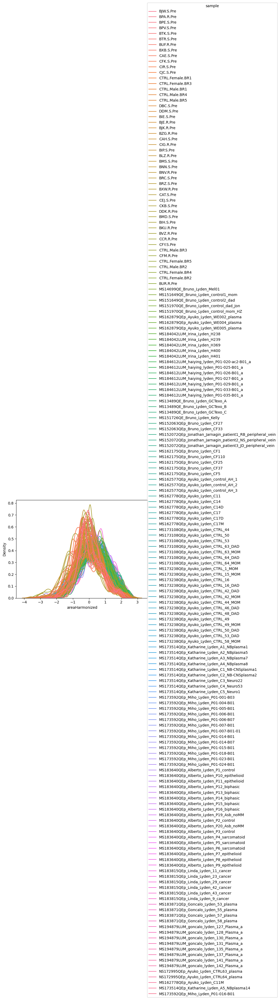

In [579]:
# simply plot distributions. Can be slow when hue = 'sample'
# no idea why this has a problem right now!

df = dfFiltered

ax = sns.kdeplot(df,
    x = 'areaHarmonized', #'area', 'areaScaled'
    hue = 'sample',
    bw_adjust=.5,
#    log_scale=True,
    common_norm = False,
    )

# legend
sns.move_legend(ax, "center right", bbox_to_anchor=(2, 1))

In [580]:
def shapiro_wilk_test(df):
    '''
    This function performs a Shapiro-Wilk test to check if the data is normally distributed or not, as well as skewness
    '''
    print(f'\033[1mShapiro-Wilk Test & Skewness:\033[0m')
    print('\n- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  \n')

    numeric_columns = df.select_dtypes(include=['float', 'int']).columns
    
    global nonNormalFeatures
    nonNormalFeatures = [] # to save the nonNormalFeatures to deal with, if one chooses to do so
    
    for feature in numeric_columns:
        stats, p_value = shapiro(df[feature])

        if p_value < 0.05:
            text = f'{feature} Does Not Seem to be Normally Distributed'
            nonNormalFeatures.append(feature)
        else:
            text = f'{feature} Seems to be Normally Distributed'

        print(f'{feature}')
        print(f'\n  Shapiro-Wilk Statistic: {stats:.2f}')
        print(f'\n  Shapiro-Wilk P-value: {p_value}')
        print(f'\n  Skewness: {np.round(skew(df[feature]), 2)}')
        print(f'\n  Conclusion: {text}')
        print('\n===============================================================================================')

    print('\n- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -  \n')
    print('non-normally distributed features are saved as the nonNormalFeatures variable, which includes these: ' + str(nonNormalFeatures))
    print(f'\033[1mEnd of Shapiro-Wilk Test\033[0m')

In [581]:
dfFiltered

,dataType,dataset,dfHarmonizedCancer,race,gender,cancerType,group,sensitivity,sample,age,patient,timing,protAcc,species,category,sampleType,Reviewed,Protein names,geneNamePrimary,nSamples,areaHarmonized
0,Intensity_Raw,sarcoma,c,WHITE,M,EPI,S.Pre,S,BJW.S.Pre,30-39,BJW,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.999174
1,Intensity_Raw,sarcoma,c,WHITE,M,LS,R.Pre,R,BPA.R.Pre,50-59,BPA,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.292549
2,Intensity_Raw,sarcoma,c,WHITE,M,LS,S.Pre,S,BPE.S.Pre,60-69,BPE,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,0.357283
3,Intensity_Raw,sarcoma,c,WHITE,F,LS,S.Pre,S,BPV.S.Pre,50-59,BPV,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.199228
4,Intensity_Raw,sarcoma,c,WHITE,M,PS/MFH,S.Pre,S,BTK.S.Pre,70-79,BTK,Pre,A0A075B6H7,NaN,NaN,NaN,reviewed,Probable non-functional immunoglobulin kappa v...,IGKV3-7,106,-0.196317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97820,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_131_Plasma_a,NaN,NaN,Pre,P07477,human,Area,plasma,reviewed,Serine protease 1 (EC 3.4.21.4) (Anionic tryps...,PRSS1,68,0.551516
97821,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_135_Plasma_a,NaN,NaN,Pre,P07477,human,Area,plasma,reviewed,Serine protease 1 (EC 3.4.21.4) (Anionic tryps...,PRSS1,68,-0.111145
97822,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_137_Plasma_a,NaN,NaN,Pre,P07477,human,Area,plasma,reviewed,Serine protease 1 (EC 3.4.21.4) (Anionic tryps...,PRSS1,68,0.616043
97823,NaN,hoshino,c,NaN,NaN,lung,NaN,NaN,MS194879LUM_goncalo_lyden_141_Plasma_a,NaN,NaN,Pre,P07477,human,Area,plasma,reviewed,Serine protease 1 (EC 3.4.21.4) (Anionic tryps...,PRSS1,68,0.310564


In [582]:
%%capture
# Shapiro-Wilk test to check if the data is normally distributed or not, as well as skewness

# first need to by sample (cols) and protAcc as rows

df = dfFiltered

dfTemp = pd.pivot(
    df,
    values = 'areaHarmonized',
    columns = 'sample',
    index = ['protAcc']
)#.reset_index()

shapiro_wilk_test(dfTemp)

In [583]:
# any nonNormalFeatures?
nonNormalFeatures

[]

### check on NANs and impute if needed

In [584]:
dfFiltered.isna().sum()#.sum()

dataType              33819
dataset                   0
dfHarmonizedCancer        0
race                  33819
gender                33819
cancerType                0
group                 33819
sensitivity           35766
sample                    0
age                   33819
patient               33819
timing                    0
protAcc                   0
species               12372
category              12372
sampleType            12372
Reviewed                  0
Protein names             0
geneNamePrimary           0
nSamples                  0
areaHarmonized            0
dtype: int64

In [585]:
def imputeDfMinOr0 (df, colToImpute):
    
    print('quantType is ' + quantType) # QC
    
    if quantType == 'NormalizedIntensity_Log2':
        df[colToImpute].fillna(value = df[colToImpute].min(), inplace = True)
        print('imputing with min')
    
    if quantType == 'Intensity_Raw': # i think min makes sense
        #df[colToImpute].fillna(value = 0, inplace = True)
        df[colToImpute].fillna(value = df[colToImpute].min(), inplace = True)
        print('imputing with min even tho raw_intensity')

    if quantType == 'areaHarmonized': # i think min makes sense
        #df[colToImpute].fillna(value = 0, inplace = True)
        df[colToImpute].fillna(value = df[colToImpute].min(), inplace = True)
        
    return df

In [586]:
#####################
#  optional impute  #
#####################

# note, dfFiltered is long and thus is unlikely to have anything to impute

dfFiltered = imputeDfMinOr0(dfFiltered, 'areaHarmonized')

quantType is areaHarmonized


In [587]:
dfFiltered.isna().sum()#.sum()

dataType              33819
dataset                   0
dfHarmonizedCancer        0
race                  33819
gender                33819
cancerType                0
group                 33819
sensitivity           35766
sample                    0
age                   33819
patient               33819
timing                    0
protAcc                   0
species               12372
category              12372
sampleType            12372
Reviewed                  0
Protein names             0
geneNamePrimary           0
nSamples                  0
areaHarmonized            0
dtype: int64

### pivot to wide data (dfFiltered -> dfFilteredPivot)

In [588]:
dfFiltered.shape

(46191, 21)

In [589]:
categorical_features,continuous_features, binary_features = columns_catNumOrBin(dfFiltered)
categorical_features

['dataType',
 'dataset',
 'dfHarmonizedCancer',
 'race',
 'gender',
 'cancerType',
 'group',
 'sensitivity',
 'sample',
 'age',
 'patient',
 'timing',
 'protAcc',
 'species',
 'category',
 'sampleType',
 'Reviewed',
 'Protein names',
 'geneNamePrimary']

#### Save dfFiltered

In [590]:
# to save

df = dfFiltered

df = df.reset_index(drop = True)
df.to_excel('dfFiltered_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_seed-' + str(seed) + '.xlsx')

In [591]:
dfFiltered.columns

Index(['dataType', 'dataset', 'dfHarmonizedCancer', 'race', 'gender',
       'cancerType', 'group', 'sensitivity', 'sample', 'age', 'patient',
       'timing', 'protAcc', 'species', 'category', 'sampleType', 'Reviewed',
       'Protein names', 'geneNamePrimary', 'nSamples', 'areaHarmonized'],
      dtype='object')

In [592]:
# need to pivot df by geneNamePrimary

indexListTemp = categorical_features.copy()
indexListTemp.remove('geneNamePrimary')
indexListTemp.remove('protAcc')
indexListTemp.remove('Reviewed')
indexListTemp.remove('Protein names')

dfML = pd.pivot_table(
    dfFiltered,
    values = 'areaHarmonized',
    columns = 'geneNamePrimary',
    #index = ['dataType', 'dataset', 'dfHarmonizedCancer', 'race', 'gender','cancerType', 'group', 'sensitivity', 'sample', 'protAcc', 'age', 'patient', 'timing', 'species', 'category', 'sampleType', 'Reviewed', 'Protein names', 'nSamples'],
    index = ['sample', target]
    #index = indexListTemp,
    #index = categorical_features
).reset_index()

dfML

geneNamePrimary,sample,dfHarmonizedCancer,A1BG,A2M,ACTA1,ACTB,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,ALDOA,AMBP,ANGPTL6,ANK1,ANPEP,APCS,APOA1,APOA2,APOA4,APOB,APOC1,APOC3,APOC4,APOC4-APOC2,APOD,APOE,APOF,APOH,APOL1,APOM,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C1S,C2,C3,C4A,C4B,C4BPA,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAP1,CAVIN2,CCT6A,CD14,CD36,CD5L,CD9,CDC42,CETP,CFB,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFHR5,CFI,CFL1,CFP,CLEC3B,CLIC1,CLTC,CLU,CNDP1,COL6A3,COLEC10,COLEC11,CORO1A,CP,CPB2,CPN1,CPN2,CRP,CTTN,DCD,DEFA3,ECM1,...,ORM1,ORM2,P4HB,PARVB,PECAM1,PF4,PF4V1,PFN1,PGK1,PGLYRP2,PIGR,PKM,PLEK,PLG,PON1,PON3,POTEF,POTEI,POTEJ,POTEKP,PPBP,PRDX2,PRDX6,PRG4,PROS1,PRSS1,PSMA1,PZP,RAB10,RAB1A,RAB1B,RAB8A,RAC1,RAC2,RAP1A,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA5,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPINF2,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTA1,SPTB,STOM,SVEP1,TAGLN2,TF,TFRC,TGFBI,THBS1,THBS2,THBS4,TLN1,TLN2,TPI1,TPM1,TPM3,TPM4,TTR,TUBA1C,TUBA4A,TUBA8,TUBAL3,TUBB,TUBB1,TUBB4B,TUBB8,UBC,UGT8,VCL,VCP,VIM,VTN,VWF,WDR1,YWHAB,YWHAE,YWHAG,YWHAH,YWHAQ,YWHAZ
0,BIE.S.Pre,c,0.830252,NaN,1.529702,NaN,0.238035,NaN,NaN,0.605869,0.220409,-0.132511,-0.596869,-0.865540,-0.289417,-0.372957,1.172745,NaN,0.195086,-0.070720,-0.897465,-0.928159,0.016894,-0.566976,NaN,NaN,0.902929,0.581758,NaN,1.594045,-1.649526,NaN,-0.343916,0.982251,-1.650383,1.367052,0.083562,-1.038420,-0.617656,-1.579179,-0.330489,NaN,NaN,0.499556,NaN,0.599549,NaN,-1.638428,0.161456,-0.785318,NaN,0.253330,NaN,1.719491,0.502241,NaN,-0.406187,-0.855190,-0.084710,0.217084,-0.240862,-0.233713,-1.944747,0.681883,0.508187,-0.477199,-1.476623,NaN,1.417838,NaN,0.532910,-1.055351,NaN,1.424947,0.583776,NaN,-0.236246,-2.093069,-0.504715,NaN,0.521045,NaN,NaN,0.129177,0.150027,1.646892,-1.041081,-1.309068,-1.574021,-0.665041,0.139479,1.065884,NaN,-1.435450,-1.338603,NaN,0.712723,NaN,-1.766041,-0.365399,...,NaN,0.852357,-0.362685,0.466030,0.114655,0.753560,1.047235,1.042517,-0.004678,-0.095651,-0.926084,0.320334,0.451272,0.918277,0.711696,-0.516757,NaN,NaN,NaN,NaN,1.105113,-0.886352,-0.170877,-1.748110,NaN,-0.404345,-0.571842,1.115633,0.372084,0.036442,0.198207,0.271874,-0.224255,-0.681539,0.319472,NaN,NaN,-0.801586,0.330027,-0.173315,-0.598865,-0.362183,-1.700485,NaN,NaN,-0.499650,0.430249,-1.209084,-1.429452,-1.025144,-1.436952,NaN,-0.243015,0.140800,-0.207457,-0.436434,0.217452,-1.050750,-0.116059,-0.957580,-1.012322,-0.900079,0.794604,-1.475926,0.949392,NaN,-0.948434,-1.248095,1.096785,NaN,-0.453053,0.978669,-0.605986,0.092573,0.261379,0.487313,1.092068,NaN,0.085730,0.521892,0.093620,0.026499,0.567363,0.804895,-0.074936,0.131754,NaN,NaN,0.854703,0.480358,-0.662153,1.651220,1.552332,0.394781,0.568536,0.793171,0.088769,0.297304,0.425608,0.877359
1,BIH.S.Pre,c,0.332276,NaN,1.309366,NaN,0.478284,NaN,NaN,0.456010,0.041927,-0.039808,-0.678752,-1.099316,-0.295476,0.469295,0.741878,NaN,-0.119034,0.797706,-0.817133,-0.672131,-0.233857,0.607656,NaN,NaN,1.347107,1.065565,NaN,1.460284,-0.635678,NaN,0.296458,1.133872,-0.518365,1.360701,-0.043107,-0.858203,-0.776787,-0.829254,-0.195628,NaN,-2.091929,0.567338,NaN,1.357057,NaN,-0.214483,1.000662,-0.843740,NaN,1.247250,NaN,1.928682,1.065550,NaN,-0.496309,-0.916037,0.082577,-0.043940,-0.020581,0.433890,-0.302565,0.161883,0.489149,-0.830299,-0.416881,NaN,1.077541,NaN,0.013812,0.108097,NaN,1.170331,-0.033147,0.237201,0.357192,-0.372593,0.380852,NaN,0.243084,-0.947304,NaN,-0.207346,-0.056165,1.668480,-0.582514,-1.397213,-0.935246,-0.363395,-0.471170,1.051899,NaN,-0.737084,-0.248368,NaN,0.078097,NaN,-0.174977,-0.620000,...,NaN,1.085035,-0.143682,0.328799,0.185763,0.906704,0.022187,0.386977,-0.405610,-0.708414,-0.587406,0.091175,0.173772,0.577786,1.113286,0.179283,NaN,NaN,NaN,NaN,0.315249,-1.281717,-0.082231,-0.389999,NaN,0.466912,-1.325050,1.026158,0.427533,0.165866,0.347065,-0.060886,-0.354011,-0.114835,0.102052,NaN,NaN,-1.717539,-0.102778,-0.331698,0.228912,0.84

In [593]:
dfML.shape #rows should match # samples

(177, 375)

In [594]:
%%capture
# %%capture suppresses the long output
# Performs a Shapiro-Wilk test to check if the data is normally distributed or not, as well as skewness
# in this case its testing normalcy of geneNamePrimary

shapiro_wilk_test(dfML)

In [595]:
# any nonNormalFeatures?
len(nonNormalFeatures)
# nonNormalFeatures[:15] #list 'em

18

## remove categorical columns

In [596]:
categorical_features,continuous_features, binary_features = columns_catNumOrBin(dfML)
categorical_features

['sample', 'dfHarmonizedCancer']

In [597]:
def dfRemoveAllCatColsButTarget(df):
    """
    This function prints some basic info on the dataset.
    Use only if target is categorical
    """
    
    categorical_features = []
    continuous_features = []
    binary_features = []
    
    for col in df.columns:
        if df[col].dtype == object:
            categorical_features.append(col)
        
        else:
            if df[col].nunique() <= 2:
                binary_features.append(col)
            else:
                continuous_features.append(col)
    
    categorical_features.remove(target)
#    categorical_features.remove('geneNamePrimary')
#    categorical_features.remove('sample')
#    continuous_features.remove('area')
        
    df.drop(categorical_features, axis = 1, inplace = True)
#    df.drop(continuous_features, axis = 1, inplace = True)
    
    return df

In [598]:
dfML = dfRemoveAllCatColsButTarget(dfML)

In [599]:
dfML

geneNamePrimary,dfHarmonizedCancer,A1BG,A2M,ACTA1,ACTB,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,ALDOA,AMBP,ANGPTL6,ANK1,ANPEP,APCS,APOA1,APOA2,APOA4,APOB,APOC1,APOC3,APOC4,APOC4-APOC2,APOD,APOE,APOF,APOH,APOL1,APOM,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C1S,C2,C3,C4A,C4B,C4BPA,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAP1,CAVIN2,CCT6A,CD14,CD36,CD5L,CD9,CDC42,CETP,CFB,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFHR5,CFI,CFL1,CFP,CLEC3B,CLIC1,CLTC,CLU,CNDP1,COL6A3,COLEC10,COLEC11,CORO1A,CP,CPB2,CPN1,CPN2,CRP,CTTN,DCD,DEFA3,ECM1,EEF1A1,...,ORM1,ORM2,P4HB,PARVB,PECAM1,PF4,PF4V1,PFN1,PGK1,PGLYRP2,PIGR,PKM,PLEK,PLG,PON1,PON3,POTEF,POTEI,POTEJ,POTEKP,PPBP,PRDX2,PRDX6,PRG4,PROS1,PRSS1,PSMA1,PZP,RAB10,RAB1A,RAB1B,RAB8A,RAC1,RAC2,RAP1A,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA5,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPINF2,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTA1,SPTB,STOM,SVEP1,TAGLN2,TF,TFRC,TGFBI,THBS1,THBS2,THBS4,TLN1,TLN2,TPI1,TPM1,TPM3,TPM4,TTR,TUBA1C,TUBA4A,TUBA8,TUBAL3,TUBB,TUBB1,TUBB4B,TUBB8,UBC,UGT8,VCL,VCP,VIM,VTN,VWF,WDR1,YWHAB,YWHAE,YWHAG,YWHAH,YWHAQ,YWHAZ
0,c,0.830252,NaN,1.529702,NaN,0.238035,NaN,NaN,0.605869,0.220409,-0.132511,-0.596869,-0.865540,-0.289417,-0.372957,1.172745,NaN,0.195086,-0.070720,-0.897465,-0.928159,0.016894,-0.566976,NaN,NaN,0.902929,0.581758,NaN,1.594045,-1.649526,NaN,-0.343916,0.982251,-1.650383,1.367052,0.083562,-1.038420,-0.617656,-1.579179,-0.330489,NaN,NaN,0.499556,NaN,0.599549,NaN,-1.638428,0.161456,-0.785318,NaN,0.253330,NaN,1.719491,0.502241,NaN,-0.406187,-0.855190,-0.084710,0.217084,-0.240862,-0.233713,-1.944747,0.681883,0.508187,-0.477199,-1.476623,NaN,1.417838,NaN,0.532910,-1.055351,NaN,1.424947,0.583776,NaN,-0.236246,-2.093069,-0.504715,NaN,0.521045,NaN,NaN,0.129177,0.150027,1.646892,-1.041081,-1.309068,-1.574021,-0.665041,0.139479,1.065884,NaN,-1.435450,-1.338603,NaN,0.712723,NaN,-1.766041,-0.365399,-0.426035,...,NaN,0.852357,-0.362685,0.466030,0.114655,0.753560,1.047235,1.042517,-0.004678,-0.095651,-0.926084,0.320334,0.451272,0.918277,0.711696,-0.516757,NaN,NaN,NaN,NaN,1.105113,-0.886352,-0.170877,-1.748110,NaN,-0.404345,-0.571842,1.115633,0.372084,0.036442,0.198207,0.271874,-0.224255,-0.681539,0.319472,NaN,NaN,-0.801586,0.330027,-0.173315,-0.598865,-0.362183,-1.700485,NaN,NaN,-0.499650,0.430249,-1.209084,-1.429452,-1.025144,-1.436952,NaN,-0.243015,0.140800,-0.207457,-0.436434,0.217452,-1.050750,-0.116059,-0.957580,-1.012322,-0.900079,0.794604,-1.475926,0.949392,NaN,-0.948434,-1.248095,1.096785,NaN,-0.453053,0.978669,-0.605986,0.092573,0.261379,0.487313,1.092068,NaN,0.085730,0.521892,0.093620,0.026499,0.567363,0.804895,-0.074936,0.131754,NaN,NaN,0.854703,0.480358,-0.662153,1.651220,1.552332,0.394781,0.568536,0.793171,0.088769,0.297304,0.425608,0.877359
1,c,0.332276,NaN,1.309366,NaN,0.478284,NaN,NaN,0.456010,0.041927,-0.039808,-0.678752,-1.099316,-0.295476,0.469295,0.741878,NaN,-0.119034,0.797706,-0.817133,-0.672131,-0.233857,0.607656,NaN,NaN,1.347107,1.065565,NaN,1.460284,-0.635678,NaN,0.296458,1.133872,-0.518365,1.360701,-0.043107,-0.858203,-0.776787,-0.829254,-0.195628,NaN,-2.091929,0.567338,NaN,1.357057,NaN,-0.214483,1.000662,-0.843740,NaN,1.247250,NaN,1.928682,1.065550,NaN,-0.496309,-0.916037,0.082577,-0.043940,-0.020581,0.433890,-0.302565,0.161883,0.489149,-0.830299,-0.416881,NaN,1.077541,NaN,0.013812,0.108097,NaN,1.170331,-0.033147,0.237201,0.357192,-0.372593,0.380852,NaN,0.243084,-0.947304,NaN,-0.207346,-0.056165,1.668480,-0.582514,-1.397213,-0.935246,-0.363395,-0.471170,1.051899,NaN,-0.737084,-0.248368,NaN,0.078097,NaN,-0.174977,-0.620000,-0.514286,...,NaN,1.085035,-0.143682,0.328799,0.185763,0.906704,0.022187,0.386977,-0.405610,-0.708414,-0.587406,0.091175,0.173772,0.577786,1.113286,0.179283,NaN,NaN,NaN,NaN,0.315249,-1.281717,-0.082231,-0.389999,NaN,0.466912,-1.325050,1.026158,0.427533,0.165866,0.347065,-0.060886,-0.354011,-0.114835,0.102052,NaN,NaN,-1.717539,-0.102778,-0.331698,0.228912,0.84

In [600]:
dfML[target].value_counts() #QC

dfHarmonizedCancer
c    122
n     55
Name: count, dtype: int64

# Split train test here so that I can apply all other filtering to train and test data separately.

## Preprocessing: split dfML into dfTrain and also dfTest that is heldout to the very end for classification

In [601]:
# holdout some data (dfTest) til the very end for testing
# I like this better than train test split, since I really shouldn't stratify.

df = dfML.copy() # dfAutoML.copy() Maybe even dfFiltered.copy()

#trainFrac = .75 # set up top

# original way
#dfTrain = df.sample(frac = trainFrac, replace = False, random_state = seed)

# stratified sampling for dfTrain
dfTrain = df.groupby(target, group_keys=False).sample(frac=trainFrac, random_state=seed)
dfTest = df[~df.index.isin(dfTrain.index)] # everything not in dfTrain

# validation fraction, taken from dfTrain. Using stratification for this plit.
valFrac = .20

# stratified sampling for dfValidation
dfValidation = dfTrain.groupby(target, group_keys=False).sample(frac=valFrac, random_state=seed)
dfTrain= dfTrain[~dfTrain.index.isin(dfValidation.index)]

# not stratifying, original option, bad for cancer
#dfValidation = dfTrain.sample(frac = valFrac, replace = False, random_state = seed)
#dfTrain= dfTrain[~dfTrain.index.isin(dfValidation.index)]

print("There are " + str(len(dfTrain.index)) + " training samples")
#print("The first training sample is " + dfTrain.index[0] + " which should update each time unless seed is set")
print("There are " + str(len(dfValidation.index)) + " validation samples")
#print("The first training sample is " + dfdfValidation.index[0] + " which should update each time unless seed is set")
print("There are " + str(len(dfTest.index)) + " test samples")
#print("The first test sample is " + dfTest.index[0] + " which should update each time uless seed is set")

dfTrain.head()

There are 107 training samples
There are 26 validation samples
There are 44 test samples


geneNamePrimary,dfHarmonizedCancer,A1BG,A2M,ACTA1,ACTB,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,ALDOA,AMBP,ANGPTL6,ANK1,ANPEP,APCS,APOA1,APOA2,APOA4,APOB,APOC1,APOC3,APOC4,APOC4-APOC2,APOD,APOE,APOF,APOH,APOL1,APOM,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C1S,C2,C3,C4A,C4B,C4BPA,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAP1,CAVIN2,CCT6A,CD14,CD36,CD5L,CD9,CDC42,CETP,CFB,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFHR5,CFI,CFL1,CFP,CLEC3B,CLIC1,CLTC,CLU,CNDP1,COL6A3,COLEC10,COLEC11,CORO1A,CP,CPB2,CPN1,CPN2,CRP,CTTN,DCD,DEFA3,ECM1,EEF1A1,...,ORM1,ORM2,P4HB,PARVB,PECAM1,PF4,PF4V1,PFN1,PGK1,PGLYRP2,PIGR,PKM,PLEK,PLG,PON1,PON3,POTEF,POTEI,POTEJ,POTEKP,PPBP,PRDX2,PRDX6,PRG4,PROS1,PRSS1,PSMA1,PZP,RAB10,RAB1A,RAB1B,RAB8A,RAC1,RAC2,RAP1A,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA5,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPINF2,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTA1,SPTB,STOM,SVEP1,TAGLN2,TF,TFRC,TGFBI,THBS1,THBS2,THBS4,TLN1,TLN2,TPI1,TPM1,TPM3,TPM4,TTR,TUBA1C,TUBA4A,TUBA8,TUBAL3,TUBB,TUBB1,TUBB4B,TUBB8,UBC,UGT8,VCL,VCP,VIM,VTN,VWF,WDR1,YWHAB,YWHAE,YWHAG,YWHAH,YWHAQ,YWHAZ
13,c,0.771255,NaN,0.724911,NaN,-0.112768,NaN,NaN,-0.088833,-0.350719,-0.331541,-0.341078,0.319447,0.264053,0.197473,1.299854,NaN,-0.425301,0.777175,-0.792243,-0.046738,NaN,0.659913,NaN,NaN,0.936632,1.087804,NaN,1.187285,0.122411,NaN,0.633439,0.706767,0.015450,0.846321,0.725748,0.128097,0.000039,NaN,0.090026,NaN,-0.394436,0.788832,NaN,1.257375,NaN,0.276986,0.581206,-0.254719,NaN,1.412175,NaN,1.746612,1.007422,NaN,-0.050554,0.153049,0.474419,0.182436,0.289296,0.820358,-0.924623,-0.194405,-0.025577,-0.362222,-0.137535,NaN,1.366330,NaN,-0.677734,-0.162576,NaN,0.904548,0.269953,-1.112029,-0.042434,-1.108117,-0.743193,NaN,0.023933,-0.677429,NaN,-0.303031,-0.664524,1.225768,-0.506994,-0.691838,-0.732532,-0.344626,-0.560280,1.301827,NaN,-0.550883,-0.002788,NaN,0.082133,-0.197137,-0.819232,-0.006875,-0.313513,...,NaN,0.930159,-0.639857,-0.064721,-0.294201,0.383778,0.146762,-0.208377,-0.569742,0.169961,-0.087150,-0.424479,-0.158842,1.148586,0.616958,0.400976,NaN,NaN,NaN,NaN,-0.152594,0.843144,0.034111,-0.699271,NaN,-0.308960,-0.692089,NaN,-0.188477,-0.437041,-0.104586,-0.695178,-1.331865,-0.028924,-0.684274,NaN,NaN,NaN,-0.615439,0.017418,0.365979,0.422830,0.120027,NaN,NaN,-0.562404,1.067887,-0.295687,-0.042840,-0.215307,-0.267754,NaN,0.637326,-0.095403,0.300997,0.857081,-0.442566,0.139675,0.429930,0.013956,-0.551768,-0.408627,0.054692,-0.176952,-0.218466,NaN,-0.082222,-0.711256,0.083108,NaN,0.591583,-0.003414,-0.419636,-0.903531,0.205110,0.138718,0.085988,NaN,-0.171450,0.192411,-0.049477,-0.448794,-0.036883,0.024336,-0.262927,-1.119558,NaN,NaN,-0.400096,-0.804258,0.952932,0.991059,1.499098,-0.378467,-0.826677,-0.346739,-0.375087,0.001881,-0.235024,-0.098335
2,c,0.357704,NaN,1.208670,NaN,-0.486699,NaN,NaN,0.312867,-0.110075,0.081773,-0.350533,-0.217549,0.164531,0.316833,0.885239,NaN,-0.176852,0.689208,-0.614296,-0.535637,-0.0384,0.203863,NaN,NaN,1.441805,0.970829,NaN,1.523317,-0.990630,NaN,0.502401,1.036951,-0.424034,1.367058,0.234728,-0.661446,-0.517217,-0.621754,-0.487296,NaN,-1.602107,0.749721,NaN,1.371995,NaN,-0.167490,0.964910,-0.642093,NaN,1.033651,NaN,1.827044,0.907384,NaN,-0.303376,-0.136475,0.254815,-0.074443,-0.135267,-0.088855,-0.646968,0.113578,0.374544,-1.012061,-0.905678,NaN,1.135589,NaN,-0.086233,-0.709096,NaN,1.180879,0.690509,-0.077104,0.793260,-0.759628,-0.034376,NaN,0.313246,-1.044778,NaN,-0.130213,0.074083,1.612916,0.018446,-0.964562,-0.659469,-0.076913,-0.289525,1.146086,NaN,-0.770107,-0.238163,NaN,0.061664,NaN,-0.825532,-0.347294,-0.750567,...,NaN,0.048242,-0.321209,0.374882,0.083379,0.447599,-0.435810,0.501535,-0.345922,-0.300188,-1.391038,-0.070264,0.334715,0.861181,0.907705,0.447553,NaN,NaN,NaN,NaN,0.136825,-0.600443,-0.175072,-0.689156,NaN,0.556407,-1.322313,1.161864,0.398539,0.097464,0.404524,-0.378430,-0.536816,-0.289212,-0.024453,NaN,NaN,NaN,-0.123650,-2.761043,-1.535

In [602]:
# these should all be unique
print(dfTrain.index)
print(dfTest.index)
print(dfValidation.index)

Index([ 13,   2,  25,  16,  19,  51,   5,  24, 128,  20,
       ...
        99,  46,  97, 176, 102,  70, 101, 175,  44,  71],
      dtype='int64', length=107)
Index([  0,   1,   3,   9,  21,  36,  38,  40,  48,  54,  56,  60,  64,  66,
        75,  77,  78,  79,  80,  81,  88,  89,  91,  93, 100, 103, 114, 117,
       118, 132, 137, 142, 144, 149, 151, 152, 156, 157, 160, 161, 162, 167,
       170, 173],
      dtype='int64')
Index([169, 112,  31, 110,  65,  33,  27,  30,   6, 123,  61,  67,   8, 122,
       164, 146, 130, 147,  42,  58,  43,  98,  37, 135,  96, 158],
      dtype='int64')


In [603]:
dfTrain[target]

13     c
2      c
25     c
16     c
19     c
      ..
70     n
101    n
175    n
44     n
71     n
Name: dfHarmonizedCancer, Length: 107, dtype: object

In [604]:
dfValidation[target]

169    c
112    c
31     c
110    c
65     c
33     c
27     c
30     c
6      c
123    c
61     c
67     c
8      c
122    c
164    c
146    c
130    c
147    c
42     n
58     n
43     n
98     n
37     n
135    n
96     n
158    n
Name: dfHarmonizedCancer, dtype: object

In [605]:
# make sure this has all outcomes

dfTest[target]

0      c
1      c
3      c
9      c
21     c
36     c
38     n
40     n
48     c
54     n
56     c
60     c
64     c
66     c
75     n
77     n
78     n
79     c
80     c
81     c
88     n
89     n
91     n
93     n
100    n
103    c
114    c
117    c
118    c
132    c
137    n
142    c
144    c
149    c
151    c
152    c
156    n
157    n
160    c
161    c
162    c
167    c
170    c
173    c
Name: dfHarmonizedCancer, dtype: object

In [606]:
# save
df = dfML # useful for 'whole' X for final classifiers and features
df = df.reset_index(drop = True)
df.to_excel('dfTest_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

df = dfTest
df = df.reset_index(drop = True)
df.to_excel('dfTest_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

df = dfValidation
df = df.reset_index(drop = True)
df.to_excel('dfValidation_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

df = dfTrain
df = df.reset_index(drop = True)
df.to_excel('dfTrain_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

## Split into X and y

In [607]:
X, y = X_y_split(dfTrain, target)
#X, y = X_y_split(dfML, 'sensitivity') #testing only


X shape: (107, 373)


107 Samples 


373 Attributes 



geneNamePrimary,A1BG,A2M,ACTA1,ACTB,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,ALDOA,AMBP,ANGPTL6,ANK1,ANPEP,APCS,APOA1,APOA2,APOA4,APOB,APOC1,APOC3,APOC4,APOC4-APOC2,APOD,APOE,APOF,APOH,APOL1,APOM,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C1S,C2,C3,C4A,C4B,C4BPA,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAP1,CAVIN2,CCT6A,CD14,CD36,CD5L,CD9,CDC42,CETP,CFB,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFHR5,CFI,CFL1,CFP,CLEC3B,CLIC1,CLTC,CLU,CNDP1,COL6A3,COLEC10,COLEC11,CORO1A,CP,CPB2,CPN1,CPN2,CRP,CTTN,DCD,DEFA3,ECM1,EEF1A1,EFEMP1,...,ORM1,ORM2,P4HB,PARVB,PECAM1,PF4,PF4V1,PFN1,PGK1,PGLYRP2,PIGR,PKM,PLEK,PLG,PON1,PON3,POTEF,POTEI,POTEJ,POTEKP,PPBP,PRDX2,PRDX6,PRG4,PROS1,PRSS1,PSMA1,PZP,RAB10,RAB1A,RAB1B,RAB8A,RAC1,RAC2,RAP1A,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA5,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPINF2,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTA1,SPTB,STOM,SVEP1,TAGLN2,TF,TFRC,TGFBI,THBS1,THBS2,THBS4,TLN1,TLN2,TPI1,TPM1,TPM3,TPM4,TTR,TUBA1C,TUBA4A,TUBA8,TUBAL3,TUBB,TUBB1,TUBB4B,TUBB8,UBC,UGT8,VCL,VCP,VIM,VTN,VWF,WDR1,YWHAB,YWHAE,YWHAG,YWHAH,YWHAQ,YWHAZ
13,0.771255,NaN,0.724911,NaN,-0.112768,NaN,NaN,-0.088833,-0.350719,-0.331541,-0.341078,0.319447,0.264053,0.197473,1.299854,NaN,-0.425301,0.777175,-0.792243,-0.046738,NaN,0.659913,NaN,NaN,0.936632,1.087804,NaN,1.187285,0.122411,NaN,0.633439,0.706767,0.015450,0.846321,0.725748,0.128097,0.000039,NaN,0.090026,NaN,-0.394436,0.788832,NaN,1.257375,NaN,0.276986,0.581206,-0.254719,NaN,1.412175,NaN,1.746612,1.007422,NaN,-0.050554,0.153049,0.474419,0.182436,0.289296,0.820358,-0.924623,-0.194405,-0.025577,-0.362222,-0.137535,NaN,1.366330,NaN,-0.677734,-0.162576,NaN,0.904548,0.269953,-1.112029,-0.042434,-1.108117,-0.743193,NaN,0.023933,-0.677429,NaN,-0.303031,-0.664524,1.225768,-0.506994,-0.691838,-0.732532,-0.344626,-0.560280,1.301827,NaN,-0.550883,-0.002788,NaN,0.082133,-0.197137,-0.819232,-0.006875,-0.313513,-0.036127,...,NaN,0.930159,-0.639857,-0.064721,-0.294201,0.383778,0.146762,-0.208377,-0.569742,0.169961,-0.087150,-0.424479,-0.158842,1.148586,0.616958,0.400976,NaN,NaN,NaN,NaN,-0.152594,0.843144,0.034111,-0.699271,NaN,-0.308960,-0.692089,NaN,-0.188477,-0.437041,-0.104586,-0.695178,-1.331865,-0.028924,-0.684274,NaN,NaN,NaN,-0.615439,0.017418,0.365979,0.422830,0.120027,NaN,NaN,-0.562404,1.067887,-0.295687,-0.042840,-0.215307,-0.267754,NaN,0.637326,-0.095403,0.300997,0.857081,-0.442566,0.139675,0.429930,0.013956,-0.551768,-0.408627,0.054692,-0.176952,-0.218466,NaN,-0.082222,-0.711256,0.083108,NaN,0.591583,-0.003414,-0.419636,-0.903531,0.205110,0.138718,0.085988,NaN,-0.171450,0.192411,-0.049477,-0.448794,-0.036883,0.024336,-0.262927,-1.119558,NaN,NaN,-0.400096,-0.804258,0.952932,0.991059,1.499098,-0.378467,-0.826677,-0.346739,-0.375087,0.001881,-0.235024,-0.098335
2,0.357704,NaN,1.208670,NaN,-0.486699,NaN,NaN,0.312867,-0.110075,0.081773,-0.350533,-0.217549,0.164531,0.316833,0.885239,NaN,-0.176852,0.689208,-0.614296,-0.535637,-0.0384,0.203863,NaN,NaN,1.441805,0.970829,NaN,1.523317,-0.990630,NaN,0.502401,1.036951,-0.424034,1.367058,0.234728,-0.661446,-0.517217,-0.621754,-0.487296,NaN,-1.602107,0.749721,NaN,1.371995,NaN,-0.167490,0.964910,-0.642093,NaN,1.033651,NaN,1.827044,0.907384,NaN,-0.303376,-0.136475,0.254815,-0.074443,-0.135267,-0.088855,-0.646968,0.113578,0.374544,-1.012061,-0.905678,NaN,1.135589,NaN,-0.086233,-0.709096,NaN,1.180879,0.690509,-0.077104,0.793260,-0.759628,-0.034376,NaN,0.313246,-1.044778,NaN,-0.130213,0.074083,1.612916,0.018446,-0.964562,-0.659469,-0.076913,-0.289525,1.146086,NaN,-0.770107,-0.238163,NaN,0.061664,NaN,-0.825532,-0.347294,-0.750567,-0.564694,...,NaN,0.048242,-0.321209,0.374882,0.083379,0.447599,-0.435810,0.501535,-0.345922,-0.300188,-1.391038,-0.070264,0.334715,0.861181,0.907705,0.447553,NaN,NaN,NaN,NaN,0.136825,-0.600443,-0.175072,-0.689156,NaN,0.556407,-1.322313,1.161864,0.398539,0.097464,0.404524,-0.378430,-0.536816,-0.289212,-0.024453,NaN,NaN,NaN,-0.123650,-2.761043,-1




y shape: (107,)


107 Samples 



13    c
2     c
25    c
16    c
19    c
Name: dfHarmonizedCancer, dtype: object

In [608]:
%%capture
# %%capture suppresses the long output
# Performs a Shapiro-Wilk test to check if the data is normally distributed or not, as well as skewness
# in this case its testing normalcy of geneNamePrimary

shapiro_wilk_test(X)

In [609]:
# any nonNormalFeatures?
len(nonNormalFeatures)
# nonNormalFeatures[:15] #list 'em

23

# Preprocessing: impute (dfFiltered)

### check on NANs and impute if needed

In [610]:
X.isna().sum()#.sum()

geneNamePrimary
A1BG       3
A2M       32
ACTA1      2
ACTB      34
ACTBL2    26
          ..
YWHAE     50
YWHAG     50
YWHAH     54
YWHAQ     54
YWHAZ     40
Length: 373, dtype: int64

In [611]:
# assumes all quant cols, no target or anything that shoudn't be numerically imputed

def imputeWideDFMinOr0(df):

    print('quantType is ' + quantType) # QC
    
    for col in df.columns:
        #print(col)

        if df[col].dtype == object:
            continue
        
        else:
        
            if quantType == 'NormalizedIntensity_Log2':
                df[col].fillna(value = df[col].min(), inplace = True)
                #print('imputing with min')

            if quantType == 'areaHarmonized':
                df[col].fillna(value = df[col].min(), inplace = True)
                #print('imputing with min')
            
            if quantType == 'Intensity_Raw': # min makes sense even for intensity
                df[col].fillna(value = df[col].min(), inplace = True)
                #df[col].fillna(value = 0, inplace = True)
                #print('imputing with min even though Raw_Intensity')

    return df

In [612]:
imputeWideDFMinOr0(X)

X.isna().sum().sum()
#X.isna().sum()

quantType is areaHarmonized


0

In [613]:
genesWithNANs = X.columns[X.isna().any()].tolist()
genesWithNANs

[]

In [614]:
X[genesWithNANs]

geneNamePrimary
13
2
25
16
19
...
70
101
175
44


In [615]:
# drop these genes since can't test

X.drop(genesWithNANs, axis=1, inplace = True)

In [616]:
# QC

X.isna().sum().sum()
#X.isna().sum()

0

In [617]:
%%capture
# %%capture suppresses the long output
# Performs a Shapiro-Wilk test to check if the data is normally distributed or not, as well as skewness
# in this case its testing normalcy of geneNamePrimary

shapiro_wilk_test(X)

In [618]:
# any nonNormalFeatures?
len(nonNormalFeatures)
# nonNormalFeatures[:15] #list 'em

363

## for feature selection, transform and scale the data as in the pipeline below.
*transform [each gene's expression as X] distribution to 'normal', prior to scaling (next)

In [619]:
# test to see if there are any negative values in the dataframe. 
# This is important to pick the most adequate method for transforming the distribution,
# as some methods don't work with negative values.has_negatives = np.any(X <= 0)

has_negatives = np.any(X < 0)

if has_negatives:
    print("There are negative values in the data.")
else:
    print("There are no negative values in the data.")

There are negative values in the data.


In [620]:
# scale each gene of a Pandas DF separately.

def transformX (X, transformer):

    if transformer == StandardScaler:
        transformer = StandardScaler()
    
    if transformer == QuantileTransformer:
        transformer = QuantileTransformer(output_distribution='normal', random_state = seed) # custom one from wine
        #transformer = QuantileTransformer(n_quantiles=10, random_state=1,output_distribution="normal") # "normal" is gaussian distribution, "uniform" is uniform distribution (range 0-1)
    
    if transformer == PowerTransformer:
        #transformer = PowerTransformer(method='box-cox', standardize=True)
        transformer = PowerTransformer(method='yeo-johnson', standardize=True)
    
    if transformer == RobustScaler:
        transformer = RobustScaler(with_centering = True, with_scaling = True, quantile_range=(25, 75), unit_variance = False)

    X_transformed = transformer.fit_transform(X)
    X_transformed = pd.DataFrame(X_transformed, columns=X.columns) # turn back into df

    return X_transformed

In [621]:
# be sure to match with pipeline, below

X_transformed = transformX(X, RobustScaler)

In [622]:
def describe(df):
    '''
    This function plots a table containing Descriptive Statistics of the Dataframe
    '''
    mean_features = df.mean().round(2).apply(lambda x: "{:,.2f}".format(x)) 
    std_features = df.std().round(2).apply(lambda x: "{:,.2f}".format(x)) 
    q1 = df.quantile(0.25).round(2).apply(lambda x: "{:,.2f}".format(x))
    median = df.quantile(0.5).round(2).apply(lambda x: "{:,.2f}".format(x))
    q3 = df.quantile(0.75).round(2).apply(lambda x: "{:,.2f}".format(x))


    # Generating new Dataframe
    describe_df = pd.DataFrame({'Feature Name': mean_features.index,
                                'Mean': mean_features.values,
                                'Standard Deviation': std_features.values,
                                '25%': q1.values,
                                'Median': median.values,
                                '75%': q3.values})

    # Generating a Table w/ Pyplot
    fig = go.Figure(data = [go.Table(header=dict(values=list(describe_df.columns),
                                                 align = 'center',
                                                 fill_color = 'midnightblue',
                                               font=dict(color = 'white', size = 18)),
                                     cells=dict(values=[describe_df['Feature Name'],
                                                        describe_df['Mean'],
                                                        describe_df['Standard Deviation'],
                                                       describe_df['25%'],
                                                       describe_df['Median'],
                                                       describe_df['75%']],
                                                fill_color = 'gainsboro',
                                                align = 'center'))
                           ])

    fig.update_layout(title = {'text': f'<b>Descriptive Statistics of the Dataframe<br><sup> (Mean, Standard Deviation, 25%, Median, and 75%)</sup></b>'},
                      template = plotly_template,
                      height = 700, width = 950,
                      margin = dict(t = 100))

    fig.show()

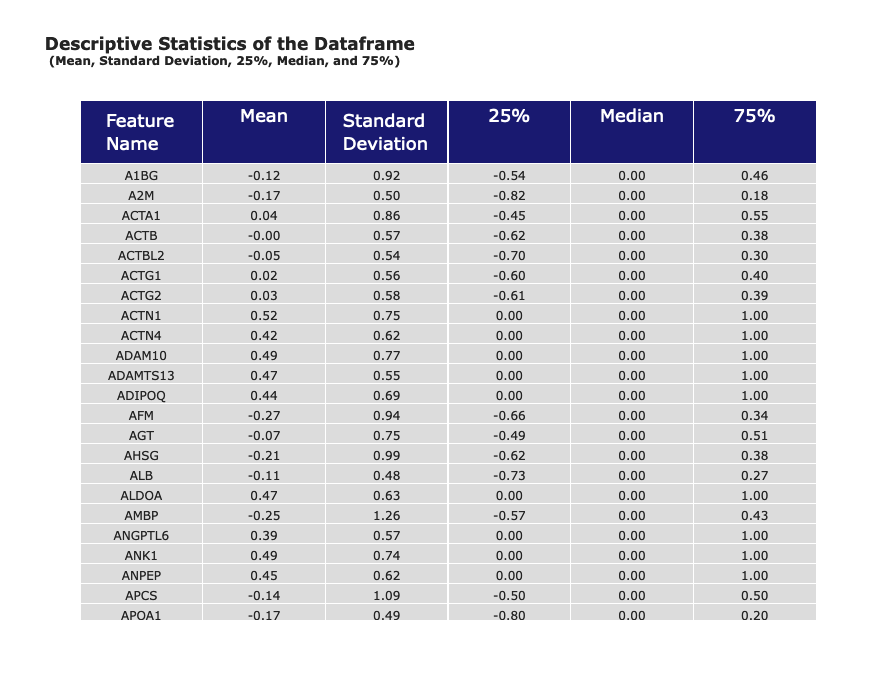

In [623]:
describe(X_transformed)

In [624]:
%matplotlib inline

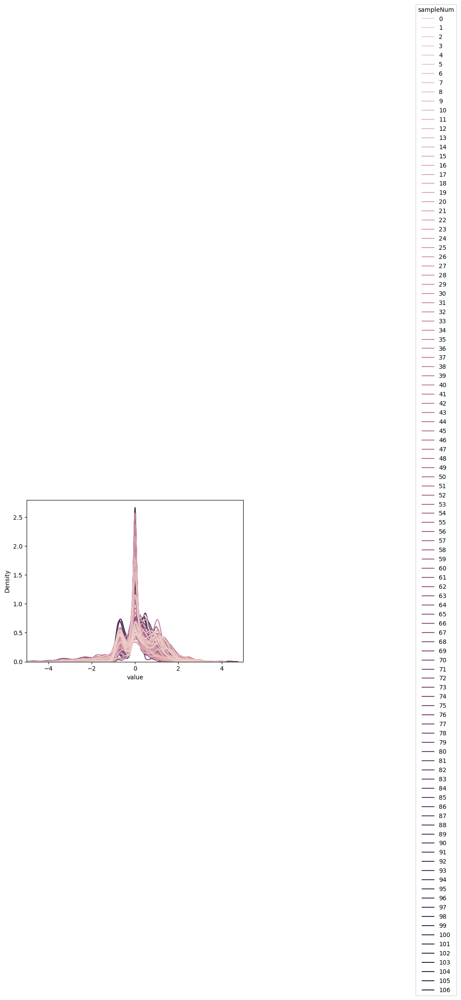

In [625]:
# this is different since its now wide

dfTemp = X_transformed.copy(deep=True)
dfTemp['sampleNum'] = dfTemp.index
dfTemp = dfTemp.melt(id_vars = ['sampleNum'])

# can be slow
ax = sns.kdeplot(dfTemp,
    x = 'value', # 'area', 'areaScaled'
    hue = 'sampleNum',
    bw_adjust=.5,
#    log_scale=True,
    common_norm = False,
    )

plt.xlim(-5, 5)
# legend
sns.move_legend(ax, "center right", bbox_to_anchor=(2, 1))

## Standardizing: scale to same variance

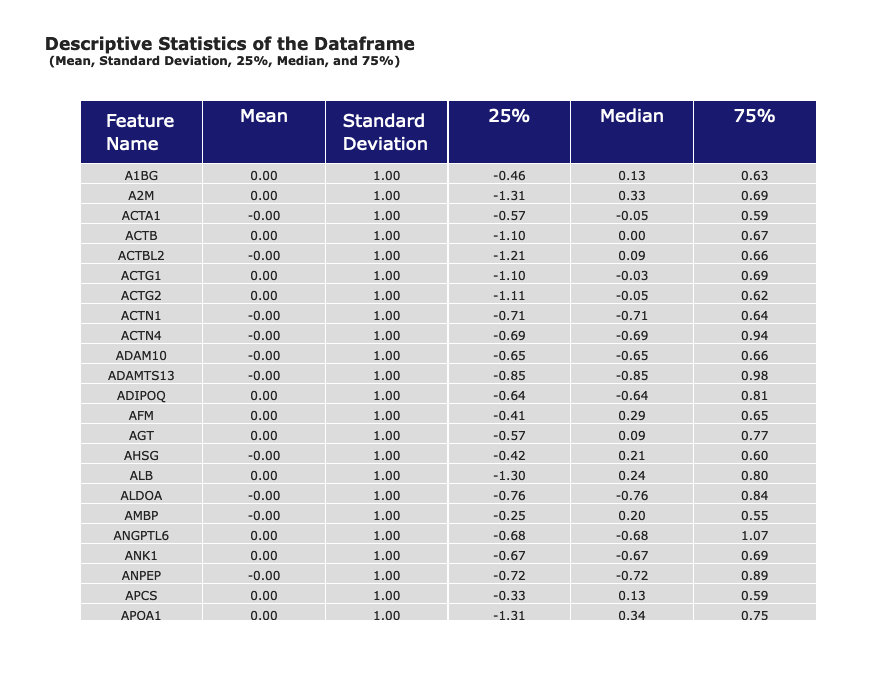

In [626]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_transformed)
X_scaled = pd.DataFrame(X_scaled, columns=X_transformed.columns)
describe(X_scaled)

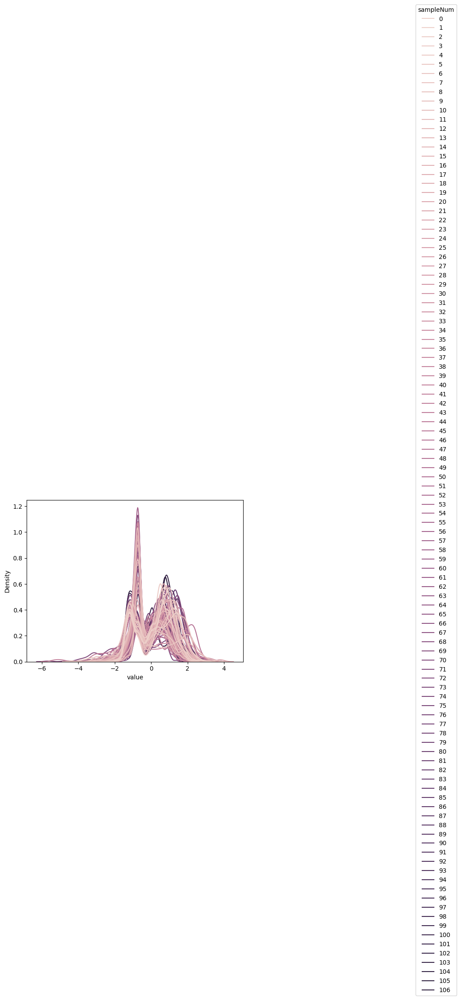

In [627]:
# this is different plot since its now wide

dfTemp = X_scaled.copy(deep=True)
dfTemp['sampleNum'] = dfTemp.index
dfTemp = dfTemp.melt(id_vars = ['sampleNum'])

# can be slow
ax = sns.kdeplot(dfTemp,
    x = 'value', # 'area', 'areaScaled'
    hue = 'sampleNum',
    bw_adjust=.5,
#    log_scale=True,
    common_norm = False,
    )

#plt.xlim(-2,2)
# legend
sns.move_legend(ax, "center right", bbox_to_anchor=(2, 1))

In [628]:
### final check, any NAN in X?

X_scaled.isna().sum()#.sum()
#y.isna().sum()

geneNamePrimary
A1BG      0
A2M       0
ACTA1     0
ACTB      0
ACTBL2    0
         ..
YWHAE     0
YWHAG     0
YWHAH     0
YWHAQ     0
YWHAZ     0
Length: 373, dtype: int64

# Feature Selection

<p style="font-size: 14px">Feature selection operates on the idea of employing different algorithms and tools to identify the most relevant variables for predicting a certain target.
<br><br>
I will be utilizing <code>RFECV</code>, with a simple <code>RandomForestClassifier</code> as the estimator, to select the features in $X$ that are considered most significant for predicting the values in $y$.
<br><br>
Let's start by defining a <code>cv</code> KFold strategy below.</p>

### to be 100% clear, at this stage X is all of dfTrain, no dfTest whatsoever

In [629]:
# RFECV step (slow!) so making it raw for now even tho its fine
# uses X_scaled

def customRFECV (X_input):

    global selected_features
    global rfe
    global min_features_to_select
    
    estimator = RandomForestClassifier(random_state=seed) # used for sensitivity
    
    #estimator = DecisionTreeClassifier(
    #    #splitter = 'random', # 'best', 'random',
    #    #min_samples_split = 2, # default is 2
    #    random_state=seed)

    #estimator = ExtraTreeClassifier(random_state=seed)
    #estimator = LinearSVC(random_state=seed)
    #estimator = AdaBoostClassifier(random_state=seed)
    #estimator = GradientBoostingClassifier(random_state=seed)
    
    minFeaturesToSelect = 100 # 1 for sensitivity
    
    rfe = RFECV(
        estimator=estimator, 
        # tune cv to get 60-150 targets. 
        # dfHarmonized nSamples = 60:  seed 1 = 4cv (32 features), seed 2 = 3cv (66 features)
        # dfHarmonized nSamples = 120: seed 1 = 5cv (37 features), 2 = 5cv (80 features), 3 = 5cv (36 features)
        cv=3, # cv for sensitivity? 3 for sarcoma_cancer is too many for seed 1. 4 is 40 features, 128 seed 2. 42 seed 3, 310 seed 4. 437 seed 5.
        scoring= make_scorer(quadratic_weighted_kappa), # cancer, sensitivity
        #scoring= make_scorer(quadratic_weighted_kappa), # 'accuracy', make_scorer(quadratic_weighted_kappa), 'f1_weighted', 'f1', make_scorer(matthews_corrcoef), make_scorer(cohen_kappa_score)
        #min_features_to_select = minFeaturesToSelect,
        n_jobs = nJobs,
        step = 1,
    )
    
    rfe.fit(X_scaled, y)
    
    selected_features = []
    
    for i, feature in enumerate(X_input.columns):
        if rfe.support_[i]:
            selected_features.append(feature)
    
    print(f'{len(selected_features)} features selected out of {len(X_scaled.columns)}.')
    print('the optimal # of features is often in the ballpark of the sq root of the total number of features')
    print(f'\nSelected Features: \n')
    for feature in selected_features:
        print(feature)

In [630]:
# RFE option to define # of features
# uses X_scaled

def customRFE (X_input):

    global selected_features
    global rfe
    global min_features_to_select
    global n_features_to_select
    
    estimator = RandomForestClassifier(random_state=seed)
    
    #estimator = DecisionTreeClassifier(
    #    splitter = 'random', # 'best', 'random',
    #    random_state=seed) 

    n_features_to_select = 100 #  If float between 0 and 1, it is the fraction of features to select.
    
    rfe = RFE(
        estimator=estimator,
        n_features_to_select = n_features_to_select,
        #verbose = 1,
    )
    
    rfe.fit(X_scaled, y)
    
    selected_features = []
    
    for i, feature in enumerate(X_input.columns):
        if rfe.support_[i]:
            selected_features.append(feature)
    
    print(f'{len(selected_features)} features selected out of {len(X_scaled.columns)}.')
    print('the optimal # of features is often in the ballpark of the sq root of the total number of features')
    print(f'\nSelected Features: \n')
    for feature in selected_features:
        print(feature)

In [631]:
# RFE option to define # of features
# uses X_scaled
from sklearn.feature_selection import f_classif

def customKBest (X_input):

    global selected_features
    global rfe
    global kBest
    global min_features_to_select
    global n_features_to_select
    
    kBest = SelectKBest(
        score_func = f_classif, # f_classif
    #    k = 25, # default is 10
    )
    
    kBest.fit(X_scaled, y)
    
    selected_features = []
    
    for i, feature in enumerate(X_input.columns):
        if kBest.feature_names_in_[i]:
            selected_features.append(feature)
    
    print(f'{len(selected_features)} features selected out of {len(X_scaled.columns)}.')
    print('the optimal # of features is often in the ballpark of the sq root of the total number of features')
    print(f'\nSelected Features: \n')
    for feature in selected_features:
        print(feature)

In [632]:
# used for RFECV

def quadratic_weighted_kappa(y_true, y_pred):
    '''
    This function returns an evaluation metric
    '''
    return cohen_kappa_score(y_true, y_pred, weights='quadratic')

In [633]:
#########################
#                       #
#     Choose!           #
#                       #
#########################

customRFECV(X_scaled) # used for sensitivity and cancer
#customRFE(X_scaled) # testing for cancer since REFCV div / 0 a lot
#customKBest(X_scaled)

61 features selected out of 373.
the optimal # of features is often in the ballpark of the sq root of the total number of features

Selected Features: 

ACTA1
ALB
APOA2
APOA4
ATRN
C1QA
C1QB
C1QC
C1R
C1RL
C4BPB
C9
CD5L
CFHR2
CLEC3B
COLEC11
ECM1
FCGBP
FGB
FGG
FTH1
FTL
GPLD1
GSN
IGHG4
IGHV3-20
IGHV3-35
IGHV3-49
IGHV3-64D
IGHV3-73
IGHV3OR16-12
IGHV3OR16-13
IGHV5-51
IGHV6-1
IGKV1-6
IGKV2-29
IGKV3-11
IGKV4-1
IGLV2-18
IGLV2-8
IGLV4-69
JCHAIN
KNG1
KRT77
LGALS3BP
LRG1
MASP2
P4HB
PRSS1
RAB1B
SAA2
SERPINA10
SERPINC1
SERPIND1
SLC2A1
TF
TFRC
THBS1
THBS2
TLN2
VWF


In [634]:
#selected_featuresBackup = [i for i in selected_features]

# save to disk
fileName = 'selectedFeaturesRFECV_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

import json
with open(fileName + '.json', 'w') as f:
    # indent=2 is not needed but makes the file human-readable 
    # if the data is nested
    json.dump(selected_features, f, indent=2) 

In [635]:
# to open

fileName = 'selectedFeaturesRFECV_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

with open(fileName + '.json', 'r') as f:
    selected_features = json.load(f)

In [636]:
# Identifying the features RFE selected

dfRFE = pd.DataFrame()

dfRFE = pd.DataFrame(columns = ['feature', 'support', 'ranking'])

for i in range(X.shape[1]):
    row = {'feature': i, 'support': rfe.support_[i], 'ranking': rfe.ranking_[i]}
    dfRFE = dfRFE._append(row, ignore_index=True)
    
dfRFE.sort_values(by='ranking').head(10)


,feature,support,ranking
365,365,True,1
204,204,True,1
196,196,True,1
195,195,True,1
190,190,True,1
37,37,True,1
189,189,True,1
187,187,True,1
184,184,True,1
41,41,True,1


#### include only the selected features in X (e.g. dfTrain only up here) in X_scaled

<h1 id = 'cluster' style="border-bottom: 1px solid #ccc;
                        padding-bottom: 10px;
                        margin-bottom: 10px;
                        font-size: 38px;
                        font-weight: bold;
                        color: black;
                        font-family: Poppins">Clustering</h1>

### To identify the optimal number of clusters, I'll use the Elbow Curve method. This technique can help us to identify the right count of clusters where the rate of decrease in within-cluster sum of squares (WCSS) starts to diminish

In [95]:
def elbow_curve(wss):    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x = list(range(1,10)),
                            y = wss,
                            mode = 'lines+markers',
                            marker = dict(color = 'midnightblue'),
                            name = 'WSS'))

    
    fig.update_layout(title = {'text': '<b>Elbow Curve Plot <br> <sup>Within-Cluster Sum of Squares</sup></b>'},
                     height = 400, width = 950,
                     xaxis_title = 'Number of Clusters',
                     yaxis_title = 'Within-Cluster Sum of Squares (WSS)',
                     margin = dict(t=80),
                     template = plotly_template)

    fig.show()

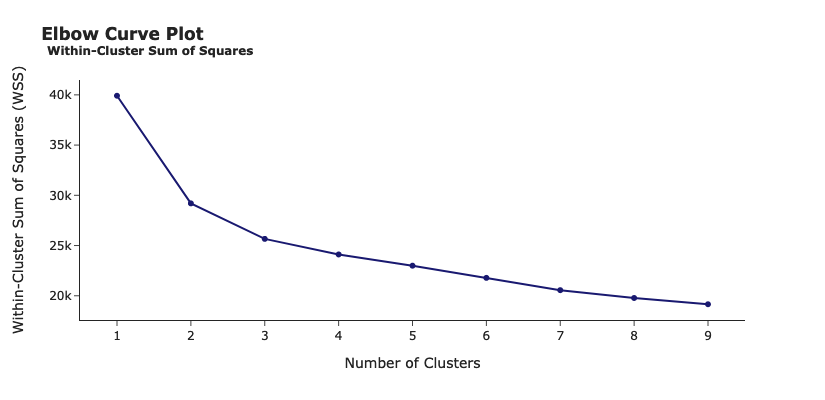

In [96]:
wss_values = []
for k in range(1,10):
    kmeans = KMeans(n_clusters = k, random_state = seed)
    kmeans.fit(X_scaled) 
    wss_values.append(kmeans.inertia_) 
elbow_curve(wss_values)

#### old text: It seems like the optimal number of clusters may be around K = N.
#### I am going to cluster our data twice, segregating it into three clusters at first and four clusters afterwards. We can then see a clustered scatterplot to see what kind of behavior we may identify in the data

In [97]:
def clustered_scatterplot(df, y, x, cluster):
    '''
    This function takes a dataframe, x, and y axes to plot a scatterplot colored accordingly to clusters
    It also prints a count of values for each cluster
    '''
    fig = px.scatter(df,
                     y = y,
                     x = x,
                     color = cluster, symbol = cluster)

    fig.update_traces(marker = dict(size = 10))

    fig.update(layout_coloraxis_showscale=False)

    fig.update_layout(title = {'text': f'<b>Clustered Scatterplot <br> <sup> {y} x {x} </sup></b>',
                              'xanchor': 'left',
                              'x': 0.05},
                     height = 600, width = 700,
                     margin = dict(t=100),
                     template = plotly_template,
                     showlegend = True)

    fig.show()

    print('Cluster Count:')
    print(f'{df[cluster].value_counts()}')

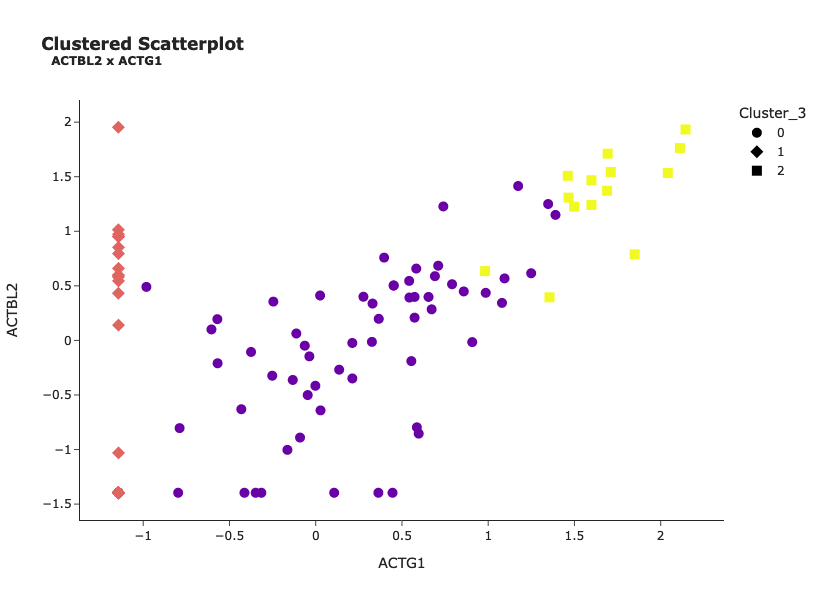

Cluster Count:
Cluster_3
0    63
1    30
2    14
Name: count, dtype: int64


In [98]:
import plotly.express as px

kmeans = KMeans(n_clusters = 3, random_state = seed)
kmeans.fit(X_scaled)
X_scaled['Cluster_3'] = kmeans.labels_
clustered_scatterplot(X_scaled,selected_features[0], selected_features[1], 'Cluster_3')

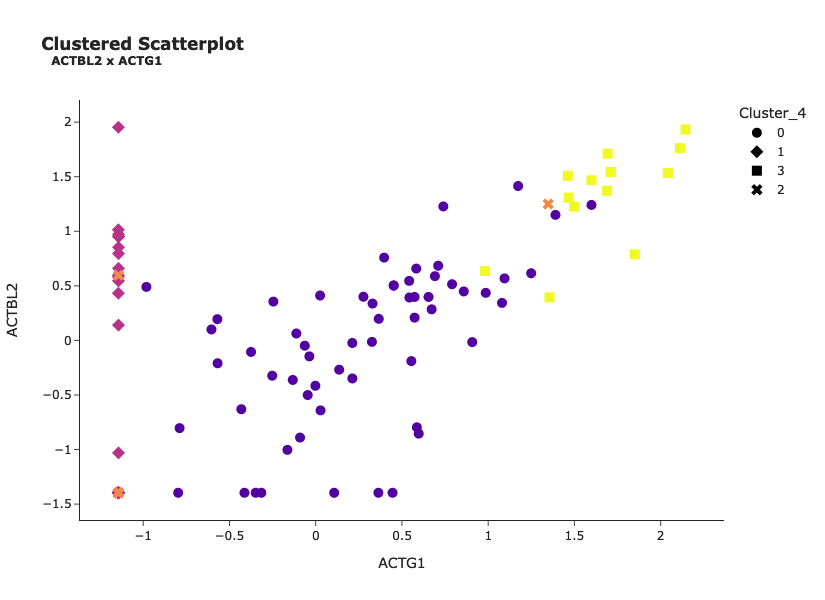

Cluster Count:
Cluster_4
0    63
1    23
3    13
2     8
Name: count, dtype: int64


In [99]:
kmeans = KMeans(n_clusters = 4, random_state = seed)
kmeans.fit(X_scaled)
X_scaled['Cluster_4'] = kmeans.labels_
clustered_scatterplot(X_scaled,selected_features[0], selected_features[1], 'Cluster_4')

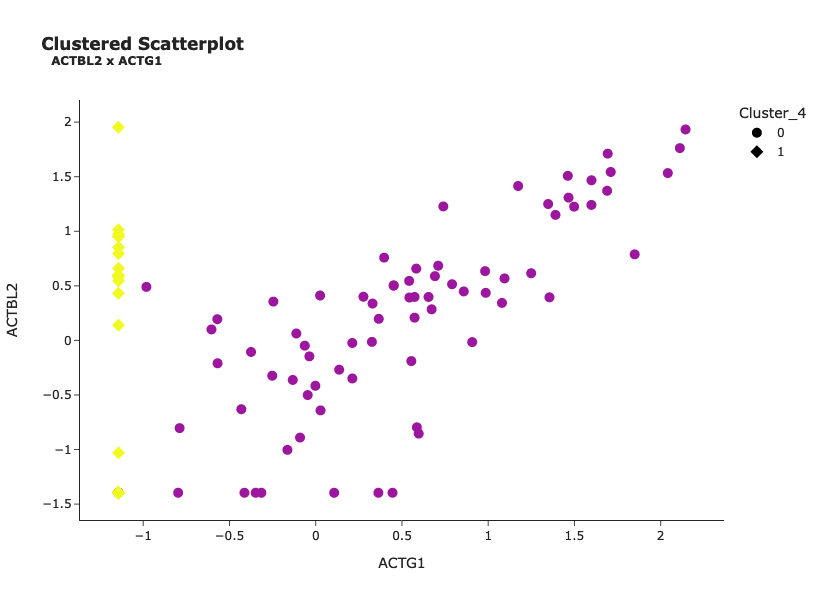

Cluster Count:
Cluster_4
0    77
1    30
Name: count, dtype: int64


In [100]:
# for fun, lets compare this to 2 clusters

kmeans = KMeans(n_clusters = 2, random_state = seed)
kmeans.fit(X_scaled)
X_scaled['Cluster_4'] = kmeans.labels_
clustered_scatterplot(X_scaled,selected_features[0], selected_features[1], 'Cluster_4')

# Beginning of each actual classification loops

## make pipeline

In [889]:
# test to see if there are any negative values in the dataframe. 
# This is important to pick the most adequate method for transforming the distribution,
# as some methods don't work with negative values.has_negatives = np.any(X <= 0)

has_negatives = np.any(X < 0)

if has_negatives:
    print("There are negative values in the data.")
else:
    print("There are no negative values in the data.")

There are negative values in the data.


In [890]:
# make pipline

pipeline = Pipeline(steps=[
    ('Transforming Distribution',  RobustScaler(with_centering = True, with_scaling = True, quantile_range=(25, 75), unit_variance = False)),
    ('Standard Scaler', StandardScaler()),
#    ('RFE', RFECV(estimator=RandomForestClassifier(random_state=seed), cv=cv, scoring=make_scorer(quadratic_weighted_kappa), n_jobs = nJobs)),
    ('Model', None),
]#, verbose=True,
)

In [891]:
pipeline # Visualizing the pipeline

Pipeline(steps=[('Transforming Distribution',
                 RobustScaler(quantile_range=(25, 75))),
                ('Standard Scaler', StandardScaler()), ('Model', None)])

<h1 id = 'eda2' style="border-bottom: 1px solid #ccc;
                        padding-bottom: 10px;
                        margin-bottom: 10px;
                        font-size: 26px;
                        font-weight: bold;
                        color: black;
                        font-family: Poppins">Selecting Models</h1>

<p style="font-size: 20px">You can notice that the last step of the pipeline is currently <code>None</code>, indicating the emptyness in the <code>Model</code> parameter. 
<br><br>
We are going to perform <code>cross validation</code> with different models to see which one's the best. First, let's split our original dataframe into $X$ and $y$, similarly to what we did before with the copy dataframe.</p>

## Impt Note: I am starting fresh from dfTrain here, so it'll match dfTest exactly.

In [892]:
# simple org, but getting that string error

df = dfTrain.copy(deep = True)

categorical_features,continuous_features, binary_features = columns_catNumOrBin(df)

In [893]:
# Use when RFE
import copy

df = dfTrain.copy(deep = True)

# filtered from RFE

fileName = 'selectedFeaturesRFECV_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

with open(fileName + '.json', 'r') as f:
    selected_featuresFromDisk = json.load(f)

colsToFilter = []
colsToFilter = copy.deepcopy(selected_featuresFromDisk)
colsToFilter.append(target)
#print(colsToFilter) # QC
df = df[colsToFilter] # selected features from RFE

X, y = X_y_split(df, target)
#X.columns = X.columns.astype(str) # to make adaboost happy

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = pd.Series(le.fit_transform(y))

categorical_features,continuous_features, binary_features = columns_catNumOrBin(df)


X shape: (107, 239)


107 Samples 


239 Attributes 



,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,AMBP,ANGPTL6,ANK1,APCS,APOA1,APOA4,APOB,APOC1,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C2,C3,C4A,C4B,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAVIN2,CD14,CD5L,CETP,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFI,CFL1,CFP,CLEC3B,CLIC1,CLU,COLEC10,COLEC11,CP,CPN1,CPN2,DCD,ECM1,EHD1,EIF5A,EPB42,EZR,F11,F13A1,F13B,F2,F8,FBLN1,FCGBP,FCN2,FCN3,FERMT3,FGA,FGB,FGG,FN1,FTH1,FTL,GNAI2,GNAI3,GNB4,GSN,H4C1; H4C2; H4C3; H4C4; H4C5; H4C6; H4C8; H4C9; H4C11; H4C12; H4C13; H4C14; H4C15; H4C16,HBB,HLA-A,HLA-B,...,IGKV1-27,IGKV1-5,IGKV1-6,IGKV1-8,IGKV2-24,IGKV2-29,IGKV2D-30,IGKV3-11,IGKV3-7,IGKV3D-15,IGKV3D-20,IGKV3OR2-268,IGKV4-1,IGLC3,IGLL5,IGLV1-51,IGLV2-18,IGLV2-23,IGLV2-8,IGLV3-1,IGLV3-10,IGLV3-16,IGLV3-9,IGLV4-69,IGLV7-46,IGLV8-61,ITGA2B,ITGB3,ITIH1,ITIH2,JCHAIN,KLKB1,KNG1,KRT6C,KRT76,KRT77,LBP,LGALS3BP,LRG1,LTBP1,MASP1,MASP2,MBL2,MMRN1,MSN,OIT3,ORM2,P4HB,PARVB,PF4,PF4V1,PGK1,PGLYRP2,PIGR,PKM,PLG,PON1,POTEF,POTEI,PRDX2,PRDX6,PRG4,PROS1,PSMA1,RAB1A,RAB1B,RAC2,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTB,SVEP1,TFRC,THBS1,TLN2,TPM3,TUBA8,UGT8,VCL,VIM,VWF
0,-0.423379,-0.024570,0.026106,NaN,NaN,NaN,NaN,-0.395340,0.244759,0.418586,1.189437,2.128079,0.705446,NaN,-0.151254,0.781108,1.647967,1.518544,1.367172,1.268761,1.954510,0.776775,1.159319,1.651222,-0.183539,1.055485,0.340198,NaN,-1.266304,-0.331574,-0.067143,-1.805522,0.760298,1.156325,1.216054,0.523083,0.163156,-0.906817,1.442320,1.067475,0.287518,1.095179,0.493775,-0.564649,-0.466071,-0.073373,-0.439971,-0.437799,0.410093,NaN,NaN,-1.067152,0.829410,0.295900,0.910999,0.146613,-0.160391,0.021132,NaN,-0.365071,NaN,-0.659755,NaN,NaN,1.375369,NaN,NaN,0.942002,NaN,-0.118528,NaN,-0.349957,NaN,NaN,-0.183390,-1.211751,-0.819878,0.351726,0.189522,1.165920,-1.016236,NaN,-0.587752,-0.380614,1.574519,NaN,2.135703,2.144575,2.207828,1.210347,0.237459,1.016293,NaN,NaN,-0.432750,-0.637378,-0.838049,1.995241,NaN,NaN,...,NaN,0.382564,NaN,NaN,-0.539326,-0.430009,-0.464552,NaN,NaN,-0.832486,NaN,NaN,0.896673,1.653103,1.393722,-0.000910,NaN,NaN,0.937280,-0.255059,NaN,0.680646,-0.264457,NaN,NaN,-0.236250,NaN,NaN,0.858298,0.879412,0.768549,0.025134,1.068488,NaN,NaN,NaN,1.136692,0.329421,-0.707764,NaN,-0.405310,NaN,-1.469939,NaN,-0.573676,0.892740,0.992785,NaN,NaN,NaN,NaN,NaN,NaN,0.570860,NaN,1.186000,1.222128,-0.210123,-0.266771,0.522703,NaN,-0.449667,0.813657,NaN,-0.065737,-0.025041,NaN,-0.158670,0.277404,-1.053253,NaN,-0.930025,-0.234277,0.042182,0.311362,1.319249,-0.521016,0.650565,-2.233291,-0.966419,NaN,0.601205,0.423292,-1.334570,0.694314,NaN,0.718612,1.118896,0.204497,-0.402105,-0.349093,1.513985,NaN,NaN,NaN,NaN,1.736182,NaN,NaN,1.481474
1,0.628846,0.946476,0.874163,NaN,NaN,NaN,NaN,NaN,0.372256,0.003020,0.685772,2.513429,0.332382,NaN,NaN,-0.349262,1.607751,0.439434,0.175226,-0.342230,1.372067,NaN,0.678727,1.182397,0.497255,0.544879,0.615175,NaN,-0.577634,0.681667,-0.029312,-0.543242,-0.150366,0.301446,0.002728,-1.252469,NaN,-0.736628,1.319785,1.232875,0.250177,0.437407,-0.074702,-0.861149,-1.110222,NaN,NaN,-0.725036,-0.002356,-0.034981,NaN,NaN,1.635264,NaN,0.606937,-0.690165,NaN,-0.930782,NaN,-0.940686,0.110114,NaN,NaN,-1.460775,1.017305,NaN,NaN,1.250899,NaN,-1.841737,1.500215,NaN,0.282864,NaN,NaN,-1.288457,-2.413018,-0.579196,NaN,0.630306,NaN,NaN,0.321121,0.028344,1.341799,0.011059,1.239865,1.469264,1.454172,NaN,NaN,-1.155189,-0.697516,-0.856467,-0.185423,-1.059937,NaN,1.196041,NaN,-0.417369,...,NaN,-0.255655,NaN,NaN,NaN,-0.023595,0.232716,0.472542,-2.485493,NaN,0.000280,-2.098677,0.684590,2.048097,2.100674,0.408224,0.012415,0.187570,0.524133,0.007784,0.029769,NaN,-0.624281,NaN,0.870643,NaN,0.121924,0.386349,0.270353,0.147365,1.549012,-0.702123,0.597436,0.829643,0.738318,1.199085,NaN,0.539242,-0.382187,NaN,-1.170204,NaN,0.375224,NaN,0.012240,NaN,1.123456,-1.568304,-1.142382,NaN,NaN,-1.




y shape: (107,)


107 Samples 



0    c
1    c
2    c
3    c
4    c
Name: dfHarmonizedCancer, dtype: object

In [894]:
X.isna().sum()#.sum()

ACTBL2    24
ACTG1     33
ACTG2     33
ACTN1     62
ACTN4     74
          ..
TUBA8     61
UGT8      35
VCL       58
VIM       68
VWF        3
Length: 239, dtype: int64

In [895]:
y

0      0
1      0
2      0
3      0
4      0
      ..
102    1
103    1
104    1
105    1
106    1
Length: 107, dtype: int64

In [896]:
imputeWideDFMinOr0(X)

X.isna().sum().sum()
#X.isna().sum()

quantType is areaHarmonized


0

In [897]:
#y_range = y.max() - y.min()  
#y_median = y.median()  
#y_mean = y.mean() 
#y_std = y.std()

#print(f"Range of y: {y_range}")
#print(f"Median of y: {y_median}")
#print(f"Mean of y: {y_mean:.2f}")
#print(f"Standard deviation of y: {y_std:.2f}")

<p style="font-size: 20px">Below, I'll create a <code>classifiers</code> list, containing different algorithms that are going to be tested during cross validation.
<br><br>
The evaluation metric of this competition is the <code>Quadratic Weighted Kappa</code> score, which is a metric that evaluates the agreement between two raters, in this case, the predicted and actual values. It's particularly useful for datasets with ordinal categories, and takes both under-prediction and over-prediction into account.
<br><br>
The formula for Quadratic Weighted Kappa is given as:
<br><br></p>
<p style="font-size: 24px">
\[
\kappa = 1 - \frac{\sum_{i,j}w_{ij}O_{ij}}{\sum_{i,j}w_{ij}E_{ij}}
\]
<br><br></p>
<p style="font-size: 20px">where: <br><br>
. \(O_{ij}\) is the actual confusion matrix. <br><br>
. \(E_{ij}\) is the expected confusion matrix under randomness. <br><br>
. \(w_{ij}\) is the weighted matrix, which can be calculated as \((i-j)^2\), where \(i\) and \(j\) are the ratings.
<br><br><br>
A score of 1 implies <b>perfect agreement</b> between the raters, while a score of 0 indicates that the agreement is no better than what would be expected by random chance. Negative values suggest that the agreement is even worse than random.</p>

In [898]:
# List of classification algorithms

classifiers = [
    ('HistGradientBoostingClassifier', HistGradientBoostingClassifier(random_state = seed)),
    ('CatBoostClassifier', CatBoostClassifier(random_state = seed, verbose = False)),
    ('LGBMClassifier', LGBMClassifier(random_state = seed, verbosity = -1)),
    ('XGBClassifier', XGBClassifier(random_state = seed)),
    ('AdaBoostClassifier', AdaBoostClassifier(random_state = seed)),
    ('RandomForestClassifier', RandomForestClassifier(random_state = seed)), # new, by me
    ('BaggingClassifier', BaggingClassifier(random_state = seed)), # new, by me
    ('ExtraTreesClassifier', ExtraTreesClassifier(random_state = seed)), # new, by me
    ('GradientBoostingClassifier', GradientBoostingClassifier(random_state = seed)), # new, by me
    ('SVC', SVC(random_state = seed)), # new, by me, a SVM
    ('MLPClassifier', MLPClassifier(random_state = seed)), # new, by me, a SVM
    ('KNeighborsClassifier', KNeighborsClassifier(n_neighbors=3)),
    ('GaussianProcessClassifier', GaussianProcessClassifier(random_state = seed)),
    ('DecisionTreeClassifier', DecisionTreeClassifier(random_state = seed)),
    ('GaussianNB', GaussianNB()),
    ('QuadraticDiscriminantAnalysis', QuadraticDiscriminantAnalysis()),
    ('LinearSVC', LinearSVC(random_state=seed)),
    ('RidgeClassifier', RidgeClassifier(random_state = seed)),
    ('SGDClassifier', SGDClassifier(random_state = seed)),
    ('XGBClassifier', XGBClassifier(random_state = seed)),
]

<p style="font-size: 20px">We will now perform cross validation on every model in the list below, except <code>XGBoost</code>, and choose the ones with the highest mean Quadratic Weighted Kappa. We will also look for the mean standard deviation across folds. In this case, the lower standard deviation, the more stable the model is, thus more reliable.</p>

In [ ]:
print('\nCross-Validation:')
from sklearn.model_selection import cross_val_score
from sklearn.metrics import balanced_accuracy_score

for j, (name, clf) in enumerate(classifiers):
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresCrossValScore = []
    r2_scores = []
    pipeline.set_params(Model = clf)
    
    print('\n')
    print(f'\n{name} Classifier:\n')
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        #X_train.columns = X_train.columns.astype(str) # to make all col names strings
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)

        # turning off to decrease verbosity
        #print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (normalized) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresCrossValScore.append(crossValScore)
        
        #print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
        
        print(f'\n  Mean Quadratic Weighted Kappa: {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')

<h1 id = 'tuning' style="border-bottom: 1px solid #ccc;
                        padding-bottom: 10px;
                        margin-bottom: 10px;
                        font-size: 28px;
                        font-weight: bold;
                        color: black;
                        font-family: Poppins">Tuning Models</h1>

<p style="font-size: 20px">Aiming at higher performances, I am going to use <code>Optuna</code> to individually tune and find the most optimal parameters for both the Histogram-based Gradient Boosting model and the CatBoost model.</p>

In [111]:
import sys
optuna.logging.get_logger("optuna").addHandler(logging.StreamHandler(sys.stdout))

In [ ]:
# dropped n_trials to (from 100) to speed up testing
# CatBoostClassifier, from https://catboost.ai/docs/concepts/python-reference_catboostclassifier

def objectiveCatBoostClassifier(trial): # this is basically a second optimization with a second, hardcoded estimator
    
    params = { # this is from catboost.ai: https://catboost.ai/en/docs/concepts/python-reference_catboostclassifier
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.1, log=True),
#        'iterations': trial.suggest_int('iterations', 100, 1000, step=50),
        'iterations': 500,
        'depth': trial.suggest_int('depth', 1, 10),
#        'subsample': trial.suggest_float('subsample', 0.05, 1.0), # fussy
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.05, 1.0),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 0.1, 10),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),
        'random_strength': trial.suggest_float('random_strength', 0.1, 10),
        'verbose': False,
  #      'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bernoulli', 'MVS', 'Poisson', 'Bayesian', 'No']),
        'grow_policy': trial.suggest_categorical('grow_policy', ['SymmetricTree', 'Depthwise', 'Lossguide']),
        'leaf_estimation_method': trial.suggest_categorical('leaf_estimation_method', ['Newton', 'Gradient']),
        'eval_metric': 'MCC' #'MCC', 'Accuracy', 'BalancedAccuracy' # https://catboost.ai/en/docs/references/custom-metric__supported-metrics
    }
    
    pipeline.set_params(Model = CatBoostClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = []
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC  #mean_score, mean_scoreMCC   

studyName = 'studyCatBoostClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyCatBoostClassifier = 'sqlite:///' + studyName +'.db'
studyCatBoostClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyCatBoostClassifier, load_if_exists=True)
studyCatBoostClassifier.optimize(objectiveCatBoostClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# CatBoostClassifier

best_paramsCatBoostClassifier = studyCatBoostClassifier.best_params
best_rmse_scoreCatBoostClassifier = studyCatBoostClassifier.best_value

print(f'\nCatBoostClassifier:\n')
print('Number of finished trials:', len(studyCatBoostClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreCatBoostClassifier} \n')
print(f'\n Best Params = {best_paramsCatBoostClassifier} \n')

# save
joblib.dump(studyCatBoostClassifier, 'CatBoostClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = CatBoostClassifier(**best_paramsCatBoostClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'CatBoostClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyCatBoostClassifier)

In [ ]:
# Histogram-based Gradient Boosting Regressor
# dropped n_trials to (from 100) to speed up testing

def objectiveHistGradientBoostingClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        #'loss': trial.suggest_categorical('loss', ['log_loss', 'auto', 'categorical_crossentropy']), # auto is erroring
        'loss': trial.suggest_categorical('loss', ['log_loss']),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.001,0.1),
        'max_iter': trial.suggest_categorical('max_iter', [1000]),
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 10,200),
        'max_depth': trial.suggest_int('max_depth', 2, 30),
        'max_bins': trial.suggest_int('max_bins', 100, 255),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 5,100),
        'l2_regularization': trial.suggest_float('l2_regularization', 1e-10,10.0),
        'class_weight': trial.suggest_categorical('class_weight', ['balanced', None])
    }
    
    pipeline.set_params(Model = HistGradientBoostingClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC # since MCC always 0 for this one  #mean_score, mean_scoreMCC   
         
studyName = 'studyHistGradientBoostingClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyHistGradientBoostingClassifier = 'sqlite:///' + studyName +'.db'
studyHistGradientBoostingClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyHistGradientBoostingClassifier, load_if_exists=True)
studyHistGradientBoostingClassifier.optimize(objectiveHistGradientBoostingClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# Histogram-based Gradient Boosting Regressor
# this is optuna

best_paramsHistGradientBoostingClassifier = studyHistGradientBoostingClassifier.best_params
best_rmse_scoreHistGradientBoostingClassifier = studyHistGradientBoostingClassifier.best_value

print(f'\nHistGradientBoostingClassifier:\n')
print('Number of finished trials:', len(studyHistGradientBoostingClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreHistGradientBoostingClassifier} \n')
print(f'\n Best Params = {best_paramsHistGradientBoostingClassifier} \n')

# save
joblib.dump(studyHistGradientBoostingClassifier, 'HistGradientBoostingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = HistGradientBoostingClassifier(**best_paramsHistGradientBoostingClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'HistGradientBoostingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyHistGradientBoostingClassifier)

In [ ]:
# AdaBoostClassifier optimization
# dropped n_trials to (from 100) to speed up testing

def objectiveAdaBoostClassifier(trial): # this is basically a second optimization with a second, hardcoded estimator
    
    params = { # this is from sklearn
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.0001, 0.5),
    }
    
    pipeline.set_params(Model = AdaBoostClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC            

studyName = 'studyAdaBoostClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyAdaBoostClassifier = 'sqlite:///' + studyName +'.db'
studyAdaBoostClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyAdaBoostClassifier, load_if_exists=True)
studyAdaBoostClassifier.optimize(objectiveAdaBoostClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
best_paramsAdaBoostClassifier = studyAdaBoostClassifier.best_params
best_rmse_scoreAdaBoostClassifier = studyAdaBoostClassifier.best_value

print(f'\nAdaBoostClassifier:\n')
print('Number of finished trials:', len(studyAdaBoostClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreAdaBoostClassifier} \n')
print(f'\n Best Params = {best_paramsAdaBoostClassifier} \n')

# save
joblib.dump(studyAdaBoostClassifier, 'AdaBoostClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = AdaBoostClassifier(**best_paramsAdaBoostClassifier,random_state = seed))
#joblib.dump(clf, 'AdaBoostClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyAdaBoostClassifier)

In [ ]:
# LGBMClassifier optimization
# dropped n_trials to (from 100) to speed up testing

def objectiveLGBMClassifier(trial):
    
    params = { # from: https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html
        'metric': 'rmse',
        'n_estimators': trial.suggest_int('n_estimators', 10, 20000),
        'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt','dart']), # 'dart', 'rf'
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-5, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-5, 10),
        'num_leaves': trial.suggest_int('num_leaves', 1, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.0001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 2, 100),
        #"min_split_gain": trial.suggest_float("min_split_gain", 0, 15),
        'subsample': trial.suggest_float('subsample', 0.2, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 300),
        'min_data_per_groups' : trial.suggest_int('min_data_per_groups', 1, 100),
        #'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 200),
    }
    
    pipeline.set_params(Model = LGBMClassifier(**params, random_state = seed, n_jobs = nJobs, verbosity = -1))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreAccuracy #mean_score, mean_scoreMCC        

studyName = 'studyLGBMClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyLGBMClassifier = 'sqlite:///' + studyName +'.db'
studyLGBMClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyLGBMClassifier, load_if_exists=True)
studyLGBMClassifier.optimize(objectiveLGBMClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
best_paramsLGBMClassifier = studyLGBMClassifier.best_params
best_rmse_scoreLGBMClassifier = studyLGBMClassifier.best_value

print(f'\nLGBMClassifier:\n')
print('Number of finished trials:', len(studyLGBMClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreLGBMClassifier} \n')
print(f'\n Best Params = {best_paramsLGBMClassifier} \n')

# save
joblib.dump(studyLGBMClassifier, 'LGBMClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = LGBMClassifier(**best_paramsLGBMClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'LGBMClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyLGBMClassifier)

In [ ]:
# RandomForestClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveRandomForestClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'n_estimators': trial.suggest_int('n_estimators', 2, 500),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_int('max_depth', 1, 110),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 30, 10000),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
    }
    
    pipeline.set_params(Model = RandomForestClassifier(**params, random_state = seed, n_jobs = nJobs))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   
         
studyName = 'studyRandomForestClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyRandomForestClassifier = 'sqlite:///' + studyName +'.db'
studyRandomForestClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyRandomForestClassifier, load_if_exists=True)
studyRandomForestClassifier.optimize(objectiveRandomForestClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# RandomForestClassifier
# this is optuna

best_paramsRandomForestClassifier = studyRandomForestClassifier.best_params
best_rmse_scoreRandomForestClassifier = studyRandomForestClassifier.best_value

print(f'\nRandomForestClassifier:\n')
print('Number of finished trials:', len(studyRandomForestClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreRandomForestClassifier} \n')
print(f'\n Best Params = {best_paramsRandomForestClassifier} \n')

# save
joblib.dump(studyRandomForestClassifier, 'RandomForestClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = RandomForestClassifier(**best_paramsRandomForestClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'RandomForestClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyRandomForestClassifier)

In [ ]:
# BaggingClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveBaggingClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'n_estimators': trial.suggest_int('n_estimators', 2, 200),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
    }
    
    pipeline.set_params(Model = BaggingClassifier(**params, random_state = seed, n_jobs = nJobs))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyBaggingClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyBaggingClassifier = 'sqlite:///' + studyName +'.db'
studyBaggingClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyBaggingClassifier, load_if_exists=True)
studyBaggingClassifier.optimize(objectiveBaggingClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# BaggingClassifier
# this is optuna

best_paramsBaggingClassifier = studyBaggingClassifier.best_params
best_rmse_scoreBaggingClassifier = studyBaggingClassifier.best_value

print(f'\nBaggingClassifier:\n')
print('Number of finished trials:', len(studyBaggingClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreBaggingClassifier} \n')
print(f'\n Best Params = {best_paramsBaggingClassifier} \n')

# save
joblib.dump(studyBaggingClassifier, 'BaggingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = BaggingClassifier(**best_paramsBaggingClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'BaggingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyBaggingClassifier)

In [ ]:
# ExtraTreesClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveExtraTreesClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'n_estimators': trial.suggest_int('n_estimators', 2, 400),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_int('max_depth', 1, 9),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 10, 10000),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'min_impurity_decrease': trial.suggest_float('min_impurity_decrease',0.0, 0.01),
        'min_weight_fraction_leaf': trial.suggest_uniform('min_weight_fraction_leaf', 0.00001,0.4),
    }
    
    pipeline.set_params(Model = ExtraTreesClassifier(**params, random_state = seed, n_jobs = nJobs))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyExtraTreesClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyExtraTreesClassifier = 'sqlite:///' + studyName +'.db'
studyExtraTreesClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyExtraTreesClassifier, load_if_exists=True)
studyExtraTreesClassifier.optimize(objectiveExtraTreesClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# ExtraTreesClassifier
# this is optuna

best_paramsExtraTreesClassifier = studyExtraTreesClassifier.best_params
best_rmse_scoreExtraTreesClassifier = studyExtraTreesClassifier.best_value

print(f'\nExtraTreesClassifier:\n')
print('Number of finished trials:', len(studyExtraTreesClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreExtraTreesClassifier} \n')
print(f'\n Best Params = {best_paramsExtraTreesClassifier} \n')

# save
joblib.dump(studyExtraTreesClassifier, 'ExtraTreesClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = ExtraTreesClassifier(**best_paramsExtraTreesClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'ExtraTreesClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyExtraTreesClassifier)

In [ ]:
# GradientBoostingClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveGradientBoostingClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'loss': trial.suggest_categorical('loss', ['log_loss', 'exponential']),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.0001, 0.5),
        'n_estimators': trial.suggest_int('n_estimators', 20, 1000),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0), # fussy
        'criterion': trial.suggest_categorical('criterion', ['friedman_mse', 'squared_error']),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'max_depth': trial.suggest_int('max_depth', 3, 9),
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 10, 10000),
#        'validation_fraction': trial.suggest_float('validation_fraction', 0.05, 0.2, step=0.05), # fussy
    }
    
    pipeline.set_params(Model = GradientBoostingClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyGradientBoostingClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyGradientBoostingClassifier = 'sqlite:///' + studyName +'.db'
studyGradientBoostingClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyGradientBoostingClassifier, load_if_exists=True)
studyGradientBoostingClassifier.optimize(objectiveGradientBoostingClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# GradientBoostingClassifier
# this is optuna

best_paramsGradientBoostingClassifier = studyGradientBoostingClassifier.best_params
best_rmse_scoreGradientBoostingClassifier = studyGradientBoostingClassifier.best_value

print(f'\nGradientBoostingClassifier:\n')
print('Number of finished trials:', len(studyGradientBoostingClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreGradientBoostingClassifier} \n')
print(f'\n Best Params = {best_paramsGradientBoostingClassifier} \n')

# save
joblib.dump(studyGradientBoostingClassifier, 'GradientBoostingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = GradientBoostingClassifier(**best_paramsGradientBoostingClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'GradientBoostingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyGradientBoostingClassifier)

In [ ]:
# SVC
# dropped n_trials to (from 100) to speed up testing

def objectiveSVC(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'C': trial.suggest_float('C', 1e-10, 1e10, log=True),
        'kernel': trial.suggest_categorical('kernel', ['rbf', 'linear', 'poly', 'sigmoid']),
        'degree': trial.suggest_int('degree', 1, 5),
        'gamma': trial.suggest_categorical('gamma', ['scale', 'auto']),
        'shrinking': trial.suggest_categorical('shrinking', [True, False]),
        'probability': trial.suggest_categorical('probability', [True, False]),
        'decision_function_shape': trial.suggest_categorical('decision_function_shape', ['ovo', 'ovr']),
        'probability': True
    }
    
    pipeline.set_params(Model = SVC(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studySVC_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudySVC = 'sqlite:///' + studyName +'.db'
studySVC = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudySVC, load_if_exists=True)
studySVC.optimize(objectiveSVC, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# SVC
# this is optuna

best_paramsSVC = studySVC.best_params
best_rmse_scoreSVC = studySVC.best_value

print(f'\nSVC:\n')
print('Number of finished trials:', len(studySVC.trials))
print(f'\n Best RMSE score = {best_rmse_scoreSVC} \n')
print(f'\n Best Params = {best_paramsSVC} \n')

# save
joblib.dump(studySVC, 'SVCTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = SVC(**best_paramsSVC,random_state = seed, verbose = False))
#joblib.dump(clf, 'SVCTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studySVC)

In [ ]:
# MLPClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveMLPClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'activation': trial.suggest_categorical('activation', ['identity', 'logistic', 'tanh', 'relu']),
        'solver': trial.suggest_categorical('solver', ['lbfgs', 'sgd', 'adam']),
        'alpha': trial.suggest_float('alpha', 0.00001, 0.01),
        'learning_rate': trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive']),
    }
    
    pipeline.set_params(Model = MLPClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyMLPClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyMLPClassifier = 'sqlite:///' + studyName +'.db'
studyMLPClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyMLPClassifier, load_if_exists=True)
studyMLPClassifier.optimize(objectiveMLPClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# MLPClassifier
# this is optuna

best_paramsMLPClassifier = studyMLPClassifier.best_params
best_rmse_scoreMLPClassifier = studyMLPClassifier.best_value

print(f'\nMLPClassifier:\n')
print('Number of finished trials:', len(studyMLPClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreMLPClassifier} \n')
print(f'\n Best Params = {best_paramsMLPClassifier} \n')

# save
joblib.dump(studyMLPClassifier, 'MLPClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = MLPClassifier(**best_paramsMLPClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'MLPClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyMLPClassifier)

In [112]:
# KNeighborsClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveKNeighborsClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'n_neighbors': trial.suggest_int('n_neighbors', 1,30),
        'weights': trial.suggest_categorical("weights", ['uniform', 'distance']),
        'metric': trial.suggest_categorical("metric", ['euclidean', 'manhattan', 'minkowski']),
        'algorithm': trial.suggest_categorical('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute']),
        'leaf_size': trial.suggest_int('leaf_size', 5,100),
    }
    
    pipeline.set_params(Model = KNeighborsClassifier(**params, n_jobs = nJobs))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyKNeighborsClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyKNeighborsClassifier = 'sqlite:///' + studyName +'.db'
studyKNeighborsClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyKNeighborsClassifier, load_if_exists=True)
studyKNeighborsClassifier.optimize(objectiveKNeighborsClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

[I 2024-04-13 23:34:53,243] A new study created in RDB with name: studyKNeighborsClassifier_dfHarmonizedCancer_nSampleFilter60_trainFrac-0.75_seed-7


A new study created in RDB with name: studyKNeighborsClassifier_dfHarmonizedCancer_nSampleFilter60_trainFrac-0.75_seed-7


  0%|          | 0/100 [00:00<?, ?it/s]

Fold 1:

Fold 2:

Fold 3:

Fold 4:

Fold 5:

Fold 6:

Fold 7:

Fold 8:

Fold 9:

Fold 10:

Fold 11:

Fold 12:

Fold 13:

Fold 14:

Fold 15:

Fold 16:

Fold 17:

Fold 18:

Fold 19:

Fold 20:

Fold 21:

Fold 22:

Fold 23:

Fold 24:

Fold 25:

Fold 26:

Fold 27:

Fold 28:

Fold 29:

Fold 30:

Fold 31:

Fold 32:

Fold 33:

Fold 34:

Fold 35:

Fold 36:

Fold 37:

Fold 38:

Fold 39:

Fold 40:

Fold 41:

Fold 42:

Fold 43:

Fold 44:

Fold 45:

Fold 46:

Fold 47:

Fold 48:

Fold 49:

Fold 50:

* * * * * * * * * * * * * * * * * * * * * * * * * * * *

  Mean Quadratic Weighted Kappa: 0.5855

  Matthews correlation coefficient: 0.6024 ± 0.2634

  F1 weighted score: 0.8196 ± 0.1182

  Accuracy (normalized): 0.7945 ± 0.1351

  ROC: 0.8177

  CrossValScore: 0.6953 ± 0.0336


Trial 0 finished with value: 0.6023580029868633 and parameters: {'n_neighbors': 28, 'weights': 'uniform', 'metric': 'manhattan', 'algorithm': 'kd_tree', 'leaf_size': 64}. Best is trial 0 with value: 0.6023580029868633.
[I 2024-0

In [115]:
# KNeighborsClassifier
# this is optuna

best_paramsKNeighborsClassifier = studyKNeighborsClassifier.best_params
best_rmse_scoreKNeighborsClassifier = studyKNeighborsClassifier.best_value

print(f'\nKNeighborsClassifier:\n')
print('Number of finished trials:', len(studyKNeighborsClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreKNeighborsClassifier} \n')
print(f'\n Best Params = {best_paramsKNeighborsClassifier} \n')

# save
joblib.dump(studyKNeighborsClassifier, 'KNeighborsClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = KNeighborsClassifier(**best_paramsKNeighborsClassifier))
#joblib.dump(clf, 'KNeighborsClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')


KNeighborsClassifier:

Number of finished trials: 100

 Best RMSE score = 0.8603063566814114 


 Best Params = {'n_neighbors': 2, 'weights': 'uniform', 'metric': 'euclidean', 'algorithm': 'ball_tree', 'leaf_size': 45} 



['KNeighborsClassifierTuned_target-dfHarmonizedCancer_nSampleFilter60_trainFrac-0.75_seed-7.pkl']

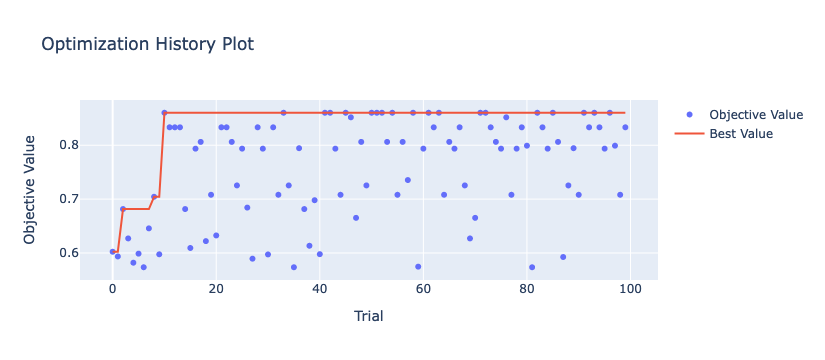

In [116]:
optuna.visualization.plot_optimization_history(studyKNeighborsClassifier)

#### gaussianProcessClassifier has no parameters to optimize

In [ ]:
# DecisionTreeClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveDecisionTreeClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'splitter': trial.suggest_categorical('splitter', ['best', 'random']),
        'max_depth': trial.suggest_int('max_depth', 1, 6),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 1000),
        'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 2, 10000),
        'min_weight_fraction_leaf': trial.suggest_uniform('min_weight_fraction_leaf', 0.0, 0.5), 
        'ccp_alpha': trial.suggest_float('ccp_alpha', 0.00000001, 1.0, log=True),
    }
    
    pipeline.set_params(Model = DecisionTreeClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC    

studyName = 'studyDecisionTreeClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyDecisionTreeClassifier = 'sqlite:///' + studyName +'.db'
studyDecisionTreeClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyDecisionTreeClassifier, load_if_exists=True)
studyDecisionTreeClassifier.optimize(objectiveDecisionTreeClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# DecisionTreeClassifier
# this is optuna

best_paramsDecisionTreeClassifier = studyDecisionTreeClassifier.best_params
best_rmse_scoreDecisionTreeClassifier = studyDecisionTreeClassifier.best_value

print(f'\nDecisionTreeClassifier:\n')
print('Number of finished trials:', len(studyDecisionTreeClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreDecisionTreeClassifier} \n')
print(f'\n Best Params = {best_paramsDecisionTreeClassifier} \n')

# save
joblib.dump(studyDecisionTreeClassifier, 'DecisionTreeClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = DecisionTreeClassifier(**best_paramsDecisionTreeClassifier,random_state = seed))
#joblib.dump(clf, 'DecisionTreeClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyDecisionTreeClassifier)

In [ ]:
# GaussianNB
# dropped n_trials to (from 100) to speed up testing

def objectiveGaussianNB(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'var_smoothing': trial.suggest_float('var_smoothing', 1e-13, 1, log = True),
    }
    
    pipeline.set_params(Model = GaussianNB(**params))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyGaussianNB_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyGaussianNB = 'sqlite:///' + studyName +'.db'
studyGaussianNB = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyGaussianNB, load_if_exists=True)
studyGaussianNB.optimize(objectiveGaussianNB, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# GaussianNB
# this is optuna

best_paramsGaussianNB = studyGaussianNB.best_params
best_rmse_scoreGaussianNB = studyGaussianNB.best_value

print(f'\nGaussianNB:\n')
print('Number of finished trials:', len(studyGaussianNB.trials))
print(f'\n Best RMSE score = {best_rmse_scoreGaussianNB} \n')
print(f'\n Best Params = {best_paramsGaussianNB} \n')

# save
joblib.dump(studyGaussianNB, 'GaussianNBTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = GaussianNB(**best_paramsGaussianNB))
#joblib.dump(clf, 'GaussianNBTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyGaussianNB)

In [ ]:
# QuadraticDiscriminantAnalysis
# dropped n_trials to (from 100) to speed up testing

def objectiveQuadraticDiscriminantAnalysis(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'reg_param': trial.suggest_float('reg_param', 0, 1),
    }
    
    pipeline.set_params(Model = QuadraticDiscriminantAnalysis(**params))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyQuadraticDiscriminantAnalysis_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyQuadraticDiscriminantAnalysis = 'sqlite:///' + studyName +'.db'
studyQuadraticDiscriminantAnalysis = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyQuadraticDiscriminantAnalysis, load_if_exists=True)
studyQuadraticDiscriminantAnalysis.optimize(objectiveQuadraticDiscriminantAnalysis, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# QuadraticDiscriminantAnalysis
# this is optuna

best_paramsQuadraticDiscriminantAnalysis = studyQuadraticDiscriminantAnalysis.best_params
best_rmse_scoreQuadraticDiscriminantAnalysis = studyQuadraticDiscriminantAnalysis.best_value

print(f'\nQuadraticDiscriminantAnalysis:\n')
print('Number of finished trials:', len(studyQuadraticDiscriminantAnalysis.trials))
print(f'\n Best RMSE score = {best_rmse_scoreQuadraticDiscriminantAnalysis} \n')
print(f'\n Best Params = {best_paramsQuadraticDiscriminantAnalysis} \n')

# save
joblib.dump(studyQuadraticDiscriminantAnalysis, 'QuadraticDiscriminantAnalysisTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = QuadraticDiscriminantAnalysis(**best_paramsQuadraticDiscriminantAnalysis))
#joblib.dump(clf, 'QuadraticDiscriminantAnalysisTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyQuadraticDiscriminantAnalysis)

In [ ]:
# LinearSVC
# no predict_proba option
# dropped n_trials to (from 100) to speed up testing

def objectiveLinearSVC(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'penalty': trial.suggest_categorical('penalty', ['l1', 'l2']),
        'loss': trial.suggest_categorical('loss', ['hinge', 'squared_hinge']),
        'dual': trial.suggest_categorical('dual', ['auto', True]),
        'C': trial.suggest_float('C', 1e-10, 1e10, log=True),
#        'multi_class': trial.suggest_categorical('multi_class', ['ovr', 'crammer_singer']),  
        'intercept_scaling': trial.suggest_float('intercept_scaling', 0.1, 2),
#        'probability': True, # doesn't work here
    }
    
    pipeline.set_params(Model = CalibratedClassifierCV(LinearSVC(**params, random_state = seed))) # special CalibratedClassifierCV to get proba
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyLinearSVC_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyLinearSVC = 'sqlite:///' + studyName +'.db'
studyLinearSVC = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyLinearSVC, load_if_exists=True)
studyLinearSVC.optimize(objectiveLinearSVC, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning, ValueError))

In [ ]:
# LinearSVC
# this is optuna

best_paramsLinearSVC = studyLinearSVC.best_params
best_rmse_scoreLinearSVC = studyLinearSVC.best_value

print(f'\nLinearSVC:\n')
print('Number of finished trials:', len(studyLinearSVC.trials))
print(f'\n Best RMSE score = {best_rmse_scoreLinearSVC} \n')
print(f'\n Best Params = {best_paramsLinearSVC} \n')

# save
joblib.dump(studyLinearSVC, 'LinearSVCTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = LinearSVC(**best_paramsLinearSVC,random_state = seed, verbose = False))
#joblib.dump(clf, 'LinearSVCTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyLinearSVC)

In [ ]:
# RidgeClassifier
# can't predict_proba
# dropped n_trials to (from 100) to speed up testing

def objectiveRidgeClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'alpha': trial.suggest_float('alpha', 0, 10),
        'fit_intercept': trial.suggest_categorical('fit_intercept', [True, False]),
        'solver': trial.suggest_categorical('solver', ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']), # 'lbfgs'
    }
    
    pipeline.set_params(Model = RidgeClassifier(**params, random_state = seed))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
#    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        #predictions = pipeline.predict_proba(X_val)[:,1] # new!
        #auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        #scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        #fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        #mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        #print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyRidgeClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyRidgeClassifier = 'sqlite:///' + studyName +'.db'
studyRidgeClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyRidgeClassifier, load_if_exists=True)
studyRidgeClassifier.optimize(objectiveRidgeClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# RidgeClassifier
# this is optuna

best_paramsRidgeClassifier = studyRidgeClassifier.best_params
best_rmse_scoreRidgeClassifier = studyRidgeClassifier.best_value

print(f'\nRidgeClassifier:\n')
print('Number of finished trials:', len(studyRidgeClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreRidgeClassifier} \n')
print(f'\n Best Params = {best_paramsRidgeClassifier} \n')

# save
joblib.dump(studyRidgeClassifier, 'RidgeClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = RidgeClassifier(**best_paramsRidgeClassifier,random_state = seed))
#joblib.dump(clf, 'RidgeClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyRidgeClassifier)

In [ ]:
# SGDClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveSGDClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'loss': trial.suggest_categorical('loss', ['log_loss', 'modified_huber']), #'hinge', 'squared_error', 'perceptron', 'squared_hinge', 'epsilon_insensitive', 'squared_epsilon_insensitive', 'huber'
        'penalty': trial.suggest_categorical('penalty', ['l2', 'l1', 'elasticnet']),
        'alpha': trial.suggest_float('alpha', 0.00001, 0.001, log=True),
        'l1_ratio': trial.suggest_float('l1_ratio', 0.05, 0.95),
        'power_t': trial.suggest_float('power_t', -2, 2),
        'fit_intercept': trial.suggest_categorical('fit_intercept', [True, False]),
    }
    
    pipeline.set_params(Model = SGDClassifier(**params, random_state = seed, n_jobs = nJobs))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studySGDClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudySGDClassifier = 'sqlite:///' + studyName +'.db'
studySGDClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudySGDClassifier, load_if_exists=True)
studySGDClassifier.optimize(objectiveSGDClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# SGDClassifier
# this is optuna

best_paramsSGDClassifier = studySGDClassifier.best_params
best_rmse_scoreSGDClassifier = studySGDClassifier.best_value

print(f'\nSGDClassifier:\n')
print('Number of finished trials:', len(studySGDClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreSGDClassifier} \n')
print(f'\n Best Params = {best_paramsSGDClassifier} \n')

# save
joblib.dump(studySGDClassifier, 'SGDClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = SGDClassifier(**best_paramsSGDClassifier, random_state = seed, verbose = False))
#joblib.dump(clf, 'SGDClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studySGDClassifier)

In [ ]:
# XGBClassifier
# dropped n_trials to (from 100) to speed up testing

def objectiveXGBClassifier(trial): # the model/estimator is hardcoded in this. 'trial' verbage is optuna.
    params = { # these come from SKLearn
        'booster': trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        'max_depth': trial.suggest_int("max_depth", 2, 10),
        'n_estimators': trial.suggest_int("n_estimators", 1, 150),
        'learning_rate': trial.suggest_uniform('learning_rate', 0.0000001, 1),
        'subsample': trial.suggest_uniform('subsample', 0.0001, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
    }

    if params["booster"] in ["gbtree", "dart"]:
        # maximum depth of the tree, signifies complexity of the tree.
        params["max_depth"] = trial.suggest_int("max_depth", 3, 9, step=2)
        # minimum child weight, larger the term more conservative the tree.
        params["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
        params["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
        # defines how selective algorithm is.
        params["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
        params["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])

    if params["booster"] == "dart":
        params["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
        params["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
        params["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
        params["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)
        
    pipeline.set_params(Model = XGBClassifier(**params, random_state = seed, nthread = nJobs))
    scores = []
    scoresMCC = []
    scoresF1Weighted = []
    scoresAccuracy = []
    scoresROC = [] # new!
    scoresCrossValScore = []
    
    for i, (train_index, val_index) in enumerate(cv_splits):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_val)
        
        kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
        mcc = matthews_corrcoef(y_val, y_pred)
        f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
        predictions = pipeline.predict_proba(X_val)[:,1] # new!
        auc = roc_auc_score(y_val, predictions)
        accuracy = balanced_accuracy_score(y_val, y_pred)
        crossValScore = cross_val_score(pipeline, X_train, y_train, cv=3)
        
        print(f'Fold {i + 1}:\n')
        #print(f'  Quadratic Weighted Kappa = {kappa:.4f}\n')
        #print(f'  Matthews correlation coefficient = {mcc:.4f}')
        #print(f'  F1 weighted = {f1Weighted:.4f}')
        #print(f'  accuracy (balanced) = {accuracy:.4f}')
        
        scores.append(kappa)
        scoresMCC.append(mcc)
        scoresF1Weighted.append(f1Weighted)
        scoresAccuracy.append(accuracy)
        scoresROC.append(auc)
        scoresCrossValScore.append(crossValScore)
        fold_std = np.std(scores)
        fold_stdMCC = np.std(scoresMCC)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        fold_stdAccuracy = np.std(scoresAccuracy)
        fold_scoreROC = np.std(scoresROC)
        fold_scoreCrossValScore = np.std(scoresCrossValScore)
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        mean_scoreCrossValScore = np.mean(scoresCrossValScore)
           
        print('* * * * * * * * * * * * * * * * * * * * * * * * * * * *\n')
        print(f'  Mean Quadratic Weighted Kappa: {mean_score:.4f}')
        print(f'\n  Matthews correlation coefficient: {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score: {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized): {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  ROC: {mean_scoreROC:.4f}')
        print(f'\n  CrossValScore: {mean_scoreCrossValScore:.4f} \u00B1 {fold_scoreCrossValScore:.4f}')
        print('\n')
        
    return mean_scoreMCC #mean_score, mean_scoreMCC   

studyName = 'studyXGBClassifier_' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)
storagestudyXGBClassifier = 'sqlite:///' + studyName +'.db'
studyXGBClassifier = optuna.create_study(study_name = studyName, direction='maximize', storage = storagestudyXGBClassifier, load_if_exists=True)
studyXGBClassifier.optimize(objectiveXGBClassifier, n_trials = 100, show_progress_bar = True, catch=(FloatingPointError, RuntimeWarning))

In [ ]:
# XGBClassifier
# this is optuna

best_paramsXGBClassifier = studyXGBClassifier.best_params
best_rmse_scoreXGBClassifier = studyXGBClassifier.best_value

print(f'\nXGBClassifier:\n')
print('Number of finished trials:', len(studyXGBClassifier.trials))
print(f'\n Best RMSE score = {best_rmse_scoreXGBClassifier} \n')
print(f'\n Best Params = {best_paramsXGBClassifier} \n')

# save
joblib.dump(studyXGBClassifier, 'XGBClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#clf = pipeline.set_params(Model = XGBClassifier(**best_paramsXGBClassifier,random_state = seed, verbose = False))
#joblib.dump(clf, 'XGBClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
optuna.visualization.plot_optimization_history(studyXGBClassifier)

# Evaluate individual Classifiers, now tuned properly
* gaussianProcessClassifier has no parameters to optimize

In [899]:
# load up classifiers from disk if need be

tunedClassifierList = glob.glob('*Tuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl') # needs to add in Pytorch or AutoSKLearn
#tunedClassifierList = natsorted(tunedClassifierList)
#print('tunedClassifierList is :' + str(tunedClassifierList))

# load optuna tuned classifiers AS PIPELINES (since that is how I saved them. ** best params adn random seed baked in already)
#CatBoostClassifierTuned = joblib.load('CatBoostClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#HistGradientBoostingClassifierTuned = joblib.load('HistGradientBoostingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#LGBMClassifierTuned = joblib.load('LGBMClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#AdaBoostClassifierTuned = joblib.load('AdaBoostClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#RandomForestClassifierTuned = joblib.load('RandomForestClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#BaggingClassifierTuned = joblib.load('BaggingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')#ExtraTreesClassifierTuned = joblib.load('ExtraTreesClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#ExtraTreesClassifierTuned = joblib.load('ExtraTreesClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')#ExtraTreesClassifierTuned = joblib.load('ExtraTreesClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#GradientBoostingClassifierTuned = joblib.load('GradientBoostingClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#SVCTuned = joblib.load('SVCTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#MLPClassifierTuned = joblib.load('MLPClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
KNeighborsClassifierTuned = joblib.load('KNeighborsClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#GaussianProcessClassifierTuned = GaussianProcessClassifier(random_state = seed) #has nothing to tune
#DecisionTreeClassifierTuned = joblib.load('DecisionTreeClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#GaussianNBTuned = joblib.load('GaussianNBTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#QuadraticDiscriminantAnalysisTuned = joblib.load('QuadraticDiscriminantAnalysisTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#LinearSVCTuned = joblib.load('LinearSVCTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#RidgeClassifierTuned = joblib.load('RidgeClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#SGDClassifierTuned = joblib.load('SGDClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#XGBClassifierTuned = joblib.load('XGBClassifierTuned_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [26]:
tunedClassifierList

['MLPClassifierTuned_target-dfHarmonizedCancer_nSampleFilter60_trainFrac-0.75_seed-1.pkl',
 'KNeighborsClassifierTuned_target-dfHarmonizedCancer_nSampleFilter60_trainFrac-0.75_seed-1.pkl']

In [27]:
len(tunedClassifierList)

2

In [28]:
# lists to summarize results

tunedClassifierList = []
seedList = []
trainFracList = []
mean_scoreKappaTunedClassifierList = []
mean_scoreMCCTunedClassifierList= []
mean_scoreF1WeightedTunedClassifierList = []
mean_scoreAccuracyTunedClassifierList = []
mean_scoreROCTunedClassifierList = []

In [121]:
# this is catboost alone, but with optuna-tuned parameters for the first time.

print('\nTuned CatBoostClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = CatBoostClassifier(**CatBoostClassifierTuned.best_params,random_state = seed, verbose = False))
    #pipeline.set_params(Model = CatBoostClassifier(**best_paramsCatBoostClassifier,random_state = seed, verbose = False))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('CatBoostClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)


Tuned CatBoostClassifier Cross-Validation:




NameError: name 'CatBoostClassifierTuned' is not defined

In [ ]:
# this is HistGradientBoostingClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned HistGradientBoostingClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = HistGradientBoostingClassifier(**HistGradientBoostingClassifierTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = HistGradientBoostingClassifier(**best_paramsHistGradientBoostingClassifier,random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('HistGradientBoostingClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is LGBMClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned LGBMClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = LGBMClassifier(**LGBMClassifierTuned.best_params,random_state = seed, n_jobs=nJobs, verbosity = -1))
    #pipeline.set_params(Model = LGBMClassifier(**best_paramsLGBMClassifier,random_state = seed, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('LGBMClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is AdaBoostClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned AdaBoostClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = AdaBoostClassifier(**AdaBoostClassifierTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = AdaBoostClassifier(**best_paramsAdaBoostClassifier,random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('AdaBoostClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is RandomForestClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned RandomForestClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = RandomForestClassifier(**RandomForestClassifierTuned.best_params,random_state = seed, n_jobs=nJobs))
    #pipeline.set_params(Model = RandomForestClassifier(**best_paramsRandomForestClassifier, random_state = seed, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('RandomForestClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is BaggingClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned BaggingClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = BaggingClassifier(**BaggingClassifierTuned.best_params,random_state = seed, n_jobs=nJobs))
    #pipeline.set_params(Model = BaggingClassifier(**best_paramsBaggingClassifier, random_state = seed, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('BaggingClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is ExtraTreesClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned ExtraTreesClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = ExtraTreesClassifier(**ExtraTreesClassifierTuned.best_params,random_state = seed, n_jobs=nJobs))
    #pipeline.set_params(Model = ExtraTreesClassifier(**best_paramsExtraTreesClassifier, random_state = seed, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('ExtraTreesClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is GradientBoostingClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned GradientBoostingClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = GradientBoostingClassifier(**GradientBoostingClassifierTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = GradientBoostingClassifier(**best_paramsGradientBoostingClassifier, random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('GradientBoostingClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is 'SVC alone, but with optuna-tuned parameters for the first time.
# doesn't do ROC

print('\nTuned SVC Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = SVC(**SVCTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = SVC(**best_paramsSVC, random_state = seed, probability=True))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
#    predictions = pipeline.predict_proba(X_val)[:,1]
#    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
#        mean_scoreROC = np.mean(scoresROC)
#        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
#        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('SVC')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append('NA')

In [1476]:
# this is MLPClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned MLPClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = MLPClassifier(**MLPClassifierTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = MLPClassifier(**best_paramsMLPClassifier, random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('MLPClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)


Tuned MLPClassifier Cross-Validation:



  Mean Quadratic Weighted Kappa = = 0.8327 ± 0.1978

  Matthews correlation coefficient = = 0.8444 ± 0.1881

  F1 weighted score = = 0.9298 ± 0.0831

  Accuracy (normalized) = = 0.9325 ± 0.0797

  AUROC = = 0.9792 ± 0.0446


In [29]:
# this is KNeighborsClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned KNeighborsClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = KNeighborsClassifier(**KNeighborsClassifierTuned.best_params, n_jobs=nJobs))
    #pipeline.set_params(Model = KNeighborsClassifier(**best_paramsKNeighborsClassifier, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('KNeighborsClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)


Tuned KNeighborsClassifier Cross-Validation:



  Mean Quadratic Weighted Kappa = = 0.8069 ± 0.1658

  Matthews correlation coefficient = = 0.8246 ± 0.1519

  F1 weighted score = = 0.9114 ± 0.0785

  Accuracy (normalized) = = 0.9089 ± 0.0808

  AUROC = = 0.9264 ± 0.0713


In [127]:
# this is GaussianProcessClassifier alone
# has no parameters to optimize

print('\nTuned gaussianProcessClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = GaussianProcessClassifier(random_state = seed, n_jobs=nJobs))
    #pipeline.set_params(Model = GaussianProcessClassifier(random_state = seed, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('GaussianProcessClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)


Tuned gaussianProcessClassifier Cross-Validation:



  Mean Quadratic Weighted Kappa = = 0.8571 ± 0.1608

  Matthews correlation coefficient = = 0.8688 ± 0.1492

  F1 weighted score = = 0.9391 ± 0.0684

  Accuracy (normalized) = = 0.9404 ± 0.0663

  AUROC = = 0.6167 ± 0.1071


In [ ]:
# this is DecisionTreeClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned DecisionTreeClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = DecisionTreeClassifier(**DecisionTreeClassifierTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = DecisionTreeClassifier(**best_paramsDecisionTreeClassifier, random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('DecisionTreeClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is GaussianNB alone, but with optuna-tuned parameters for the first time.

print('\nTuned GaussianNB Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = GaussianNB(**GaussianNBTuned.best_params))
    #pipeline.set_params(Model = GaussianNB(**best_paramsGaussianNB))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('GaussianNB')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is QuadraticDiscriminantAnalysis alone, but with optuna-tuned parameters for the first time.

print('\nTuned QuadraticDiscriminantAnalysis Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = QuadraticDiscriminantAnalysis(**QuadraticDiscriminantAnalysisTuned.best_params))
    #pipeline.set_params(Model = QuadraticDiscriminantAnalysis(**best_paramsQuadraticDiscriminantAnalysis))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('QuadraticDiscriminantAnalysis')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is LinearSVC alone, but with optuna-tuned parameters for the first time.

print('\nTuned LinearSVC Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = LinearSVC(**LinearSVCTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = LinearSVC(**best_paramsLinearSVC, random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
#    predictions = pipeline.predict_proba(X_val)[:,1]
#    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
#    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
#        mean_scoreROC = np.mean(scoresROC)
#        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
#        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('LinearSVC')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append('NA')

In [ ]:
# this is RidgeClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned RidgeClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = RidgeClassifier(**RidgeClassifierTuned.best_params,random_state = seed))
    #pipeline.set_params(Model = RidgeClassifier(**best_paramsRidgeClassifier, random_state = seed))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
#    predictions = pipeline.predict_proba(X_val)[:,1]
#    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
#    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
#        mean_scoreROC = np.mean(scoresROC)
#        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
#        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('RidgeClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append('NA')

In [ ]:
# this is SGDClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned SGDClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = SGDClassifier(**SGDClassifierTuned.best_params,random_state = seed, n_jobs=nJobs))
    #pipeline.set_params(Model = SGDClassifier(**best_paramsSGDClassifier, random_state = seed, n_jobs=nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('SGDClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

In [ ]:
# this is XGBClassifier alone, but with optuna-tuned parameters for the first time.

print('\nTuned XGBClassifier Cross-Validation:')
scores = []
feature_importance = []
print('\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []

for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    pipeline.set_params(Model = XGBClassifier(**XGBClassifierTuned.best_params,random_state = seed, n_jobs=nJobs))
    #pipeline.set_params(Model = XGBClassifier(**best_paramsXGBClassifier, random_state = seed, nthread = nJobs))
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        tunedClassifierList.append('XGBClassifier')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append(mean_scoreROC)

### make a summary DF of tuned, individual models

In [30]:
# only individual classifiers to decide which to ensemble

dfTrainModelEvalCurrentSeedIndivClassifiers = pd.DataFrame()


dfTrainModelEvalCurrentSeedIndivClassifiers['classifier'] = tunedClassifierList
dfTrainModelEvalCurrentSeedIndivClassifiers['seed'] = seedList
dfTrainModelEvalCurrentSeedIndivClassifiers['trainFrac'] = trainFracList
dfTrainModelEvalCurrentSeedIndivClassifiers['avgKappa_train'] = mean_scoreKappaTunedClassifierList
dfTrainModelEvalCurrentSeedIndivClassifiers['avgMCC_train'] = mean_scoreMCCTunedClassifierList
dfTrainModelEvalCurrentSeedIndivClassifiers['avgF1weighted_train'] = mean_scoreF1WeightedTunedClassifierList
dfTrainModelEvalCurrentSeedIndivClassifiers['avgAccuracy_train'] = mean_scoreAccuracyTunedClassifierList
dfTrainModelEvalCurrentSeedIndivClassifiers['AUROC_train'] = mean_scoreROCTunedClassifierList
dfTrainModelEvalCurrentSeedIndivClassifiers['score_train'] = dfTrainModelEvalCurrentSeedIndivClassifiers['avgMCC_train'] + dfTrainModelEvalCurrentSeedIndivClassifiers['avgKappa_train']
dfTrainModelEvalCurrentSeedIndivClassifiers['data'] = 'dfTrain'

#save
dfTrainModelEvalCurrentSeedIndivClassifiers.to_excel(target + '_dfTrainModelEvalCurrentSeedIndivClassifiers_'  + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

dfTrainModelEvalCurrentSeedIndivClassifiers.sort_values(by = 'score_train', ascending = False)

,classifier,seed,trainFrac,avgKappa_train,avgMCC_train,avgF1weighted_train,avgAccuracy_train,AUROC_train,score_train,data
0,KNeighborsClassifier,1,0.75,0.806873,0.824568,0.911397,0.908909,0.926369,1.631441,dfTrain


# Test the Pipeline on Validation data heldout from the TRAINING DATA

In [2]:
# Predicting with the pipeline. The key here is not 'fitting'
# could try .score!

#df = dfValidation

# load from saved
dfValidationFromDisk = pd.read_excel('dfValidation_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')
df = dfValidationFromDisk

y_validationList = []
y_predList = []
y_probList = []

NameError: name 'pd' is not defined

In [201]:
# select features based on dfTrain's RFE (optional)

fileName = 'selectedFeaturesRFECV_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

with open(fileName + '.json', 'r') as f:
    selected_featuresFromDisk = json.load(f)

colsToKeep = []
colsToKeep = copy.deepcopy(selected_featuresFromDisk)
colsToKeep.append(target)
#print(colsToKeep) # QC
df = df[colsToKeep] # selected features from RFE

In [202]:
len(colsToKeep)

626

In [203]:
# split into X and Y

X_validation, y_validation = X_y_split(df, target)


X shape: (6, 625)


6 Samples 


625 Attributes 



,ANK1,ANKRD28,ANKRD30A,ANKS1A,APCS,APLP2,APMAP,APOA4,APOA5,APOB,APOC1,APOC2,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,APOM,APP,ARAP1,ARF3,ARF4,ARF5,ARFGEF2,ARHGAP1,ARHGAP35,ARHGAP39,ARHGAP45,ARHGAP6,ARHGEF1,ARPC1B,ARPC4,ASGR2,ASPN,ATP13A2,ATP2A3,ATP5F1A,ATP5F1B,ATP5MK,ATP6AP1,ATP6AP2,ATP6V0A4,ATP6V1A,AZGP1,BDNF,BGN,BIN2,BLMH,BMP1,BPIFB1,C1QA,C1QB,C1QC,C1R,C1RL,C1S,C2,C3orf85,C4A,C4B; C4B_2,C4BPA,C4BPB,C6,C7,C8A,C8B,C8G,C9,CALD1,CALM3,CALR,CALU,CAMP,CAND1,CANX,CAP1,CAPN1,CAPN2,CAPNS1,CAPZA1,CAPZA2,CAPZB,CASP14,CAVIN2,CCDC96,CCS,CCT2,CCT3,CCT4,CCT5,CCT6A,CCT7,CCT8,CD14,CD226,CD36,CD59,CD5L,...,SERPINB6,SERPIND1,SERPINE1,SERPINF1,SERPINF2,SERPING1,SGTA,SH3BGRL3,SHBG,SKAP2,SLC2A1,SLC2A3,SLC4A1,SLK,SMPD1,SNAP23,SNCA,SNX5,SNX8,SOD3,SPARC,SPARCL1,SPP1,SPP2,SPTA1,SPTB,SPTBN1,SPTLC2,SRC,SRGN,SRI,ST13,STK24,STOM,STX11,STXBP2,SVEP1,TAGLN2,TBC1D15,TBCB,TBXAS1,TCP1,TFRC,TGFB1I1,TGFBI,THBS1,THBS4,TIMP2,TJP2,TLN1,TLN2,TMCC2,TMEM40,TNPO2,TPI1,TPM1,TPM3,TPM4,TPP1,TREML1,TRIM21,TRPM4,TSKU,TUBA1C,TUBA4A,TUBA8,TUBAL3,TUBB,TUBB1,TUBB4B,TUBB8,UBA1,UBC,UBE2O,UBE3C,UBQLN1,UBR4,UCHL3,USO1,USP5,UXS1,VAMP8,VCAN,VCL,VCP,VDAC2,VDAC3,VIM,VTI1B,VTN,VWF,WARS1,WDR1,YARS1,YWHAB,YWHAE,YWHAG,YWHAH,YWHAQ,YWHAZ
0,985210,569559,1466000,517042,1991670,246556,995830,38328200,1144140,8117500,6787280,10859700,11002600,72273,1937290,26883000,693370,51670000,677391,79927,2820260,659880.0,2200608,368264.0,NaN,349549,2321650,20316835,NaN,1881160.0,1935550,148230,10841700.0,5816390.0,2466420,68395,19633.0,7950700.0,10196900.0,11209000,418140,263604,342404,NaN,2689190.0,2151010,29274,25471,6953900.0,426626,140872,NaN,744033,866060,1362650,20328700,44247,20131000,563700,292350,814370,4405030,20737100,5778200,2247520,580636,975260,1743660,1613110,4574900,8636800.0,4637450,20703800,3295080,66162,1160060,16070900.0,31697200,6511600,705770,7339300,10166800.0,6813200.0,6519800,94959.0,24230600,252750,334954,5293700,3906300,4053500.0,3736220,2582920,3310600,3445000.0,1777191,4197700.0,9897500,50721,2969390,...,2410290,1230520,851690,1624390,7044400,1570550,424694,3364560,NaN,2064630,26142.0,8345200.0,1064720,299991,1124110,4192040.0,5415350,90210,209450,12411,17637000,6778,NaN,1211723,636330,1074290,1434910,389613,5453800.0,1537420,731688.0,1354700,1488012.0,36615000,2162720.0,3165350,139844,44133000,5120896.0,1121480,5638400.0,4595600,237276.0,3629600,407678,32727500,223152,NaN,1124850.0,73253000,596740,290742,1619350.0,286943,7464000.0,2648540,8362720,28999650,1252500,6056400,91990,483750.0,316336,3678860,13773500,2431880,1116100,32323800,36694800,2616200,10857940.0,2149230,2148000,1740890,421532,340487.0,656000,1152614,727840,2314280.0,440489,204722,174211,45899900,12093700,7453000,11105200.0,269489,323020,99912000,2836250,329430,16724000,901680,10102300.0,23224300,2954910,9080800,7193700,31406900
1,795010,907653,1526820,706474,2872880,455120,1156020,36604600,1202770,17468400,15283310,26552430,21711900,720472,2883650,39348000,1014940,66580000,1214338,89886,3936750,1041270.0,1588132,346617.0,15989.0,640580,1648110,24271000,NaN,1301090.0,2179830,158931,10235100.0,5288730.0,4945800,136316,NaN,6738100.0,7928300.0,10509500,417790,225007,524047,NaN,1798630.0,2413140,34340,42933,7723400.0,265974,67043,751040.0,1298144,2037630,1313520,24300600,112704,22179800,162195,622410,2528780,4400230,26719400,6342600,2253060,1023020,1220850,2440800,2396080,4345000,9627400.0,2079140,19113300,2985670,331520,943710,16122000.0,31273400,7063400,484127,6230500,11858900.0,7125300.0,4145580,464150.0,26410700,586450,443249,3170420,2999550,3459700.0,2993850,2533580,3182000,2603000.0,2299650,3738100.0,9921900,25505,4983190,...,828510,1012600,926390,1838620,9357700,2010930,320437,3555310,60735.0,1602270,NaN,10021900.0,1143360,331111,1755300,5244300.0,3232230,201583,203330,149670,18094000,134279,NaN,3764250,854560,1382230,2123850,681849,5278500.0,690770,332171.0,943430,1210566.0,35650700,3231960.0,4956100,116902,34781200,6379374.0,521690,6248500.0,4679300,208263.0,2933700,332161,26926600,6148,NaN,1043980.0,70542000




y shape: (6,)


6 Samples 



0    R
1    R
2    S
3    S
4    S
Name: sensitivity, dtype: object

In [204]:
le = LabelEncoder()
y_validation = pd.Series(le.fit_transform(y_validation))
y_validation

0    0
1    0
2    1
3    1
4    1
5    1
dtype: int64

In [205]:
# new, have to use this!
imputeWideDFMinOr0(X_validation)

X_validation.isna().sum().sum()

quantType is Intensity_Raw


0

In [206]:
X_validation

,ANK1,ANKRD28,ANKRD30A,ANKS1A,APCS,APLP2,APMAP,APOA4,APOA5,APOB,APOC1,APOC2,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,APOM,APP,ARAP1,ARF3,ARF4,ARF5,ARFGEF2,ARHGAP1,ARHGAP35,ARHGAP39,ARHGAP45,ARHGAP6,ARHGEF1,ARPC1B,ARPC4,ASGR2,ASPN,ATP13A2,ATP2A3,ATP5F1A,ATP5F1B,ATP5MK,ATP6AP1,ATP6AP2,ATP6V0A4,ATP6V1A,AZGP1,BDNF,BGN,BIN2,BLMH,BMP1,BPIFB1,C1QA,C1QB,C1QC,C1R,C1RL,C1S,C2,C3orf85,C4A,C4B; C4B_2,C4BPA,C4BPB,C6,C7,C8A,C8B,C8G,C9,CALD1,CALM3,CALR,CALU,CAMP,CAND1,CANX,CAP1,CAPN1,CAPN2,CAPNS1,CAPZA1,CAPZA2,CAPZB,CASP14,CAVIN2,CCDC96,CCS,CCT2,CCT3,CCT4,CCT5,CCT6A,CCT7,CCT8,CD14,CD226,CD36,CD59,CD5L,...,SERPINB6,SERPIND1,SERPINE1,SERPINF1,SERPINF2,SERPING1,SGTA,SH3BGRL3,SHBG,SKAP2,SLC2A1,SLC2A3,SLC4A1,SLK,SMPD1,SNAP23,SNCA,SNX5,SNX8,SOD3,SPARC,SPARCL1,SPP1,SPP2,SPTA1,SPTB,SPTBN1,SPTLC2,SRC,SRGN,SRI,ST13,STK24,STOM,STX11,STXBP2,SVEP1,TAGLN2,TBC1D15,TBCB,TBXAS1,TCP1,TFRC,TGFB1I1,TGFBI,THBS1,THBS4,TIMP2,TJP2,TLN1,TLN2,TMCC2,TMEM40,TNPO2,TPI1,TPM1,TPM3,TPM4,TPP1,TREML1,TRIM21,TRPM4,TSKU,TUBA1C,TUBA4A,TUBA8,TUBAL3,TUBB,TUBB1,TUBB4B,TUBB8,UBA1,UBC,UBE2O,UBE3C,UBQLN1,UBR4,UCHL3,USO1,USP5,UXS1,VAMP8,VCAN,VCL,VCP,VDAC2,VDAC3,VIM,VTI1B,VTN,VWF,WARS1,WDR1,YARS1,YWHAB,YWHAE,YWHAG,YWHAH,YWHAQ,YWHAZ
0,985210,569559,1466000,517042,1991670,246556,995830,38328200,1144140,8117500,6787280,10859700,11002600,72273,1937290,26883000,693370,51670000,677391,79927,2820260,659880.0,2200608,368264.0,15989.0,349549,2321650,20316835,1140200.0,1881160.0,1935550,148230,10841700.0,5816390.0,2466420,68395,19633.0,7950700.0,10196900.0,11209000,418140,263604,342404,2826900.0,2689190.0,2151010,29274,25471,6953900.0,426626,140872,422256.0,744033,866060,1362650,20328700,44247,20131000,563700,292350,814370,4405030,20737100,5778200,2247520,580636,975260,1743660,1613110,4574900,8636800.0,4637450,20703800,3295080,66162,1160060,16070900.0,31697200,6511600,705770,7339300,10166800.0,6813200.0,6519800,94959.0,24230600,252750,334954,5293700,3906300,4053500.0,3736220,2582920,3310600,3445000.0,1777191,4197700.0,9897500,50721,2969390,...,2410290,1230520,851690,1624390,7044400,1570550,424694,3364560,60735.0,2064630,26142.0,8345200.0,1064720,299991,1124110,4192040.0,5415350,90210,209450,12411,17637000,6778,427010.0,1211723,636330,1074290,1434910,389613,5453800.0,1537420,731688.0,1354700,1488012.0,36615000,2162720.0,3165350,139844,44133000,5120896.0,1121480,5638400.0,4595600,237276.0,3629600,407678,32727500,223152,603930.0,1124850.0,73253000,596740,290742,1619350.0,286943,7464000.0,2648540,8362720,28999650,1252500,6056400,91990,483750.0,316336,3678860,13773500,2431880,1116100,32323800,36694800,2616200,10857940.0,2149230,2148000,1740890,421532,340487.0,656000,1152614,727840,2314280.0,440489,204722,174211,45899900,12093700,7453000,11105200.0,269489,323020,99912000,2836250,329430,16724000,901680,10102300.0,23224300,2954910,9080800,7193700,31406900
1,795010,907653,1526820,706474,2872880,455120,1156020,36604600,1202770,17468400,15283310,26552430,21711900,720472,2883650,39348000,1014940,66580000,1214338,89886,3936750,1041270.0,1588132,346617.0,15989.0,640580,1648110,24271000,1140200.0,1301090.0,2179830,158931,10235100.0,5288730.0,4945800,136316,19633.0,6738100.0,7928300.0,10509500,417790,225007,524047,2826900.0,1798630.0,2413140,34340,42933,7723400.0,265974,67043,751040.0,1298144,2037630,1313520,24300600,112704,22179800,162195,622410,2528780,4400230,26719400,6342600,2253060,1023020,1220850,2440800,2396080,4345000,9627400.0,2079140,19113300,2985670,331520,943710,16122000.0,31273400,7063400,484127,6230500,11858900.0,7125300.0,4145580,464150.0,26410700,586450,443249,3170420,2999550,3459700.0,2993850,2533580,3182000,2603000.0,2299650,3738100.0,9921900,25505,4983190,...,828510,1012600,926390,1838620,9357700,2010930,320437,3555310,60735.0,1602270,26142.0,10021900.0,1143360,331111,1755300,5244300.0,3232230,201583,203330,149670,18094000,134279,427010.0,3764250,854560,1382230,2123850,681849,5278500.0,690770,332171.0,943430,1210566.0,35650700,3231960.0,4956100,116902,34781200,6379374.0,521690,6248500.0,4679300,

In [207]:
genesWithNANs = X_validation.columns[X_validation.isna().any()].tolist()
genesWithNANs

[]

In [208]:
X_validation[genesWithNANs]

""
0
1
2
3
4
5


In [209]:
min(X_validation.min())

6148.0

In [210]:
# drop these genes since can't test
# don't do, or it will error that there are different values than those that were fit on

#X_test.drop(genesWithNANs, axis=1, inplace = True)

# set to min value in df
X_validation[genesWithNANs] = min(X_validation.min())
X_validation[genesWithNANs]

""
0
1
2
3
4
5


In [211]:
# QC

X_validation.isna().sum().sum()
#X_validation.isna().sum()

0

In [212]:
# some lists to track valation performance

classifierListVal=[]
y_predListVal=[]
y_validationListVal=[]
y_probListVal=[]
seedListStatsVal=[]
trainFracListStatsVal=[]
balancedAccuracyListVal =[]
precisionListVal=[]
recallListVal=[]
ROCAUCScoreListVal=[]
F1ScoreListVal=[]
MCCListVal=[]

In [46]:
# Tuned CatBoostClassifier For Validation

pipeline.set_params(Model = CatBoostClassifier(**CatBoostClassifierTuned.best_params,random_state = seed, verbose = False))
pipeline.fit(X_train, y_train)
classifierListVal.append('CatBoostClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

NameError: name 'CatBoostClassifierTuned' is not defined

In [ ]:
# Tuned HistGradientBoostingClassifier For Validation

pipeline.set_params(Model = HistGradientBoostingClassifier(**HistGradientBoostingClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('HistGradientBoostingClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned LGBMClassifier For Validation

pipeline.set_params(Model = LGBMClassifier(**LGBMClassifierTuned.best_params,random_state = seed, verbosity = -1))
pipeline.fit(X_train, y_train)
classifierListVal.append(LGBMClassifier)
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned AdaBoostClassifier For Validation

pipeline.set_params(Model = AdaBoostClassifier(**AdaBoostClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('AdaBoostClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned RandomForestClassifier For Validation

pipeline.set_params(Model = RandomForestClassifier(**RandomForestClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('RandomForestClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned BaggingClassifier For Validation

pipeline.set_params(Model = BaggingClassifier(**BaggingClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('BaggingClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

[1 1 1 1 1 1]
Balanced Accuracy 0.5
Precision 0.6666666666666666
Recall 1.0
ROC AUC score 0.5
F1 score 0.8
MCC 0.0
Validation score 0.6666666666666666
Confusion matrix
 [[0 2]
 [0 4]]


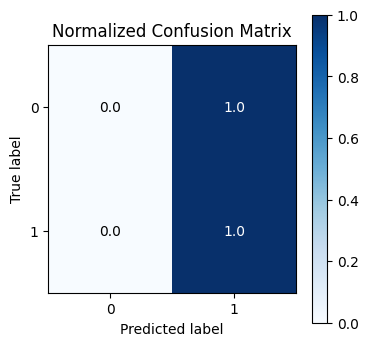

In [213]:
# Tuned ExtraTreesClassifier For Validation

pipeline.set_params(Model = ExtraTreesClassifier(**ExtraTreesClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('ExtraTreesClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned GradientBoostingClassifier For Validation

pipeline.set_params(Model = GradientBoostingClassifier(**GradientBoostingClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('GradientBoostingClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

[0 1 1 0 1 1]
Balanced Accuracy 0.625
Precision 0.75
Recall 0.75
ROC AUC score 0.625
F1 score 0.75
MCC 0.25
Validation score 0.6666666666666666
Confusion matrix
 [[1 1]
 [1 3]]


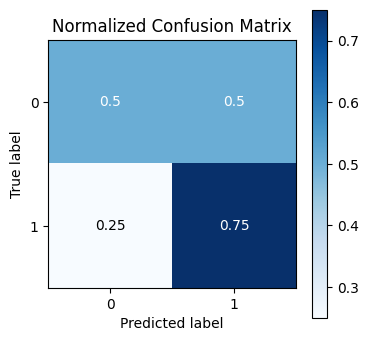

In [214]:
# Tuned SVC For Validation

pipeline.set_params(Model = SVC(**SVCTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('SVC')
y_pred = pipeline.predict(X_validation) # .predict(X)
#y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

[0 1 1 0 1 1]
Balanced Accuracy 0.625
Precision 0.75
Recall 0.75
ROC AUC score 0.625
F1 score 0.75
MCC 0.25
Validation score 0.6666666666666666
Confusion matrix
 [[1 1]
 [1 3]]


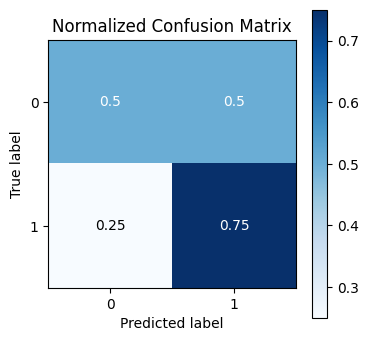

In [215]:
# Tuned MLPClassifier For Validation

pipeline.set_params(Model = MLPClassifier(**MLPClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('MLPClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

[1 1 1 1 1 1]
Balanced Accuracy 0.5
Precision 0.6666666666666666
Recall 1.0
ROC AUC score 0.5
F1 score 0.8
MCC 0.0
Validation score 0.6666666666666666
Confusion matrix
 [[0 2]
 [0 4]]


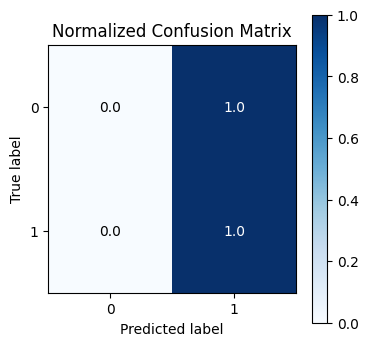

In [216]:
# Tuned KNeighborsClassifier For Validation

pipeline.set_params(Model = KNeighborsClassifier(**KNeighborsClassifierTuned.best_params))
pipeline.fit(X_train, y_train)
classifierListVal.append('KNeighborsClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

[1 1 1 0 1 1]
Balanced Accuracy 0.375
Precision 0.6
Recall 0.75
ROC AUC score 0.375
F1 score 0.6666666666666665
MCC -0.31622776601683794
Validation score 0.5
Confusion matrix
 [[0 2]
 [1 3]]


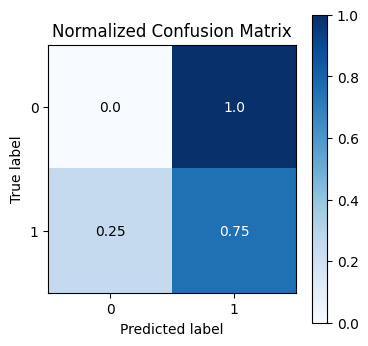

In [217]:
# GaussianProcessClassifier For Validation

pipeline.set_params(Model = GaussianProcessClassifier(random_state = seed, n_jobs=nJobs))
pipeline.fit(X_train, y_train)
classifierListVal.append('GaussianProcessClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned DecisionTreeClassifier For Validation

pipeline.set_params(Model = DecisionTreeClassifier(**DecisionTreeClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('DecisionTreeClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned GaussianNB For Validation

pipeline.set_params(Model = GaussianNB(**GaussianNBTuned.best_params))
pipeline.fit(X_train, y_train)
classifierListVal.append('GaussianNB')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned QuadraticDiscriminantAnalysis For Validation

pipeline.set_params(Model = QuadraticDiscriminantAnalysis(**QuadraticDiscriminantAnalysisTuned.best_params))
pipeline.fit(X_train, y_train)
classifierListVal.append('QuadraticDiscriminantAnalysis')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned LinearSVC For Validation

pipeline.set_params(Model = LinearSVC(**LinearSVCTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('LinearSVC')
y_pred = pipeline.predict(X_validation) # .predict(X)
#y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned RidgeClassifier For Validation

pipeline.set_params(Model = RidgeClassifier(**RidgeClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('RidgeClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
#y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
# Tuned SGDClassifier For Validation

pipeline.set_params(Model = SGDClassifier(**SGDClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('SGDClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

[0 1 0 0 1 1]
Balanced Accuracy 0.5
Precision 0.6666666666666666
Recall 0.5
ROC AUC score 0.5
F1 score 0.5714285714285715
MCC 0.0
Validation score 0.5
Confusion matrix
 [[1 1]
 [2 2]]


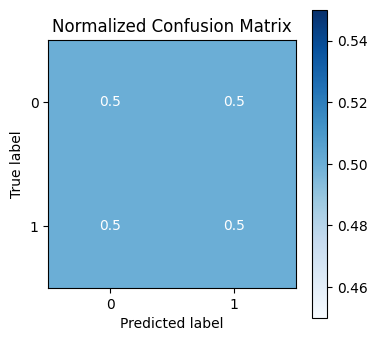

In [221]:
# Tuned XGBClassifier For Validation

pipeline.set_params(Model = XGBClassifier(**XGBClassifierTuned.best_params,random_state = seed))
pipeline.fit(X_train, y_train)
classifierListVal.append('XGBClassifier')
y_pred = pipeline.predict(X_validation) # .predict(X)
y_prob = pipeline.predict_proba(X_validation)
y_pred # Visualizing predictions
print(y_pred)
y_predListVal.append(y_pred)
y_validationListVal.append(y_validation)
y_probListVal.append(y_prob)
seedListStatsVal.append(seed)
trainFracListStatsVal.append(trainFrac)

# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))
print("MCC", sklearn.metrics.matthews_corrcoef(y_validation, y_pred))

balancedAccuracyListVal.append(sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
precisionListVal.append(sklearn.metrics.precision_score(y_validation, y_pred))
recallListVal.append(sklearn.metrics.recall_score(y_validation, y_pred))
ROCAUCScoreListVal.append(sklearn.metrics.roc_auc_score(y_validation, y_pred))
F1ScoreListVal.append(sklearn.metrics.f1_score(y_validation, y_pred))
MCCListVal.append(matthews_corrcoef(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Validation score {s}")

print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [224]:
# tuned individual classifiers on dfValidation

dfValidationModelClassifiersEvalCurrentSeed = pd.DataFrame()


dfValidationModelClassifiersEvalCurrentSeed['classifier'] = classifierListVal
dfValidationModelClassifiersEvalCurrentSeed['seed'] = seed
dfValidationModelClassifiersEvalCurrentSeed['trainFrac'] = trainFrac
dfValidationModelClassifiersEvalCurrentSeed['precision_val'] = precisionListVal
dfValidationModelClassifiersEvalCurrentSeed['MCC_val'] = MCCListVal
dfValidationModelClassifiersEvalCurrentSeed['avgF1weighted_val'] = F1ScoreListVal
dfValidationModelClassifiersEvalCurrentSeed['balancedAccuracy_val'] = balancedAccuracyListVal
dfValidationModelClassifiersEvalCurrentSeed['AUROC_val'] = ROCAUCScoreListVal
dfValidationModelClassifiersEvalCurrentSeed['score_val'] = dfValidationModelClassifiersEvalCurrentSeed['balancedAccuracy_val'] + dfValidationModelClassifiersEvalCurrentSeed['AUROC_val'] + dfValidationModelClassifiersEvalCurrentSeed['MCC_val'] 
dfValidationModelClassifiersEvalCurrentSeed['data'] = 'dfValidation'

#save
dfValidationModelClassifiersEvalCurrentSeed.to_excel('dfTrainModelEvalCurrentSeedIndivClassifiers_'  + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

dfValidationModelClassifiersEvalCurrentSeed.sort_values(by = 'score_val', ascending = False)

,classifier,seed,trainFrac,precision_val,MCC_val,avgF1weighted_val,balancedAccuracy_val,AUROC_val,score_val,data
1,SVC,7,0.75,0.750000,0.250000,0.750000,0.625,0.625,1.500000,dfValidation
2,MLPClassifier,7,0.75,0.750000,0.250000,0.750000,0.625,0.625,1.500000,dfValidation
0,ExtraTreesClassifier,7,0.75,0.666667,0.000000,0.800000,0.500,0.500,1.000000,dfValidation
3,KNeighborsClassifier,7,0.75,0.666667,0.000000,0.800000,0.500,0.500,1.000000,dfValidation
5,XGBClassifier,7,0.75,0.666667,0.000000,0.571429,0.500,0.500,1.000000,dfValidation
4,GaussianProcessClassifier,7,0.75,0.600000,-0.316228,0.666667,0.375,0.375,0.433772,dfValidation


In [223]:
# merge these two eval dfs

dfEvalCombinedCurrentSeed = dfValidationModelClassifiersEvalCurrentSeed.merge(dfTrainModelEvalCurrentSeedIndivClassifiers, how = 'inner', on = 'classifier')

#save
dfEvalCombinedCurrentSeed.to_excel('dfEvalCombinedCurrentSeed_'  + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')

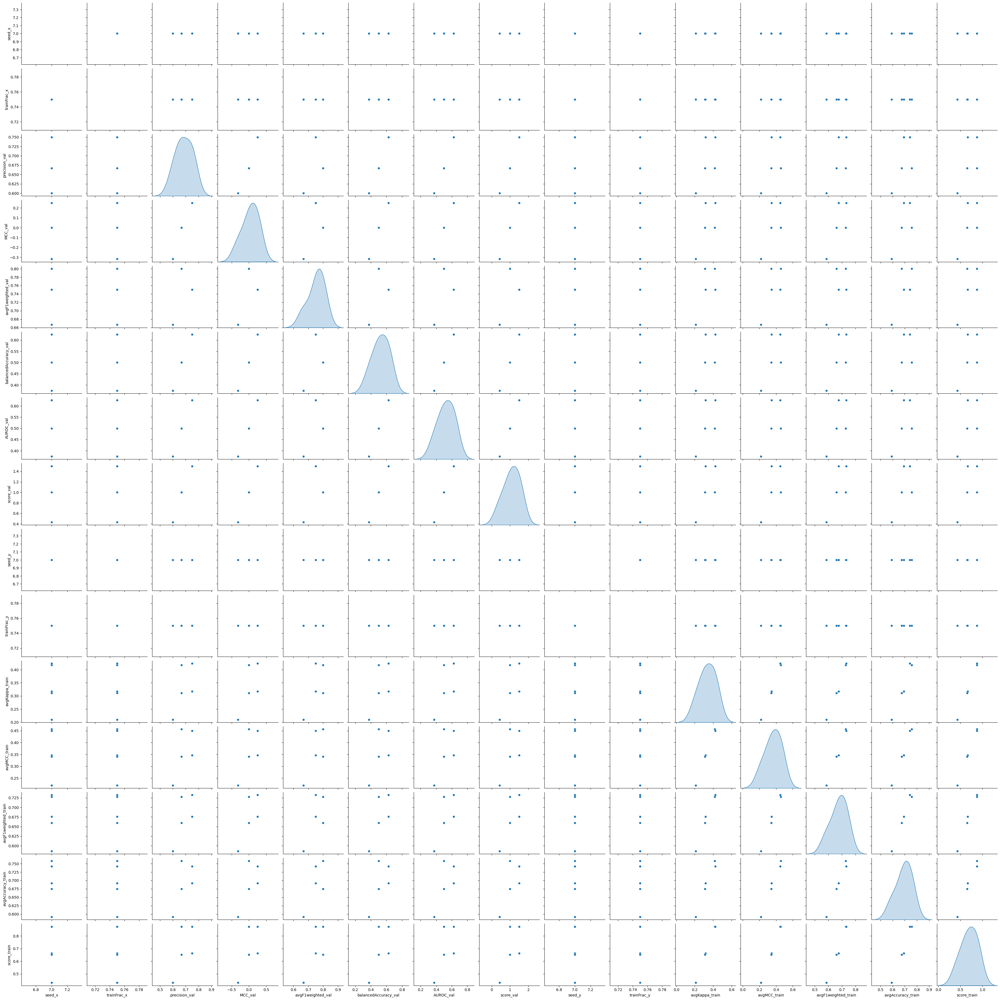

In [220]:
sns.pairplot(data=dfEvalCombinedCurrentSeed, diag_kind='kde')

# create ensemble of best individual classifiers and apply to dfTrain (not dfValidation)

In [ ]:
# remake dfTrain from disk

# Predicting with the pipeline. The key here is not 'fitting'
# could try .score!

#df = dfTrain

# load from saved
dfTrainFromDisk = pd.read_excel('dfTrain_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')
df = dfTrainFromDisk

# select features based on dfTrain's RFE (optional)

fileName = 'selectedFeaturesRFECV_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

with open(fileName + '.json', 'r') as f:
    selected_featuresFromDisk = json.load(f)

colsToKeep = []
colsToKeep = copy.deepcopy(selected_featuresFromDisk)
colsToKeep.append(target)
#print(colsToKeep) # QC
df = df[colsToKeep] # selected features from RFE

In [ ]:
len(colsToKeep)

In [ ]:
# split into X and Y

X_train, y_train = X_y_split(df, target)

In [ ]:
le = LabelEncoder()
y_train = pd.Series(le.fit_transform(y_train))
y_train

In [ ]:
# new, have to use this!
imputeWideDFMinOr0(X_train)

X_train.isna().sum().sum()

In [ ]:
X_train

In [ ]:
ensembleList = []
seedListEnsemble = []
trainFracListEnsemble = []
mean_scoreKappaTunedEnsembleList = []
mean_scoreMCCTunedEnsembleList = []
mean_scoreF1WeightedTunedEnsembleList = []
mean_scoreAccuracyTunedEnsembleList = []
mean_scoreROCTunedEnsembleList = []

In [ ]:
# Creating list of best tuned models
# chose only those that are the best scorer(s) on dfTrain and dfValidation
estimatorList = [
#    ('CatBoostClassifier', CatBoostClassifier(**CatBoostClassifierTuned.best_params,random_state = seed)),
#    ('HistGradientBoostingClassifier', HistGradientBoostingClassifier(**HistGradientBoostingClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('LGBMClassifier', LGBMClassifier(**LGBMClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('AdaBoostClassifier', AdaBoostClassifier(**AdaBoostClassifierTuned.best_params,random_state = seed)),
#    ('RandomForestClassifier', RandomForestClassifier(**RandomForestClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),#
#    ('BaggingClassifier', BaggingClassifier(**BaggingClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('ExtraTreesClassifier', ExtraTreesClassifier(**ExtraTreesClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('GradientBoostingClassifier', GradientBoostingClassifier(**GradientBoostingClassifierTuned.best_params,random_state = seed))#, n_jobs=nJobs)),
    ('SVC', SVC(**SVCTuned.best_params,random_state = seed)),#, probability=True)), 
    ('MLPClassifier', MLPClassifier(**MLPClassifierTuned.best_params,random_state = seed)),
    ('KNeighborsClassifier', KNeighborsClassifier(**KNeighborsClassifierTuned.best_params, n_jobs=nJobs)),
#    ('GaussianProcessClassifier', GaussianProcessClassifier(random_state = seed, n_jobs=nJobs)),
#    ('DecisionTreeClassifier', DecisionTreeClassifier(**DecisionTreeClassifierTuned.best_params,random_state = seed)),
#    ('GaussianNB', GaussianNB(**GaussianNBTuned.best_params)),
#    ('QuadraticDiscriminantAnalysis', QuadraticDiscriminantAnalysis(**QuadraticDiscriminantAnalysisTuned.best_params)),
#    ('LinearSVC', LinearSVC(**LinearSVCTuned.best_params,random_state = seed)),
#    ('RidgeClassifier', RidgeClassifier(**RidgeClassifierTuned.best_params,random_state = seed)),
#    ('SGDClassifier', SGDClassifier(**SGDClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('XGBClassifier', XGBClassifier(**XGBClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
]

In [ ]:
# Creating a stackingclassifier model
stacking_model = StackingClassifier(estimators = estimatorList, n_jobs = nJobs)

In [ ]:
# Visualizing Pipeline
pipeline.set_params(Model = stacking_model)
pipeline

In [ ]:
print('\nStacking Classifier Cross-Validation:')
scores = []
print('\n')
print(f'\nStacking Classifier  :\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []
    
for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        ensembleList.append('StackedClassifier')
        seedListEnsemble.append(seed)
        trainFracListEnsemble.append(trainFrac)
        mean_scoreKappaTunedEnsembleList.append(mean_score)
        mean_scoreMCCTunedEnsembleList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedEnsembleList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedEnsembleList.append(mean_scoreAccuracy)
        mean_scoreROCTunedEnsembleList.append(mean_scoreROC)

In [ ]:
# Creating VotingClassifier model
voting_model = VotingClassifier(estimators = estimatorList, n_jobs = nJobs, voting = 'soft')

In [ ]:
# Setting and visualizing pipeline
pipeline.set_params(Model = voting_model)
#pipeline.set_params(Model = CalibratedClassifierCV(voting_model)) # try when proba probability FALSE error
pipeline

In [ ]:
print('\nVoting Classifier Cross-Validation:')
scores = []
print('\n')
print(f'\nVoting Classifier :\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []
    
for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_val) # often leads to AttributeError: predict_proba is not available when probability=False
    #y_pred = pipeline.score(X_val) # doesn't help with annoying proba/probability false error
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
    predictions = pipeline.predict_proba(X_val)[:,1]
    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
        mean_scoreROC = np.mean(scoresROC)
        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        ensembleList.append('VotingClassifier')
        seedListEnsemble.append(seed)
        trainFracListEnsemble.append(trainFrac)
        mean_scoreKappaTunedEnsembleList.append(mean_score)
        mean_scoreMCCTunedEnsembleList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedEnsembleList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedEnsembleList.append(mean_scoreAccuracy)
        mean_scoreROCTunedEnsembleList.append(mean_scoreROC)

### make a summary DF of untuned ensemble models

# Tuning ensembles
* can't use optuna, so using GridSearchCV from sklearn

In [ ]:
import math

def TurnOptunaTunedParamsToEnsembleGridSearchCVParamGrid():

    global gridSearchParamDict
    gridSearchParamDict = {}
    vList = []
    
#    for estimator in estimatorList[0]:
    for estimator in estimatorList:
#        print(estimator[0]) #QC
        classifierName = estimator[0] + 'Tuned'
#        print(classifierName)
        if classifierName == 'GaussianProcessClassifierTuned': # no tunable parameters
            break        
        
        for k, v in globals()[classifierName].best_params.items(): # needs globals since otherwise its just a string and not a dict
            if type(v) is float:
                vList = [v*0.5, v*0.75, v, v*1.5, v*2] 
            elif type(v) is int:
                vList = [math.floor(v*0.5), math.floor(v*0.75), v, math.ceil(v*1.5), math.ceil(v*2)] # floor division to get integer
            else:
                vList = [v,v,v,v,v]
#                print(vList)
    #            print(k)
            
    #            print(vList)
            #tempName = estimator[0] + str("__") + k # not quite
            tempName = str("Model__") + estimator[0] + str("__") + k
            print(tempName)
            print(vList)
            gridSearchParamDict[tempName] = vList
    
#    return gridSearchParamDict

In [ ]:
TurnOptunaTunedParamsToEnsembleGridSearchCVParamGrid()

In [ ]:
gridSearchParamDict

In [ ]:
# QC
pipeline.set_params(Model = stacking_model)
#pipeline.steps[2]

In [ ]:
# classic way with a pipeline
# manually change classifier list again

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

estimatorUntuned = [
#    ('CatBoostClassifier', CatBoostClassifier(random_state = seed, verbose = False)),
#    ('RandomForestClassifier', RandomForestClassifier(random_state = seed, verbose = False)),
#    ('ExtraTreesClassifier', ExtraTreesClassifier(random_state = seed)),
#    ('AdaBoostClassifier', AdaBoostClassifier(random_state = seed)),
#    ('GradientBoostingClassifier', GradientBoostingClassifier(random_state = seed)),
#    ('BaggingClassifier', BaggingClassifier(random_state = seed)),
#    ('GaussianNB', GaussianNB()),
#    ('GaussianProcessClassifier', GaussianProcessClassifier(random_state = seed)),
#    ('SVC', SVC(random_state = seed, verbose = False)),
#    ('MLPClassifier', MLPClassifier(random_state = seed, verbose = False)),
#    ('LinearSVC', LinearSVC(random_state = seed, verbose = False)),
#    ('KNeighborsClassifier', KNeighborsClassifier()),
#    ('RidgeClassifier', RidgeClassifier(random_state = seed)),
#    ('SGDClassifier', SGDClassifier(random_state = seed)),
#    ('XGBClassifier', XGBClassifier(random_state = seed, verbose = False)),
]

stackingModel = StackingClassifier(estimators = estimatorList, n_jobs = nJobs) # start from tuned, from above
#stackingModel = StackingClassifier(estimators = estimatorUntuned, n_jobs = nJobs) # for untuned, seems bad

pipeline.set_params(Model = stackingModel)

params = gridSearchParamDict

scorers = ['f1_weighted', 'matthews_corrcoef', 'roc_auc']
    
stackedGridRandom = RandomizedSearchCV(
#   Probability = True, # not working for either SearchCV
    estimator =  pipeline,
#    estimator = stackingModel, # old
    param_distributions=params, # for RandomizedSearchCV
    #param_grid = params, # for GridSearchCV
    scoring = 'matthews_corrcoef', #scorers, 'f1_weighted', 'matthews_corrcoef', 'roc_auc'
    #refit = 'matthews_corrcoef', # only when using 'scorers'
    cv=5, # 5, cv
    n_jobs = nJobs, 
    n_iter=200, # for RandomizedSearchCV
#    error_score='raise', 
    verbose = 1, 
    random_state = seed, # for RandomizedSearchCV
)

stackedGridRandom.fit(X_train, y_train)
y_pred = stackedGridRandom.predict(X_val)

In [ ]:
print('best score is ' + str(stackedGridRandom.best_score_))
print('best estimator is ' + str(stackedGridRandom.best_estimator_))
print('best params are ' + str(stackedGridRandom.best_params_))

In [ ]:
# save
# testing!!!
stackedGridRandomTunedBestParams = stackedGridRandom.best_params_
joblib.dump(stackedGridRandomTunedBestParams, 'stackedGridRandomTunedBestParams_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
joblib.dump(stackedGridRandomTunedBestParams, 'stackedGridRandomTunedBestParams') # easy one for current seed for convenience

stackedGridRandomTunedBestEstimator = stackedGridRandom.best_estimator_
joblib.dump(stackedGridRandomTunedBestEstimator, 'stackedGridRandomTunedBestEstimator_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl', compress = 1)
joblib.dump(stackedGridRandomTunedBestEstimator, 'stackedGridRandomTunedBestEstimator') # easy one for current seed for convenience

# this way is fine, but won't allow best_params AND using .best_estimator_ later makes me sure its working
#clf = stackedGridRandom.best_estimator_
#joblib.dump(clf, 'stackedGridRandom_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl', compress = 1) 
#joblib.dump(stackedGridRandom, 'stackedGridRandomTest.pkl') # testing only

clf = stackedGridRandom
joblib.dump(clf, 'stackedGridRandom_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
stackedGridRandom.cv_results_

In [ ]:
# get the parameter names
column_results = [f"param_{name}" for name in params.keys()]
#column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

cv_resultsStackedGridRandom = pd.DataFrame(stackedGridRandom.cv_results_)
cv_resultsStackedGridRandom = cv_resultsStackedGridRandom[column_results]#.sort_values(
#    "mean_test_score", ascending=False)

def shorten_param(param_name):
    if "__" in param_name:
        return param_name.rsplit("__", 1)[1]
    return param_name

cv_resultsStackedGridRandom = cv_resultsStackedGridRandom.rename(shorten_param, axis=1)
cv_resultsStackedGridRandom

In [ ]:
# reload from disk

# testing!
stackedGridRandomTunedParamsFromDisk = joblib.load('stackedGridRandomTunedBestParams_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

stackedGridRandomTuned = joblib.load('stackedGridRandom_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#stackedGridRandomTuned = joblib.load('stackedGridRandomTest.pkl')
#stackedGridRandomTuned.best_estimator

In [ ]:
print('\nStacking ensemble with randomly optimized parameters - Classifier Cross-Validation:')
scores = []
print('\n')
print(f'\nStacking Classifier  :\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []
    
for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        
    #stackedGridRandom.fit(X_train, y_train).best_params_ #not loaded from disk
    pipeline.set_params(Model = stackedGridRandomTuned.best_estimator_) # loaded from disk 
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
#    predictions = pipeline.predict_proba(X_val)[:,1]
#    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
#    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
#        mean_scoreROC = np.mean(scoresROC)
#        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
#        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        ensembleList.append('stackedGridRandomFreshlyTuned')
        seedListEnsemble.append(seed)
        trainFracListEnsemble.append(trainFrac)
        mean_scoreKappaTunedEnsembleList.append(mean_score)
        mean_scoreMCCTunedEnsembleList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedEnsembleList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedEnsembleList.append(mean_scoreAccuracy)
        mean_scoreROCTunedEnsembleList.append('NA') #(mean_scoreROC)

## Test tuned stacked ensemble on dfValidation

In [ ]:
# Predicting with the pipeline. The key here is not 'fitting'
# could try .score!

#df = dfValidation

# load from saved
dfValidationFromDisk = pd.read_excel('dfValidation_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')
df = dfValidationFromDisk

y_testList = []
y_predList = []
y_probList = []

In [ ]:
# select features based on dfTrain's RFE (optional)

fileName = 'selectedFeaturesRFECV_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

with open(fileName + '.json', 'r') as f:
    selected_featuresFromDisk = json.load(f)

colsToKeep = []
colsToKeep = copy.deepcopy(selected_featuresFromDisk)
colsToKeep.append(target)
#print(colsToKeep) # QC
df = df[colsToKeep] # selected features from RFE

In [ ]:
len(colsToKeep)

In [ ]:
# split into X and Y

X_validation, y_validation = X_y_split(df, target)

In [ ]:
le = LabelEncoder()
y_validation = pd.Series(le.fit_transform(y_validation))
y_validation

In [ ]:
# new, have to use this!
imputeWideDFMinOr0(X_validation)

X_validation.isna().sum().sum()

In [ ]:
X_validation

In [ ]:
genesWithNANs = X_validation.columns[X_validation.isna().any()].tolist()
genesWithNANs

In [ ]:
X_validation[genesWithNANs]

In [ ]:
min(X_validation.min())

In [ ]:
# drop these genes since can't test
# don't do, or it will error that there are different values than those that were fit on

#X_test.drop(genesWithNANs, axis=1, inplace = True)

# set to min value in df
X_validation[genesWithNANs] = min(X_validation.min())
X_validation[genesWithNANs]

In [ ]:
# QC

X_validation.isna().sum().sum()
#X_test.isna().sum()

In [ ]:
y_pred = pipeline.predict(X_validation) # .predict(X)
y_pred # Visualizing predictions

In [ ]:
y_prob = pipeline.predict_proba(X_validation) # .predict(X)
y_prob # Visualizing predictions

In [ ]:
y_predList.append(y_pred)
y_validationList.append(y_test)
y_probList.append(y_prob)
seedListStats.append(seed)
trainFracListStats.append(trainFrac)

In [ ]:
# make a final pipeline list
import glob

finalPipelineList = glob.glob('*FinalPipeline.pkl') # needs to add in Pytorch or AutoSKLearn
finalPipelineList = natsorted(finalPipelineList)

## stats

In [ ]:
print(len(X_validation))
print(len(y_validation))
print(len(y_pred))

In [ ]:
# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_validation, y_pred))
print("Precision", sklearn.metrics.precision_score(y_validation, y_pred))
print("Recall", sklearn.metrics.recall_score(y_validation, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_validation, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_validation, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_validation, y_validation)
print(f"Test score {s}")

In [ ]:
print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_validation, y_pred))

In [ ]:
from sklearn.metrics import RocCurveDisplay, roc_curve

In [ ]:
# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(y_validation, y_pred, normalize=True,figsize=(4,4))
plt.show()

In [ ]:
fig = plt.figure(figsize=(3, 3))
ax = fig.add_subplot()

# predict on the test data using the single-objective Auto-sklearn & plot perf
single_objective_precision = sklearn.metrics.precision_score(y_validation, y_pred)
single_objective_recall = sklearn.metrics.recall_score(y_validation, y_pred)

ax.scatter(single_objective_precision, single_objective_recall, label= "Pipeline")

# Label the plot
_ = ax.set_xlabel("Precision / Positive Predictive Value")
_ = ax.set_ylabel("True Positive Rate / Recall")
_ = ax.set_xlim((0, 1))
_ = ax.set_ylim((0, 1))
_ = ax.legend(bbox_to_anchor=(1.75, .95), loc='center right', borderaxespad=0)
_ = ax.set_title("Test performances of all models found by Auto-sklearn2")

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_validation, y_pred) # for one trial

# for all models
from collections.abc import Iterable
def flatten(lis):
     for item in lis:
         if isinstance(item, Iterable) and not isinstance(item, str):
             for x in flatten(item):
                 yield x
         else:        
             yield item
cm = confusion_matrix(list(flatten(y_validationList)), list(flatten(y_predList))) # for all models

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

In [ ]:
# Classification Report

print(classification_report(y_validation,y_pred))

In [ ]:
# append stacking classifiers results from dfValidatio
# testing

dfValidationModelClassifiersEvalCurrentSeed['classifier'] = 'stackedClassifierTuned'
dfValidationModelClassifiersEvalCurrentSeed['seed'] = seed
dfValidationModelClassifiersEvalCurrentSeed['trainFrac'] = trainFrac
dfValidationModelClassifiersEvalCurrentSeed['precision'] = sklearn.metrics.precision_score(y_validation, y_pred)
dfValidationModelClassifiersEvalCurrentSeed['MCC'] = matthews_corrcoef(y_val, y_pred)
dfValidationModelClassifiersEvalCurrentSeed['avgF1weighted'] = sklearn.metrics.f1_score(y_validation, y_pred)
dfValidationModelClassifiersEvalCurrentSeed['balancedAccuracy'] = sklearn.metrics.balanced_accuracy_score(y_validation, y_pred)
dfValidationModelClassifiersEvalCurrentSeed['AUROC'] = sklearn.metrics.roc_auc_score(y_validation, y_pred)
dfValidationModelClassifiersEvalCurrentSeed['score'] = dfValidationModelClassifiersEvalCurrentSeed['balancedAccuracy'] + dfValidationModelClassifiersEvalCurrentSeed['AUROC'] + dfValidationModelClassifiersEvalCurrentSeed['MCC'] 

dfValidationModelEvalCurrentSeedIndivClassifiers.sort_values(by = 'score', ascending = False)

### now do GridSearch on HPC

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

stackingModel = StackingClassifier(estimators = estimatorList, n_jobs = nJobs)
pipeline.set_params(Model = stacking_model)

params = gridSearchParamDict

#scorers = ['f1_weighted', 'matthews_corrcoef', 'roc_auc']
    
stackedGridSearch = GridSearchCV(
#        Probability = True, # not working for either SearchCV
    pipeline,
    param_grid = params, # for GridSearchCV
#        scoring = scorers,
#        refit = 'matthews_corrcoef',
    cv=5, 
    n_jobs = nJobs, 
#        error_score='raise', 
    verbose = 1, 
)

stackedGridSearch.fit(X_train, y_train)
y_pred = stackedGridSearch.predict(X_val)

stackedGridRandom.fit(X_train, y_train)
y_pred = stackedGridRandom.predict(X_val)

In [ ]:
print('best score is ' + str(stackedGridSearch.best_score_))
print('best estimator is ' + str(stackedGridSearch.best_estimator_))
print('best params are ' + str(stackedGridSearch.best_params_))

# save
clf = stackedGridSearch.best_estimator_
joblib.dump(clf, 'stackedGridSearch_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
# testing!!!
stackedGridSearchTunedBestParams = stackedGridSearch.best_params_
joblib.dump(stackedGridSearchTunedBestParams, 'stackedGridSearchTunedBestParams_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
joblib.dump(stackedGridSearchTunedBestParams, 'stackedGridSearchTunedBestParams') # easy one for current seed for convenience

stackedGridSearchTunedBestEstimator = stackedGridSearch.best_estimator_
joblib.dump(stackedGridSearchTunedBestEstimator, 'stackedGridSearchTunedBestEstimator_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl', compress = 1)
joblib.dump(stackedGridSearchTunedBestEstimator, 'stackedGridSearchTunedBestEstimator') # easy one for current seed for convenience

# this way is fine, but won't allow best_params AND using .best_estimator_ later makes me sure its working
#clf = stackedGridSearch.best_estimator_
#joblib.dump(clf, 'stackedGridSearch_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl', compress = 1) 
#joblib.dump(stackedGridSearch, 'stackedGridSearchTest.pkl') # testing only

clf = stackedGridSearch
joblib.dump(clf, 'stackedGridSearch_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
# get the parameter names
column_results = [f"param_{name}" for name in params.keys()]
column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

cv_resultsStackedGridSearch = pd.DataFrame(stackedGridSearch.cv_results_)
cv_resultsStackedGridSearch = cv_resultsStackedGridSearch[column_results].sort_values(
    "mean_test_score", ascending=False
)

def shorten_param(param_name):
    if "__" in param_name:
        return param_name.rsplit("__", 1)[1]
    return param_name


cv_resultsStackedGridSearch = cv_resultsStackedGridSearch.rename(shorten_param, axis=1)
cv_resultsStackedGridSearch

In [ ]:
# reload from disk

# testing!
stackedGridSearchTunedParamsFromDisk = joblib.load('stackedGridSearchTunedParams_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

stackedGridSearchTuned = joblib.load('stackedGridSearch_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#stackedGridSearch = joblib.load('stackedGridSearch.pkl')
#stackedGridSearch.best_estimator

In [ ]:
print('\nStacking ensemble with systematically optimized parameters - Classifier Cross-Validation:')
scores = []
print('\n')
print(f'\nStacking Classifier  :\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []
    
for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    #stackedGridSearch.fit(X_train, y_train).best_params_ #not loaded from disk
    pipeline.set_params(Model = stackedGridSearchTuned.best_estimator_) # loaded form disk 
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
#    predictions = pipeline.predict_proba(X_val)[:,1]
#    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
#    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
#        mean_scoreROC = np.mean(scoresROC)
#        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
#        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        ensembleList.append('stackedGridSearchTuned')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append('NA') #(mean_scoreROC)

## do same optimization for voting ensemble

In [ ]:
# testing my original way that maybe worked great??

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import  RandomizedSearchCV

estimatorUntuned = [
#    ('CatBoostClassifier', CatBoostClassifier(random_state = seed, verbose = False)),
#    ('RandomForestClassifier', RandomForestClassifier(random_state = seed, verbose = False)),
#    ('ExtraTreesClassifier', ExtraTreesClassifier(random_state = seed)),
#    ('AdaBoostClassifier', AdaBoostClassifier(random_state = seed)),
#    ('GradientBoostingClassifier', GradientBoostingClassifier(random_state = seed)),
#    ('BaggingClassifier', BaggingClassifier(random_state = seed)),
#    ('GaussianNB', GaussianNB()),
    ('GaussianProcessClassifier', GaussianProcessClassifier(random_state = seed)),
#    ('SVC', SVC(random_state = seed, verbose = False)),
    ('MLPClassifier', MLPClassifier(random_state = seed, verbose = False)),
#    ('LinearSVC', LinearSVC(random_state = seed, verbose = False)),
#    ('KNeighborsClassifier', KNeighborsClassifier()),
#    ('RidgeClassifier', RidgeClassifier(random_state = seed)),
#    ('SGDClassifier', SGDClassifier(random_state = seed)),
    ('XGBClassifier', XGBClassifier(random_state = seed, verbose = False)),
]

# Creating a stackingclassifier model
#stacking_model = StackingClassifier(estimators = estimatorsTest, n_jobs = 5)

# Visualizing Pipeline
#pipeline.set_params(Model = stacking_model)

# orig below
estimatorList = [    
#    ('BaggingClassifier', BaggingClassifier(random_state = seed)),
#    ('ExtraTreesClassifier', ExtraTreesClassifier(**ExtraTreesClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('GradientBoostingClassifier', GradientBoostingClassifier(**GradientBoostingClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
#    ('SVC', SVC(**SVCTuned.best_params,random_state = seed)),#, probability=True)), 
    ('MLPClassifier', MLPClassifier(**MLPClassifierTuned.best_params,random_state = seed)),
#    ('KNeighborsClassifier', KNeighborsClassifier(**KNeighborsClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
    ('GaussianProcessClassifier', GaussianProcessClassifier(random_state = seed, n_jobs=nJobs)),
#    ('DecisionTreeClassifier', DecisionTreeClassifier(random_state = seed)),
#    ('GaussianNB', GaussianNB(**GaussianNBTuned.best_params)),
#    ('QuadraticDiscriminantAnalysis', QuadraticDiscriminantAnalysis(**QuadraticDiscriminantAnalysisTuned.best_params)),
#    ('LinearSVC', LinearSVC(**LinearSVCTuned.best_params,random_state = seed)),
#    ('RidgeClassifier', RidgeClassifier(**RidgeClassifierTuned.best_params,random_state = seed)),
#    ('SGDClassifier', SGDClassifier(**SGDClassifierTuned.best_params,random_state = seed, n_jobs=nJobs)),
    ('XGBClassifier', XGBClassifier(random_state = seed)),
]

voting_modelTest = VotingClassifier(estimators = estimatorUntuned, n_jobs = 5)

params = gridSearchParamDict

scorers = ['f1_weighted', 'matthews_corrcoef', 'roc_auc']
    
votingGridRandom = RandomizedSearchCV(
#   Probability = True, # not working for either SearchCV
    estimator =  pipeline,
#    estimator = stackingModel, # old
    param_distributions=params, # for RandomizedSearchCV
    #param_grid = params, # for GridSearchCV
    scoring = 'matthews_corrcoef', #scorers, 'f1_weighted', 'matthews_corrcoef', 'roc_auc'
    #refit = 'matthews_corrcoef', # only when using 'scorers'
    cv=5, # 5, cv
    n_jobs = nJobs, 
    n_iter=200, # for RandomizedSearchCV
#    error_score='raise', 
    verbose = 1, 
    random_state = seed, # for RandomizedSearchCV
)
    
votingGridRandom.fit(X_train, y_train)
y_pred = votingGridRandom.predict(X_val)

In [ ]:
# classic way with a pipeline

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

votingModel = VotingClassifier(estimators = estimatorList, n_jobs = nJobs, voting = 'soft')
pipeline.set_params(Model = votingModel)

params = gridSearchParamDict

scorers = ['f1_weighted', 'matthews_corrcoef', 'roc_auc']
    
votingGridRandom = RandomizedSearchCV(
#   Probability = True, # not working for either SearchCV
    pipeline,
#    estimator = stackingModel, 
    param_distributions=params, # for RandomizedSearchCV
    #param_grid = params, # for GridSearchCV
#    scoring = 'matthews_corrcoef', #scorers, 'f1_weighted', 'matthews_corrcoef', 'roc_auc'
#        refit = 'matthews_corrcoef',
    cv=5,
    #n_jobs = nJobs, 
    n_iter=200, # for RandomizedSearchCV
#    error_score='raise', 
    verbose = 1, 
    random_state = seed, # for RandomizedSearchCV
    pre_dispatch = 1 # doesn't help to deal with memory issues
)

votingGridRandom.fit(X_train, y_train)
y_pred = votingGridRandom.predict(X_val)

In [ ]:
print('best score is ' + str(votingGridRandom.best_score_))
print('best estimator is ' + str(votingGridRandom.best_estimator_))
print('best params are ' + str(votingGridRandom.best_params_))

In [ ]:
# save
# testing!!!
votingGridRandomTunedBestParams = votingGridRandom.best_params_
joblib.dump(votingGridRandomTunedBestParams, 'votingGridRandomTunedBestParams_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
joblib.dump(votingGridRandomTunedBestParams, 'votingGridRandomTunedBestParams') # easy one for current seed for convenience

votingGridRandomTunedBestEstimator = votingGridRandom.best_estimator_
joblib.dump(votingGridRandomTunedBestEstimator, 'votingGridRandomTunedBestEstimator_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl', compress = 1)
joblib.dump(votingGridRandomTunedBestEstimator, 'votingGridRandomTunedBestEstimator') # easy one for current seed for convenience

# this way is fine, but won't allow best_params AND using .best_estimator_ later makes me sure its working
#clf = votingGridRandom.best_estimator_
#joblib.dump(clf, 'votingGridRandom_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl', compress = 1) 
#joblib.dump(votingGridRandom, 'votingGridRandomTest.pkl') # testing only

clf = stackedGridRandom
joblib.dump(clf, 'votingGridRandom_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

In [ ]:
# get the parameter names
column_results = [f"param_{name}" for name in params.keys()]
column_results += ["mean_test_score", "std_test_score", "rank_test_score"]

cv_resultsVotingGridRandom = pd.DataFrame(votingGridRandom.cv_results_)
cv_resultsVotingGridRandom = cv_resultsVotingGridRandom[column_results].sort_values(
    "mean_test_score", ascending=False
)

def shorten_param(param_name):
    if "__" in param_name:
        return param_name.rsplit("__", 1)[1]
    return param_name

cv_resultsVotingGridRandom = cv_resultsVotingGridRandom.rename(shorten_param, axis=1)
cv_resultsVotingGridRandom

In [ ]:
# reload from disk

# testing!
votingGridRandomTunedParamsFromDisk = joblib.load('votingGridRandomTunedBestParams_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')

votingGridRandomTuned = joblib.load('votingGridRandom_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#votingGridRandomTuned = joblib.load('votingGridRandomTest.pkl')
#votingGridRandomTuned.best_estimator

In [ ]:
print('\nVoting ensemble with randomly optimized parameters - Classifier Cross-Validation:')
scores = []
print('\n')
print(f'\nVoting Classifier  :\n')
scores = []
scoresMCC = []
scoresF1Weighted = []
scoresAccuracy = []
scoresROC = []
    
for i, (train_index, val_index) in enumerate(cv_splits):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]

    #votingGridRandomTuned.fit(X_train, y_train).best_params_ #not loaded from disk
    pipeline.set_params(Model = votingGridRandomTuned.best_estimator_) # loaded form disk 
    y_pred = pipeline.predict(X_val)
        
    kappa = cohen_kappa_score(y_val, y_pred, weights = 'quadratic')
    mcc = matthews_corrcoef(y_val, y_pred)
    f1Weighted = f1_score(y_val, y_pred, average = 'weighted')
    accuracy = accuracy_score(y_val, y_pred)
#    predictions = pipeline.predict_proba(X_val)[:,1]
#    auc = roc_auc_score(y_val, predictions)
        
 #   print(f'Fold {i + 1}:\n')
 #   print(f'  Quadratic Weighted Kappa = {kappa:.4f}')
        
    scores.append(kappa)
    scoresMCC.append(mcc)
    scoresF1Weighted.append(f1Weighted)
    scoresAccuracy.append(accuracy)
#    scoresROC.append(auc)
#    feature_importance.append(pipeline[-1].feature_importances_)
        
 #   print('===================================================')
    
    if i == len(cv_splits) - 1:
        mean_score = np.mean(scores)
        fold_std = np.std(scores)
        mean_scoreMCC = np.mean(scoresMCC)
        fold_stdMCC = np.std(scoresMCC)
        mean_scoreF1Weighted = np.mean(scoresF1Weighted)
        fold_stdF1Weighted = np.std(scoresF1Weighted)
        mean_scoreAccuracy = np.mean(scoresAccuracy)
        fold_stdAccuracy = np.std(scoresAccuracy)
#        mean_scoreROC = np.mean(scoresROC)
#        fold_stdROC = np.std(scoresROC)
        
        print(f'\n  Mean Quadratic Weighted Kappa = = {mean_score:.4f} \u00B1 {fold_std:.4f}')
        print(f'\n  Matthews correlation coefficient = = {mean_scoreMCC:.4f} \u00B1 {fold_stdMCC:.4f}')
        print(f'\n  F1 weighted score = = {mean_scoreF1Weighted:.4f} \u00B1 {fold_stdF1Weighted:.4f}')
        print(f'\n  Accuracy (normalized) = = {mean_scoreAccuracy:.4f} \u00B1 {fold_stdAccuracy:.4f}')
#        print(f'\n  AUROC = = {mean_scoreROC:.4f} \u00B1 {fold_stdROC:.4f}')

        ensembleList.append('votingGridRandomTuned')
        seedList.append(seed)
        trainFracList.append(trainFrac)
        mean_scoreKappaTunedClassifierList.append(mean_score)
        mean_scoreMCCTunedClassifierList.append(mean_scoreMCC)
        mean_scoreF1WeightedTunedClassifierList.append(mean_scoreF1Weighted)
        mean_scoreAccuracyTunedClassifierList.append(mean_scoreAccuracy)
        mean_scoreROCTunedClassifierList.append('NA') #(mean_scoreROC)

# Final pipeline to 'Test'
* manually curate the best option here since it'll be used for dfTest

In [900]:
# Final pipeline

# from pkl

# works when fresh, but not when restored from disk?
####pipeline.set_params(Model = joblib.load('stackedGridRandom_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl'))

# testing fresh
####pipeline.set_params(Model = stackedGridRandomTuned(stackedGridRandomTunedParamsFromDisk))
#pipeline.set_params(Model = stackedGridRandom.fit(X_train, y_train).best_params_) # not loaded from disk
#pipeline.set_params(Model = stackedGridRandom) # not loaded from disk
#pipeline.set_params(Model = stackedGridRandom)
#pipeline.set_params(Model = votingGridRandom)
#pipeline.set_params(Model = stackedGridRandom.best_estimator_) # not loaded from disk
#pipeline = stackedGridRandom.best_estimator_

# is it better then this non-tuned option?
#pipeline.set_params(Model = stacking_model)

# testing if same result as from disk
#stackedGridRandomTuned = joblib.load('stackedGridRandom_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#pipeline = stackedGridRandomTuned.best_estimator_ # good AND HAS .best_params!! PerfeCt!

#votingGridRandomTuned = joblib.load('stackedGridRandom_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl')
#pipeline = votingGridRandomTuned.best_estimator_ # good AND HAS .best_params!! PerfeCt!


# indiv, from disk
#pipeline.set_params(Model = CatBoostClassifier(**CatBoostClassifierTuned.best_params,random_state = seed, verbose = False))
#pipeline.set_params(Model = HistGradientBoostingClassifier(**HistGradientBoostingClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = DecisionTreeClassifier(**DecisionTreeClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = AdaBoostClassifier(**AdaBoostClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = LGBMClassifier(**LGBMClassifierTuned.best_params,random_state = seed, verbosity = -1))
#pipeline.set_params(Model = BaggingClassifier(**BaggingClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = MLPClassifier(**MLPClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = ExtraTreesClassifier(**ExtraTreesClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = GradientBoostingClassifier(**GradientBoostingClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = GaussianNB(**GaussianNBTuned.best_params))
#pipeline.set_params(Model = DecisionTreeClassifier(**DecisionTreeClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = RandomForestClassifier(**RandomForestClassifierTuned.best_params,random_state = seed))
pipeline.set_params(Model = KNeighborsClassifier(**KNeighborsClassifierTuned.best_params, n_jobs=nJobs))
#pipeline.set_params(Model = GaussianProcessClassifier(random_state = seed, n_jobs=nJobs))
#pipeline.set_params(Model = QuadraticDiscriminantAnalysis(**QuadraticDiscriminantAnalysisTuned.best_params))
#pipeline.set_params(Model = RidgeClassifier(**RidgeClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = LinearSVC(**LinearSVCTuned.best_params,random_state = seed))
#pipeline.set_params(Model = SVC(**SVCTuned.best_params,random_state = seed))#, probability=True))
#pipeline.set_params(Model = SGDClassifier(**SGDClassifierTuned.best_params,random_state = seed))
#pipeline.set_params(Model = XGBClassifier(**XGBClassifierTuned.best_params,random_state = seed))

# these are untuned
#pipeline.set_params(Model = StackingClassifier(estimators = estimatorList, n_jobs = nJobs))
#pipeline.set_params(Model = VotingClassifier(estimators = estimatorList, n_jobs = nJobs, voting = 'soft'))


# save final pipeline
# in progress!
#clf = gridVoting.best_estimator_
#joblib.dump(clf, 'seed' + str(seed) + '_trainFrac' + str(trainFrac) + 'FinalPipeline.pkl') 

pipeline

Pipeline(steps=[('Transforming Distribution',
                 RobustScaler(quantile_range=(25, 75))),
                ('Standard Scaler', StandardScaler()),
                ('Model',
                 KNeighborsClassifier(algorithm='ball_tree', leaf_size=45,
                                      metric='euclidean', n_jobs=6,
                                      n_neighbors=2))])

In [901]:
# QC it matches best_estimator_
pipeline.get_params()

{'memory': None,
 'steps': [('Transforming Distribution',
   RobustScaler(quantile_range=(25, 75))),
  ('Standard Scaler', StandardScaler()),
  ('Model',
   KNeighborsClassifier(algorithm='ball_tree', leaf_size=45, metric='euclidean',
                        n_jobs=6, n_neighbors=2))],
 'verbose': False,
 'Transforming Distribution': RobustScaler(quantile_range=(25, 75)),
 'Standard Scaler': StandardScaler(),
 'Model': KNeighborsClassifier(algorithm='ball_tree', leaf_size=45, metric='euclidean',
                      n_jobs=6, n_neighbors=2),
 'Transforming Distribution__copy': True,
 'Transforming Distribution__quantile_range': (25, 75),
 'Transforming Distribution__unit_variance': False,
 'Transforming Distribution__with_centering': True,
 'Transforming Distribution__with_scaling': True,
 'Standard Scaler__copy': True,
 'Standard Scaler__with_mean': True,
 'Standard Scaler__with_std': True,
 'Model__algorithm': 'ball_tree',
 'Model__leaf_size': 45,
 'Model__metric': 'euclidean',
 'Mo

### this works (generic) to 'fit' the pipeline

In [902]:
# even simpler fit?
# seems to work. Not always necessary to do once you change the pipeline model, at least wen loading from saved.

pipeline.fit(X, y) # if jumping right here for testing after validation, this X is dfTrain loaded at the top
#pipeline.fit(X_train, y_train)

Pipeline(steps=[('Transforming Distribution',
                 RobustScaler(quantile_range=(25, 75))),
                ('Standard Scaler', StandardScaler()),
                ('Model',
                 KNeighborsClassifier(algorithm='ball_tree', leaf_size=45,
                                      metric='euclidean', n_jobs=6,
                                      n_neighbors=2))])

In [407]:
#pipeline[-1].feature_names_in_
pipeline[-1].get_feature_names_out()
#pipeline[-1].n_features_in_

AttributeError: 'KNeighborsClassifier' object has no attribute 'get_feature_names_out'

In [ ]:
# if jumping right here for testing after validation, one can get feature importance
# the X fitted above is very likely dfTrain, which is perfect for this analysis.

from sklearn.inspection import permutation_importance
from matplotlib import pyplot

# With the Permutation Importance feature selection method, the performance of a model is tested after 
# removing each individual feature and replacing that feature with random noise. In this way the importance 
# of individual features can be directly compared, and a quantitative threshold can be used to determine feature inclusion.

# perform permutation importance
results = permutation_importance(pipeline[-1], X, y, 
    scoring='matthews_corrcoef', # 'balanced_accuracy', 'accuracy', 'f1_weighted', 'matthews_corrcoef', 'roc_auc'
    n_repeats=10,
    random_state = seed,
    n_jobs = nJobs,
    )

# get importance
importance = results.importances_mean
# summarize feature importance

# collect results and eventually make this into a df of feature importance
finalImportancesMeanList.append(results.importances_mean)
finalFeaturesList.append(pipeline[-1].feature_names_in_)

print("One way to list importances that I can't figure out how to sort:")
for i,v in enumerate(importance):
    #print(pipeline[-1].feature_names_in_[i], 'Feature: %0d, Score: %.5f' % (i,v))
    print(pipeline[-1].feature_names_in_[i], ', Score: %.5f' % (v))

print('\nAnother way to list importances that is sorted:')
for i in results.importances_mean.argsort()[::-1]:
    #if results.importances_mean[i] - 2 * results.importances_std[i] > 0:
        print(f"{pipeline[-1].feature_names_in_ [i]:<8}"
            f"{results.importances_mean[i]:.3f}"
            f" +/- {results.importances_std[i]:.3f}")

# plot feature importance
#pyplot.bar([x for x in range(len(importance))], importance) # original, doesn't label gene names
pyplot.barh(pipeline[-1].feature_names_in_, importance)
pyplot.show()

# old notes
#pipeline[-1].kneighbors(X, return_distance = False) # works, but not sure if useful

In [408]:
# transform X into final values
# make lime-specific pipeline with no model

pipelineLime = Pipeline(steps=[
    ('Transforming Distribution',  RobustScaler(with_centering = True, with_scaling = True, quantile_range=(25, 75), unit_variance = False)),
    ('Standard Scaler', StandardScaler()),
#    ('RFE', RFECV(estimator=RandomForestClassifier(random_state=seed), cv=cv, scoring=make_scorer(quadratic_weighted_kappa), n_jobs = nJobs)),
    ('Model', None),
]#, verbose=True,
)

Xlime = pipelineLime.fit_transform(X)


In [409]:
# delete

pipeline.predict_proba(X)

array([[1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [0.5, 0.5],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [0.5, 0.5],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. ,

In [410]:
# https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html
# https://vishesh-gupta.medium.com/understanding-your-model-with-lime-d7704d984696

explainer = lime.lime_tabular.LimeTabularExplainer(
    Xlime, 
    feature_names=selected_featuresFromDisk, 
    #class_names=np.array(y.unique()), # works
    class_names = ['0', '1'],
    discretize_continuous=True, #?? # Discretized features make for more intuitive explanations.
    mode='classification',
    verbose=True,
    random_state = seed,
    )

In [411]:
i = 1 # an integer or random number: np.random.randint(0, Xlime.shape[0])

exp = explainer.explain_instance(Xlime[i], 
    pipeline.predict_proba,
    num_features=50, # maximum number of features present in explanation
    #num_samples = 50, # size of the neighborhood to learn the linear model
    top_labels=2 # ignore labels and produce explanations for the K labels with highest prediction probabilities, where K is this parameter.
)

exp.show_in_notebook(show_table=True, show_all=False) # show_table=True, show_all=False
exp.save_to_file('explanation.html')

# note that the row we are explained is displayed on the right side, in table format. 
# Since we had the show_all parameter set to false, only the features used in the explanation are displayed
# The value column displays the original value for each feature.

# Note that LIME has discretized the features in the explanation. This is because we let discretize_continuous=True in the constructor (this is the default). 
# Discretized features make for more intuitive explanations.

Intercept -0.00206847841014819
Prediction_local [0.00920127]
Right: 0.0
Intercept 1.0020684784101481
Prediction_local [0.99079873]
Right: 1.0


In [412]:
exp.as_list()

[('-1.17 < COLEC11 <= 0.34', 0.0007250080133440637),
 ('-0.70 < IGHG2 <= 0.09', 0.0004385301949834383),
 ('0.26 < PZP <= 0.65', 0.0004354516290463093),
 ('ADAMTS13 > 0.97', 0.0004179506074013303),
 ('C6 <= -0.47', 0.0004178016324549387),
 ('0.20 < IGHV4-28 <= 0.75', 0.00041480298411692443),
 ('-0.65 < HPX <= 0.27', 0.0004148000224981835),
 ('ITIH2 <= -0.47', 0.00041000804781770814),
 ('KRT6A > 0.92', 0.0004085189805761725),
 ('KRT77 > 0.91', 0.0004039775180503328),
 ('AZGP1 <= -0.76', 0.00040278205559694195),
 ('THBS2 <= -0.59', -0.0004027384857078784),
 ('-0.51 < IGKV4-1 <= 0.08', 0.0004015866442433365),
 ('IGKV3D-20 <= -1.51', 0.0003987410942515037),
 ('0.29 < APOA2 <= 0.83', 0.00039813543020489236),
 ('ECM1 > 0.70', 0.00039725242913311637),
 ('C1RL <= -0.62', 0.0003947681586337485),
 ('-0.69 < FTL <= 0.85', 0.0003924791853414906),
 ('APOH <= -0.60', 0.000392078434937225),
 ('0.42 < IGHA2 <= 0.83', 0.00039015142257420944),
 ('-0.61 < FGB <= -0.09', 0.0003814638943568811),
 ('F2 <= -0

In [413]:
# get coefficient of each variable and creating Lime prediction from it
pd.DataFrame(exp.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,-1.17 < COLEC11 <= 0.34,0.000725
1,-0.70 < IGHG2 <= 0.09,0.000439
2,0.26 < PZP <= 0.65,0.000435
3,ADAMTS13 > 0.97,0.000418
4,C6 <= -0.47,0.000418
5,0.20 < IGHV4-28 <= 0.75,0.000415
6,-0.65 < HPX <= 0.27,0.000415
7,ITIH2 <= -0.47,0.000410
8,KRT6A > 0.92,0.000409
9,KRT77 > 0.91,0.000404


In [414]:
# saw in an example
exp.intercept[1] + pd.DataFrame(exp.as_list())[1].sum()

0.009201273749964963

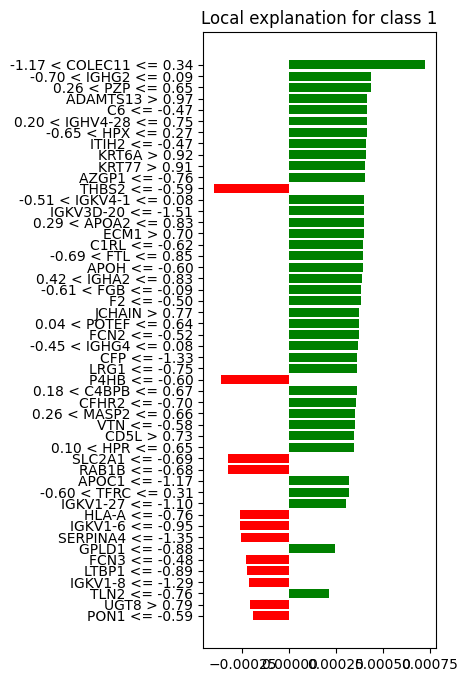

In [415]:
# plot impact of individual feature on model prediction.
# Here the green bars show they have positive impact i.e. they increase the model score, 
# while the ones in red decrease the score.

fig = exp.as_pyplot_figure(label = 1)
fig.set_figheight(8)
fig.set_figwidth(3)
fig.savefig('featureImportanceSingleRandomSample_' + target + '_quantType_' + quantType + '.svg')
fig.savefig('featureImportanceSingleRandomSample_' + target + '_quantType_' + quantType + '.tif')

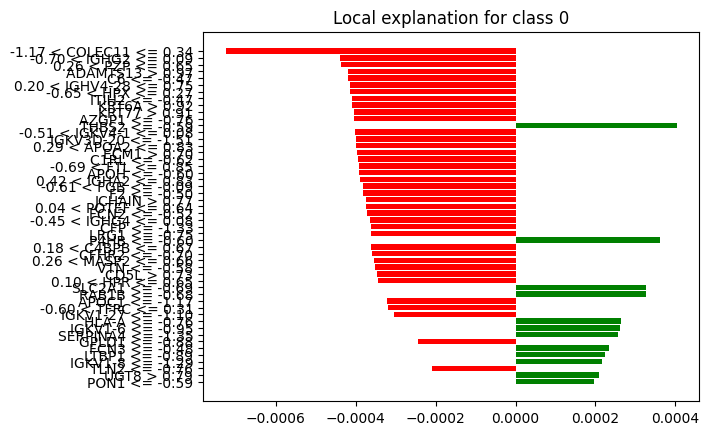

In [416]:
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

### SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model

In [417]:
# Let's use SP-LIME to return explanations on a few sample data sets 
# and obtain a non-redundant global decision perspective of the black-box model
import warnings
from lime import submodular_pick

sp_obj = submodular_pick.SubmodularPick(explainer, 
                                        Xlime,
                                        pipeline.predict_proba, 
                                        sample_size=10, #Xlime.shape[0],
                                        num_features=50,
                                        num_exps_desired=10, #Xlime.shape[0]
                                       )


Intercept 1.002278767955676
Prediction_local [0.99150066]
Right: 1.0
Intercept -0.012105366798310514
Prediction_local [0.0361425]
Right: 0.5
Intercept 1.0026702670409298
Prediction_local [0.99152519]
Right: 1.0
Intercept 1.0
Prediction_local [1.]
Right: 1.0
Intercept 1.0
Prediction_local [1.]
Right: 1.0
Intercept -0.019501349937755603
Prediction_local [0.06350866]
Right: 1.0
Intercept 1.0
Prediction_local [1.]
Right: 1.0
Intercept 1.0027002460509118
Prediction_local [0.99069044]
Right: 1.0
Intercept 1.0
Prediction_local [1.]
Right: 1.0
Intercept -0.02017025496965965
Prediction_local [0.07077111]
Right: 1.0


In [418]:
sp_obj.sp_explanations

KeyError: 1

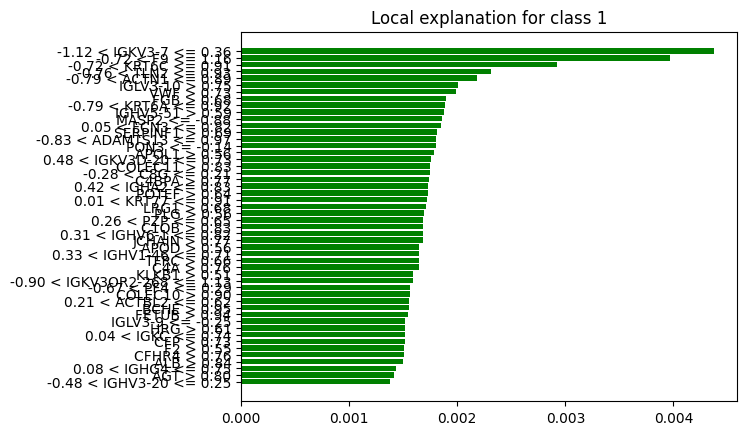

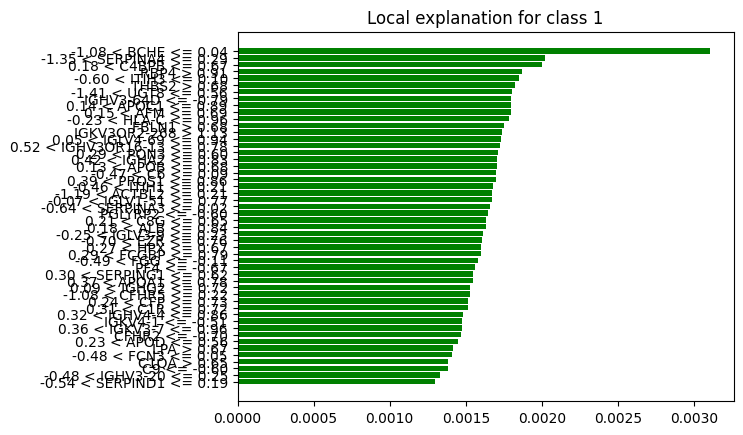

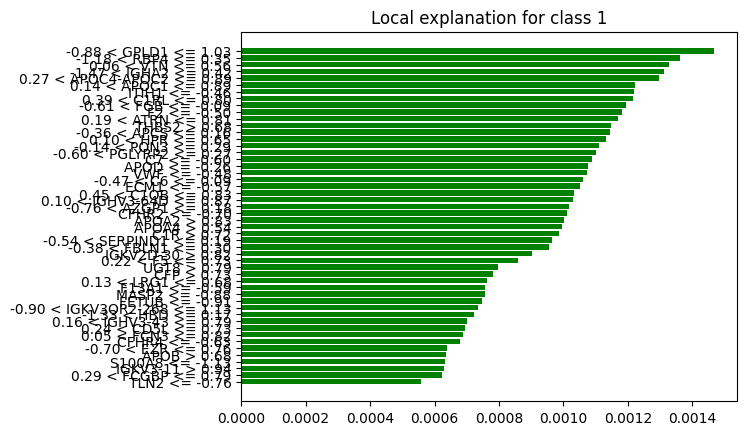

In [419]:
[exp.as_pyplot_figure() for exp in sp_obj.sp_explanations]
#[exp.as_pyplot_figure(label = 1) for exp in sp_obj.sp_explanations]

In [ ]:
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]
print('SP-LIME Explanations.')

In [ ]:
# These plots shows a global understanding of the model alongside the local explanations. 
# This is provided using the SP-LIME algorithm. You can see the plots on samples data to obtain
# global decision of perspective of black box models. 
# The red barplots indicate the range of feature values contribute more to the did not churn 
# while the green ones contribute toward the churn outcome.

[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_obj.sp_explanations]
print('SP-LIME Local Explanations')

In [ ]:
# not working
W = pd.DataFrame([dict(this.as_list()) for this in sp_obj.explanations])
W.head()

In [ ]:
# save/deploy pieline needs edited

# Saving the best model

#joblib.dump(best_model, './best_model.pkl')# Loading the best model
#load_model = joblib.load('C:\\filepath\\best_model.pkl')
#best_clf_pipe=load_model# Predicting the probability
#y_prob=best_clf_pipe.predict_proba(X_test)

# Testing the Pipeline
* Now that our pipeline is completed, we can move on to predicting on the copletely independent data found in dfTest

In [903]:
pipeline # Visualizing final pipeline

Pipeline(steps=[('Transforming Distribution',
                 RobustScaler(quantile_range=(25, 75))),
                ('Standard Scaler', StandardScaler()),
                ('Model',
                 KNeighborsClassifier(algorithm='ball_tree', leaf_size=45,
                                      metric='euclidean', n_jobs=6,
                                      n_neighbors=2))])

In [904]:
# Predicting with the pipeline. The key here is not 'fitting'
# could try .score!

#df = dfTest

# load from saved
dfTestFromDisk = pd.read_excel('dfTest_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.xlsx')
df = dfTestFromDisk

In [905]:
# select features based on dfTrain's RFE (optional)

fileName = 'selectedFeaturesRFECV_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed)

with open(fileName + '.json', 'r') as f:
    selected_featuresFromDisk = json.load(f)

colsToKeep = []
colsToKeep = copy.deepcopy(selected_featuresFromDisk)
colsToKeep.append(target)
#print(colsToKeep) # QC
df = df[colsToKeep] # selected features from RFE

In [906]:
len(colsToKeep)

240

In [907]:
# split into X and Y
# I am VERY CAREFUL to never confuse X_test with X, ever. Always the distinct X_test.

X_test, y_test = X_y_split(df, target)


X shape: (44, 239)


44 Samples 


239 Attributes 



,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,AMBP,ANGPTL6,ANK1,APCS,APOA1,APOA4,APOB,APOC1,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C2,C3,C4A,C4B,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAVIN2,CD14,CD5L,CETP,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFI,CFL1,CFP,CLEC3B,CLIC1,CLU,COLEC10,COLEC11,CP,CPN1,CPN2,DCD,ECM1,EHD1,EIF5A,EPB42,EZR,F11,F13A1,F13B,F2,F8,FBLN1,FCGBP,FCN2,FCN3,FERMT3,FGA,FGB,FGG,FN1,FTH1,FTL,GNAI2,GNAI3,GNB4,GSN,H4C1; H4C2; H4C3; H4C4; H4C5; H4C6; H4C8; H4C9; H4C11; H4C12; H4C13; H4C14; H4C15; H4C16,HBB,HLA-A,HLA-B,...,IGKV1-27,IGKV1-5,IGKV1-6,IGKV1-8,IGKV2-24,IGKV2-29,IGKV2D-30,IGKV3-11,IGKV3-7,IGKV3D-15,IGKV3D-20,IGKV3OR2-268,IGKV4-1,IGLC3,IGLL5,IGLV1-51,IGLV2-18,IGLV2-23,IGLV2-8,IGLV3-1,IGLV3-10,IGLV3-16,IGLV3-9,IGLV4-69,IGLV7-46,IGLV8-61,ITGA2B,ITGB3,ITIH1,ITIH2,JCHAIN,KLKB1,KNG1,KRT6C,KRT76,KRT77,LBP,LGALS3BP,LRG1,LTBP1,MASP1,MASP2,MBL2,MMRN1,MSN,OIT3,ORM2,P4HB,PARVB,PF4,PF4V1,PGK1,PGLYRP2,PIGR,PKM,PLG,PON1,POTEF,POTEI,PRDX2,PRDX6,PRG4,PROS1,PSMA1,RAB1A,RAB1B,RAC2,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTB,SVEP1,TFRC,THBS1,TLN2,TPM3,TUBA8,UGT8,VCL,VIM,VWF
0,0.238035,NaN,NaN,0.605869,0.220409,-0.132511,-0.596869,-0.865540,-0.289417,-0.372957,1.172745,NaN,-0.070720,-0.897465,-0.928159,-0.566976,NaN,0.902929,0.581758,NaN,1.594045,-1.649526,-0.343916,0.982251,-1.650383,1.367052,0.083562,-0.617656,-1.579179,-0.330489,NaN,NaN,0.499556,NaN,0.599549,NaN,-1.638428,-0.785318,NaN,0.253330,NaN,0.502241,NaN,-0.406187,-0.855190,-0.084710,0.217084,-0.240862,-0.233713,-1.944747,0.508187,-1.476623,1.417838,-1.055351,1.424947,0.583776,NaN,-0.236246,-2.093069,NaN,0.521045,NaN,NaN,0.129177,1.646892,-1.574021,-0.665041,1.065884,-1.435450,-1.338603,NaN,-0.365399,-0.281763,-0.944180,-0.729133,-0.823842,NaN,1.127426,-0.279967,1.133936,-1.081352,-0.615286,NaN,-0.838225,1.515577,0.603785,NaN,2.271634,2.364291,NaN,-1.821339,NaN,0.560577,-0.413379,0.178637,NaN,-1.934508,NaN,-2.639263,-0.200772,...,NaN,NaN,NaN,-0.190969,-1.078998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.616023,NaN,1.514535,-0.953890,-0.546531,NaN,NaN,-0.137057,-1.032969,NaN,-0.699623,-0.106021,NaN,NaN,1.041765,0.822590,-0.069542,0.377570,0.759450,-0.480312,0.411370,NaN,NaN,-1.254617,0.330693,0.970353,-0.398635,0.490583,-0.482262,-0.594783,-2.159847,0.516150,0.365121,-0.528246,0.852357,-0.362685,0.466030,0.753560,1.047235,-0.004678,-0.095651,-0.926084,0.320334,0.918277,0.711696,NaN,NaN,-0.886352,-0.170877,-1.748110,NaN,-0.571842,0.036442,0.198207,-0.681539,NaN,NaN,-0.801586,0.330027,-0.173315,-0.598865,-0.362183,NaN,NaN,-0.499650,0.430249,-1.209084,-1.025144,-1.436952,NaN,-0.243015,0.140800,-0.436434,0.217452,-1.050750,-0.116059,-0.957580,-0.900079,-1.475926,-0.948434,1.096785,-0.605986,0.487313,0.093620,NaN,0.854703,-0.662153,1.552332
1,0.164659,NaN,NaN,0.146783,-0.171783,-0.298763,-0.241311,-0.445396,0.533932,0.222233,0.934050,NaN,0.769089,-0.228196,0.927180,0.757005,NaN,0.915903,1.168087,NaN,1.479735,0.467366,0.327892,0.873659,-0.492791,1.062584,0.786377,-0.761883,-0.554813,-0.437489,NaN,-0.258929,0.838326,NaN,1.232928,NaN,0.505338,-0.401976,NaN,1.196137,NaN,1.050747,NaN,0.234977,-0.139964,0.357025,0.266994,0.197048,0.354152,-0.242436,0.242083,-0.742190,0.879236,-0.389584,1.123445,0.368533,-0.774333,0.497344,-0.306295,NaN,-0.133987,NaN,NaN,-0.439373,1.367450,-0.209102,0.142417,1.090241,-0.318549,0.240396,NaN,0.004649,-0.760707,-1.119579,0.429914,NaN,NaN,0.142468,0.243481,1.046841,-0.291914,-0.081572,NaN,0.499015,1.809455,-0.106283,NaN,2.044918,1.972252,NaN,-0.926708,-0.503758,0.223206,0.256464,-0.180346,NaN,0.146999,NaN,-0.428911,-0.307984,...,-0.310234,0.245991,NaN,-0.828773,-0.480386,0.39108,NaN,NaN,NaN,-0.078153,-0.401078,NaN,1.056306,NaN,1.784270,0.462979,NaN,NaN,NaN,0.058364,0.142212,NaN,0.452601,NaN,NaN,NaN,0.403469,0.314917,0.628363,0.930798,0.919494,0.186717,0.838755,NaN,NaN,0.571330,




y shape: (44,)


44 Samples 



0    c
1    c
2    c
3    c
4    c
Name: dfHarmonizedCancer, dtype: object

In [908]:
le = LabelEncoder()
y_test = pd.Series(le.fit_transform(y_test))
y_test

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     1
9     1
10    1
11    0
12    0
13    0
14    1
15    0
16    0
17    1
18    0
19    0
20    1
21    1
22    1
23    1
24    1
25    1
26    0
27    0
28    0
29    0
30    0
31    0
32    0
33    1
34    0
35    1
36    0
37    0
38    0
39    0
40    1
41    0
42    0
43    0
dtype: int64

In [909]:
le.classes_

array(['c', 'n'], dtype=object)

In [910]:
# new, have to use this!
imputeWideDFMinOr0(X_test)

X_test.isna().sum().sum()

quantType is areaHarmonized


0

In [911]:
X_test

,ACTBL2,ACTG1,ACTG2,ACTN1,ACTN4,ADAM10,ADAMTS13,ADIPOQ,AFM,AGT,AHSG,ALB,AMBP,ANGPTL6,ANK1,APCS,APOA1,APOA4,APOB,APOC1,APOC3,APOC4,APOD,APOE,APOF,APOH,APOL1,ARF3,ATRN,AZGP1,B2M,BCHE,C1QA,C1QB,C1QC,C1R,C1RL,C2,C3,C4A,C4B,C4BPB,C5,C6,C7,C8A,C8B,C8G,C9,CAMP,CAVIN2,CD14,CD5L,CETP,CFH,CFHR1,CFHR2,CFHR3,CFHR4,CFI,CFL1,CFP,CLEC3B,CLIC1,CLU,COLEC10,COLEC11,CP,CPN1,CPN2,DCD,ECM1,EHD1,EIF5A,EPB42,EZR,F11,F13A1,F13B,F2,F8,FBLN1,FCGBP,FCN2,FCN3,FERMT3,FGA,FGB,FGG,FN1,FTH1,FTL,GNAI2,GNAI3,GNB4,GSN,H4C1; H4C2; H4C3; H4C4; H4C5; H4C6; H4C8; H4C9; H4C11; H4C12; H4C13; H4C14; H4C15; H4C16,HBB,HLA-A,HLA-B,...,IGKV1-27,IGKV1-5,IGKV1-6,IGKV1-8,IGKV2-24,IGKV2-29,IGKV2D-30,IGKV3-11,IGKV3-7,IGKV3D-15,IGKV3D-20,IGKV3OR2-268,IGKV4-1,IGLC3,IGLL5,IGLV1-51,IGLV2-18,IGLV2-23,IGLV2-8,IGLV3-1,IGLV3-10,IGLV3-16,IGLV3-9,IGLV4-69,IGLV7-46,IGLV8-61,ITGA2B,ITGB3,ITIH1,ITIH2,JCHAIN,KLKB1,KNG1,KRT6C,KRT76,KRT77,LBP,LGALS3BP,LRG1,LTBP1,MASP1,MASP2,MBL2,MMRN1,MSN,OIT3,ORM2,P4HB,PARVB,PF4,PF4V1,PGK1,PGLYRP2,PIGR,PKM,PLG,PON1,POTEF,POTEI,PRDX2,PRDX6,PRG4,PROS1,PSMA1,RAB1A,RAB1B,RAC2,RAP1BL,RBP4,RDX,RSU1,S100A8,S100A9,SAA1,SAA2-SAA4,SERPINA1,SERPINA10,SERPINA3,SERPINA4,SERPINA6,SERPINA7,SERPINC1,SERPIND1,SERPINF1,SERPING1,SH3BGRL3,SLC2A1,SLC4A1,SPP2,SPTB,SVEP1,TFRC,THBS1,TLN2,TPM3,TUBA8,UGT8,VCL,VIM,VWF
0,0.238035,-1.546379,-1.517205,0.605869,0.220409,-0.132511,-0.596869,-0.865540,-0.289417,-0.372957,1.172745,1.780387,-0.070720,-0.897465,-0.928159,-0.566976,0.907636,0.902929,0.581758,-0.592424,1.594045,-1.649526,-0.343916,0.982251,-1.650383,1.367052,0.083562,-0.617656,-1.579179,-0.330489,-1.261668,-1.903144,0.499556,-0.498124,0.599549,-0.628925,-1.638428,-0.785318,0.912974,0.253330,-0.287666,0.502241,-0.099786,-0.406187,-0.855190,-0.084710,0.217084,-0.240862,-0.233713,-1.944747,0.508187,-1.476623,1.417838,-1.055351,1.424947,0.583776,-1.398915,-0.236246,-2.093069,-1.276481,0.521045,-1.537439,-2.277797,0.129177,1.646892,-1.574021,-0.665041,1.065884,-1.435450,-1.338603,-1.823856,-0.365399,-0.281763,-0.944180,-0.729133,-0.823842,-2.327530,1.127426,-0.279967,1.133936,-1.081352,-0.615286,-0.968128,-0.838225,1.515577,0.603785,0.230725,2.271634,2.364291,-1.510366,-1.821339,-1.423619,0.560577,-0.413379,0.178637,-1.635682,-1.934508,0.191164,-2.639263,-0.200772,...,-2.088498,-1.523708,-1.643362,-0.190969,-1.078998,-0.454385,-1.464564,-1.007592,-0.946471,-1.080966,-0.888950,-0.448082,0.616023,1.535467,1.514535,-0.953890,-0.546531,-1.498534,0.211458,-0.137057,-1.032969,-1.208818,-0.699623,-0.106021,-0.870998,-1.147338,1.041765,0.822590,-0.069542,0.377570,0.759450,-0.480312,0.411370,-1.471315,-1.471315,-1.254617,0.330693,0.970353,-0.398635,0.490583,-0.482262,-0.594783,-2.159847,0.516150,0.365121,-0.528246,0.852357,-0.362685,0.466030,0.753560,1.047235,-0.004678,-0.095651,-0.926084,0.320334,0.918277,0.711696,-1.582939,-1.582939,-0.886352,-0.170877,-1.748110,-0.648435,-0.571842,0.036442,0.198207,-0.681539,-1.993503,-1.792875,-0.801586,0.330027,-0.173315,-0.598865,-0.362183,-1.090581,0.031064,-0.499650,0.430249,-1.209084,-1.025144,-1.436952,-1.558442,-0.243015,0.140800,-0.436434,0.217452,-1.050750,-0.116059,-0.957580,-0.900079,-1.475926,-0.948434,1.096785,-0.605986,0.487313,0.093620,1.019992,0.854703,-0.662153,1.552332
1,0.164659,-1.546379,-1.517205,0.146783,-0.171783,-0.298763,-0.241311,-0.445396,0.533932,0.222233,0.934050,1.780387,0.769089,-0.228196,0.927180,0.757005,0.907636,0.915903,1.168087,-0.592424,1.479735,0.467366,0.327892,0.873659,-0.492791,1.062584,0.786377,-0.761883,-0.554813,-0.437489,-1.261668,-0.258929,0.838326,-0.498124,1.232928,-0.628925,0.505338,-0.401976,0.912974,1.196137,-0.287666,1.050747,-0.099786,0.234977,-0.139964,0.357025,0.266994,0.197048,0.354152,-0.242436,0.242083,-0.742190,0.879236,-0.389584,1.123445,0.368533,-0.774333,0.497344,-0.306295,-1.276481,-0.133987,-1.537439,-2.277797,-0.439373,1.367450,-0.209102,0.142417,1.090241,-0.318549,0.240396,-1.823856,0.004649,-0.760707,-1.119579,0.429914,-2.858817,-2.327530,0.142468,0.243481,1.046841,-0.291914,-0.081572,-0.9

In [912]:
genesWithNANs = X_test.columns[X_test.isna().any()].tolist()
genesWithNANs

[]

In [913]:
X_test[genesWithNANs]

""
0
1
2
3
4
5
6
7
8
9


In [914]:
min(X_test.min())

-2.85881723391613

In [915]:
# drop these genes since can't test
# don't do, or it will error that there are different values than those that were fit on

#X_test.drop(genesWithNANs, axis=1, inplace = True)

# set to min value in df
X_test[genesWithNANs] = min(X_test.min())
X_test[genesWithNANs]

""
0
1
2
3
4
5
6
7
8
9


In [916]:
# QC

X_test.isna().sum().sum()
#X_test.isna().sum()

0

In [917]:
pipeline#.score(X_test)

Pipeline(steps=[('Transforming Distribution',
                 RobustScaler(quantile_range=(25, 75))),
                ('Standard Scaler', StandardScaler()),
                ('Model',
                 KNeighborsClassifier(algorithm='ball_tree', leaf_size=45,
                                      metric='euclidean', n_jobs=6,
                                      n_neighbors=2))])

In [918]:
y_pred = pipeline.predict(X_test) # .predict(X)
y_pred # Visualizing predictions

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0])

In [919]:
y_prob = pipeline.predict_proba(X_test) # .predict(X)
y_prob # Visualizing predictions

array([[1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [0.5, 0.5],
       [0.5, 0.5],
       [0. , 1. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [0. , 1. ],
       [1. , 0. ],
       [1. , 0. ],
       [0. , 1. ],
       [0.5, 0.5],
       [0.5, 0.5],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0. , 1. ],
       [0.5, 0.5],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [0. , 1. ],
       [1. , 0. ],
       [1. , 0. ],
       [1. , 0. ],
       [0.5, 0.5],
       [1. , 0. ],
       [1. , 0. ],
       [0. , 1. ],
       [1. , 0. ],
       [0.5, 0.5],
       [1. , 0. ]])

In [920]:
# fuss with formatting for this output
y_prob = [i[1] for i in y_prob]

# append to lists
y_predList.append(y_pred)
y_testList.append(y_test)
y_probList.append(y_prob)
seedListStats.append(seed)
trainFracListStats.append(trainFrac)

In [921]:
# make a final pipeline list
import glob

finalPipelineList = glob.glob('*FinalPipeline.pkl') # needs to add in Pytorch or AutoSKLearn
finalPipelineList = natsorted(finalPipelineList)

## stats

In [922]:
print(len(X_test))
print(len(y_test))
print(len(y_pred))

44
44
44


In [923]:
# sklearn scoring: https://scikit-learn.org/stable/modules/model_evaluation.html

print("Balanced Accuracy", sklearn.metrics.balanced_accuracy_score(y_test, y_pred))
print("Precision", sklearn.metrics.precision_score(y_test, y_pred))
print("Recall", sklearn.metrics.recall_score(y_test, y_pred))
print("ROC AUC score", sklearn.metrics.roc_auc_score(y_test, y_pred))
print("F1 score", sklearn.metrics.f1_score(y_test, y_pred))

# autoSKLearn scoring
#s = pipeline.score(X_train, y_train)
#print(f"Train score {s}")
s = pipeline.score(X_test, y_test)
print(f"Test score {s}")

Balanced Accuracy 0.8928571428571428
Precision 1.0
Recall 0.7857142857142857
ROC AUC score 0.8928571428571428
F1 score 0.88
Test score 0.9318181818181818


In [924]:
print("Confusion matrix\n", sklearn.metrics.confusion_matrix(y_test, y_pred))

Confusion matrix
 [[30  0]
 [ 3 11]]


In [925]:
from sklearn.metrics import RocCurveDisplay, roc_curve

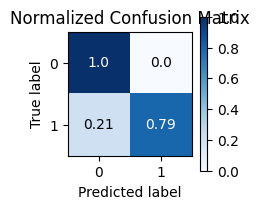

In [960]:
# plot normalized confusion matrix - https://scikit-plot.readthedocs.io/en/stable/metrics.html
# this is most recent seed
skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=True,figsize=(2,2))
plt.show()

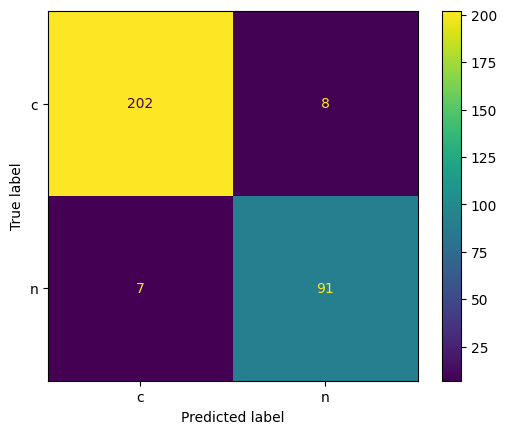

In [927]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from collections.abc import Iterable

def flatten(lis):
     for item in lis:
         if isinstance(item, Iterable) and not isinstance(item, str):
             for x in flatten(item):
                 yield x
         else:        
             yield item
             
#cm = confusion_matrix(y_test, y_pred) # for one trial
cm = confusion_matrix(list(flatten(y_testList)), list(flatten(y_predList))) # for many trials

# for all models
from collections.abc import Iterable

cm = confusion_matrix(list(flatten(y_testList)), list(flatten(y_predList))) # for all models

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot()
plt.show()

In [928]:
# save above plot
#disp.figure_.savefig('confusionMatrix_' + target + '.pdf') # rastering messed up
disp.figure_.savefig('confusionMatrix_' + target + '_quantType_' + quantType + '_seed_' + str(seed) + '.svg')
disp.figure_.savefig('confusionMatrix_' + target + '_quantType_' + quantType + '_seed_' + str(seed) + '.tif')

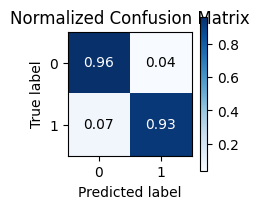

In [968]:
# plot normalized confusion matrix for all models - https://scikit-plot.readthedocs.io/en/stable/metrics.html
skplt.metrics.plot_confusion_matrix(list(flatten(y_testList)), list(flatten(y_predList)), normalize=True,figsize=(2,2))
 
#plt.show() # comment this out to save
#plt.savefig('normalizedConfusionMatrix_' + target + '.pdf') # rastering messed up
plt.savefig('normalizedConfusionMatrix_' + target + '_quantType_' + quantType + '_aggregatedLists' +'.svg')
plt.savefig('normalizedConfusionMatrix_' + target + '_quantType_' + quantType + '_aggregatedLists' +'.tif')

In [953]:
# save above plot. not working

#plt.savefig('normalizedConfusionMatrix_' + target + '.pdf') # rastering messed up
plt.savefig('normalizedConfusionMatrix_' + target + '_quantType_' + quantType + '_seed_' + str(seed) +'.svg')
plt.savefig('normalizedConfusionMatrix_' + target + '_quantType_' + quantType + '_seed_' + str(seed) +'.tif')

<Figure size 640x480 with 0 Axes>

In [931]:
# Classification Report for 1 model

print(classification_report(y_test,y_pred, target_names = le.classes_))

              precision    recall  f1-score   support

           c       0.91      1.00      0.95        30
           n       1.00      0.79      0.88        14

    accuracy                           0.93        44
   macro avg       0.95      0.89      0.92        44
weighted avg       0.94      0.93      0.93        44



In [932]:
# Classification Report for all models

print(classification_report(list(flatten(y_testList)), list(flatten(y_predList)), target_names = le.classes_))

              precision    recall  f1-score   support

           c       0.97      0.96      0.96       210
           n       0.92      0.93      0.92        98

    accuracy                           0.95       308
   macro avg       0.94      0.95      0.94       308
weighted avg       0.95      0.95      0.95       308



In [933]:
# multilabel confusion matrix. No point for binary classification.
from sklearn.metrics import multilabel_confusion_matrix

multilabelCM = multilabel_confusion_matrix(y_test, y_pred)
multilabelCM

array([[[11,  3],
        [ 0, 30]],

       [[30,  0],
        [ 3, 11]]])

## Test stastistics
* https://en.wikipedia.org/wiki/Template:Diagnostic_testing_diagram
* interpretations: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2556590/

<img src="https://i.stack.imgur.com/AuTKP.png" width="300">

In [934]:
# need to update balanced accuracy in all code!
# uses cm, which is all y lists

TN = cm[0][0]
FN = cm[1][0] # type II error
TP = cm[1][1]
FP = cm[0][1] # Type I error

# Sensitivity, hit rate, recall, or true positive rate
TPR = TP/(TP+FN)
# Specificity or true negative rate
TNR = TN/(TN+FP) 
# Precision or positive predictive value
precision = TP/(TP+FP)
# Negative predictive value
NPV = TN/(TN+FN)
# Fall out or false positive rate
FPR = FP/(FP+TN)
# balanced accurcy
bACC = (TPR + TNR) / 2
# False negative rate
FNR = FN/(TP+FN)
# False discovery rate
FDR = FP/(TP+FP)
# F1 score
F1 = (2 * TP) / (2 * TP + FP + FN)
# False ommission rate
FOR = 1 - NPV
# LR+, positive liklihood ratio
LRpos = TPR / FPR
# LR-, negative liklihood ratio
LRneg = FNR / TNR
# diagnostic odds ratio
oddsRatio = LRpos/LRneg

# Overall accuracy
ACC = (TP+TN)/(TP+FP+FN+TN)

# note, the error below may be a warning

In [969]:
print("the sensitivity/TPR is: " + str(TPR))
print("the specificity/TNR is: " + str(TNR))
print("the accuracy is: " + str(ACC))
print("the balanced accuracy is: " + str(bACC))
print("the positive predictive value (PPV) aka precision is " + str(PPV))
print("the negative predictive value (NPV) is " + str(NPV))
print("the diagnostic odds ratio is " + str(oddsRatio))
print("The positive LR is " + str(LRpos))
print("The negative LR is " + str(LRneg))
print("The F1 score is " + str(F1))

the sensitivity/TPR is: 0.9285714285714286
the specificity/TNR is: 0.9619047619047619
the accuracy is: 0.9512987012987013
the balanced accuracy is: 0.9452380952380952
the positive predictive value (PPV) aka precision is 0.9285714285714286
the negative predictive value (NPV) is 0.9665071770334929
the diagnostic odds ratio is 328.25
The positive LR is 24.375
The negative LR is 0.07425742574257425
The F1 score is 0.9238578680203046


In [936]:
# should be true if setup correctly
#len(y_test) == FP + FN + TP + TN # for 1 model
len(list(flatten(y_testList))) == FP + FN + TP + TN # for all models

True

## ROC
* from scratch: https://towardsdatascience.com/roc-curve-and-auc-from-scratch-in-numpy-visualized-2612bb9459ab

<img src="https://miro.medium.com/v2/resize:fit:1200/1*X-pebxJ1AIq9oCT40GQo2A.gif" width="500">

### characterization of ROC AUC
* "AUC is a global measure of diagnostic accuracy." https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4975285/
* 

In [937]:
def true_false_positive(threshold_vector, y_test): # threshold_vector is input as y_prob
    true_positive = np.equal(threshold_vector, 1) & np.equal(y_test, 1)
    true_negative = np.equal(threshold_vector, 0) & np.equal(y_test, 0)
    false_positive = np.equal(threshold_vector, 1) & np.equal(y_test, 0)
    false_negative = np.equal(threshold_vector, 0) & np.equal(y_test, 1)

    tpr = true_positive.sum() / (true_positive.sum() + false_negative.sum())
    fpr = false_positive.sum() / (false_positive.sum() + true_negative.sum())

    return tpr, fpr # ROC[:,0] is fpr, ROC[:,1] is tpr

def roc_from_scratch(probabilities, y_test, partitions=100):
    roc = np.array([])
    for i in range(partitions + 1):
        
        threshold_vector = np.greater_equal(probabilities, i / partitions).astype(int)
        tpr, fpr = true_false_positive(threshold_vector, y_test)
        roc = np.append(roc, [fpr, tpr])
        
    return roc.reshape(-1, 2)

Text(0, 0.5, 'True Positive Rate')

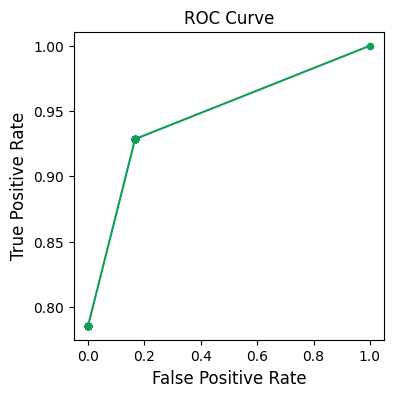

In [938]:
plt.figure(figsize=(4,4))

ROC = roc_from_scratch(y_prob,y_test,partitions=100)
plt.scatter(ROC[:,0],ROC[:,1],color='#0F9D58',s=20)
plt.plot(ROC[:,0],ROC[:,1],color='#0F9D58')
plt.title('ROC Curve',fontsize=12)
plt.xlabel('False Positive Rate',fontsize=12)
plt.ylabel('True Positive Rate',fontsize=12)

In [939]:
y_prob

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.5,
 0.5,
 1.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 1.0,
 0.5,
 0.5,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.5,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.5,
 0.0,
 0.0,
 1.0,
 0.0,
 0.5,
 0.0]

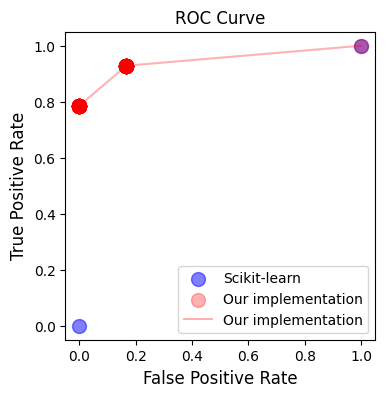

In [940]:
# another way
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_prob) # y_prob[:,1]
#fpr, tpr, thresholds = roc_curve(y_test, y_prob) # way that usualy works

plt.figure(figsize=(4, 4))
plt.scatter(fpr, tpr, s=100, alpha=0.5, color="blue", label="Scikit-learn")
plt.scatter(ROC[:, 0], ROC[:, 1], color="red", s=100, alpha=0.3, label="Our implementation")
plt.plot(ROC[:, 0], ROC[:, 1], color="red", alpha=0.3, label="Our implementation")
plt.title("ROC Curve", fontsize=12)
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend()

In [941]:
# calc the AUROC
partitions = 100

ROC = roc_from_scratch(y_prob, y_test, partitions=partitions) # y_prob[:,1]
#ROC = roc_from_scratch(y_prob, y_test, partitions=partitions) # way that usually works
fpr, tpr = ROC[:, 0], ROC[:, 1]
rectangle_roc = 0
for k in range(partitions):
        rectangle_roc = rectangle_roc + (fpr[k]- fpr[k + 1]) * tpr[k]
print('The AUROC is: ' + str(rectangle_roc))

The AUROC is: 0.9880952380952381


AUROC is 0.9666666666666667
AUROC is 0.9666666666666667
AUROC is 1.0
AUROC is 0.9666666666666668
AUROC is 0.9333333333333333
AUROC is 0.9952380952380953
AUROC is 0.9880952380952381


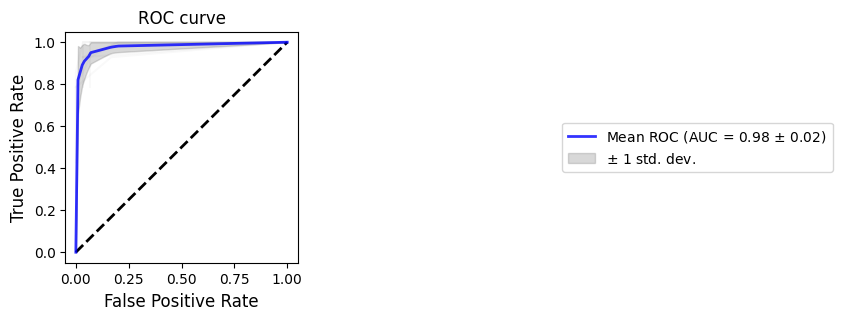

In [942]:
# overlaid ROC
from sklearn.metrics import auc

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100) # regularly spaced points

#set up plotting area
plt.figure(figsize=(3, 3))
ax = plt.axes() # enables overlay

plt.plot([0, 1], [0, 1],'--', color = 'black', lw = 2)
plt.xlim([0, 1])
plt.ylim([0, 1])

#plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

fprList = []
tprList = []

for y_prob, y_test in zip(y_probList,y_testList):
    
    ROC = roc_from_scratch(np.reshape(y_prob,(-1)),y_test,partitions=100) # y_prob[:,1]
    #ROC = roc_from_scratch(y_prob,y_test,partitions=100) # way that usually works

    #plt.scatter(ROC[:,0],ROC[:,1],color='black',s=20, alpha = 0.8)
    plt.plot(ROC[:,0],ROC[:,1],color='black', alpha = 0.025)
    plt.title('ROC Curve',fontsize=12)
    plt.xlabel('False Positive Rate',fontsize=12)
    plt.ylabel('True Positive Rate',fontsize=12)
    #print(ROC[:,1])

    sort = np.argsort(ROC[:,0])
    interp_tpr = np.interp(mean_fpr, ROC[:,0][sort], ROC[:,1][sort]) # interp needs to be sorted
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    rectangle_roc = 0
    for k in range(partitions):
        fpr, tpr = ROC[:, 0], ROC[:, 1]
        rectangle_roc = rectangle_roc + (fpr[k]- fpr[k + 1]) * tpr[k]
    print('AUROC is ' + str(rectangle_roc))    
    aucs.append(rectangle_roc)

    #if auc < 0.5:
    #    probs = [-x for x in probs]

mean_tpr = np.mean(tprs, axis=0)
#print(mean_tpr)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
ax.plot(mean_fpr, mean_tpr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.3,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="ROC curve")

plt.plot()
ax.legend(bbox_to_anchor=(3.3, .5), loc='center right', borderaxespad=0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.savefig('ROC_overlaid_' + target + '_quantType_' + quantType + '.pdf',format='pdf', dpi=500, bbox_inches='tight')# axis labels
plt.savefig('ROC_overlaid_' + target + '_quantType_' + quantType + '.svg',format='svg', dpi=500, bbox_inches='tight')# axis labels. Saves to Fugure2 folder currently

In [943]:
# in progress

from itertools import chain
y_testListFlat = list(chain.from_iterable(y_testList)) 
y_predListFlat = list(chain.from_iterable(y_predList))
#y_probListFlat = list(chain.from_iterable(y_probList)) # usually works
y_probListFlat = list(chain.from_iterable(y_probList)) # y_probList[:,1]
y_1MinusProbListFlat = [1 - x for x in y_probListFlat]
y_predProbAFormattedLikeSKLearn = np.stack((y_1MinusProbListFlat, y_probListFlat), axis = 1)

In [945]:
len(y_probList)

7

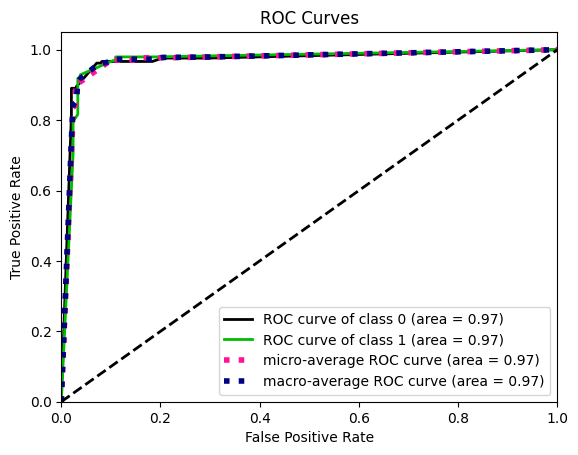

In [946]:
# non-customizable ROC plot using scikitplot: based on https://scikit-plot.readthedocs.io/en/stable/metrics.html
# X_test and y_test are going to be the final ones from the train_test split, just FYI

# plot the whole combined list of values and predictions
plt_ = skplt.metrics.plot_roc(y_testListFlat, y_predProbAFormattedLikeSKLearn, # way that usually works
#                             figsize=(3, 3),
                             #plot_micro = False,
                             #plot_macro = False,
#                             cmap='Dark2', #Dark2, tab10
                            ) 

#plt_.legend(bbox_to_anchor=(2.45, .55), loc='center right', borderaxespad=0)
#plt_.figure.savefig('ROC_overlaid_scikitplot_TestSizes' + str(testSizes) + '.pdf',format='pdf', dpi=500, bbox_inches='tight')
#plt_.figure.savefig('ROC_overlaid_scikitplot_TestSizes' + str(testSizes) + '.svg',format='svg', dpi=500, bbox_inches='tight')

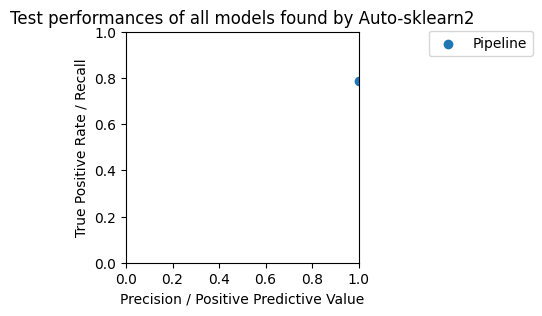

In [947]:
fig = plt.figure(figsize=(3, 3))
ax = fig.add_subplot()

# predict on the test data using the single-objective Auto-sklearn & plot perf
single_objective_precision = sklearn.metrics.precision_score(y_test, y_pred)
single_objective_recall = sklearn.metrics.recall_score(y_test, y_pred)

ax.scatter(single_objective_precision, single_objective_recall, label= "Pipeline")

# Label the plot
_ = ax.set_xlabel("Precision / Positive Predictive Value")
_ = ax.set_ylabel("True Positive Rate / Recall")
_ = ax.set_xlim((0, 1))
_ = ax.set_ylim((0, 1))
_ = ax.legend(bbox_to_anchor=(1.75, .95), loc='center right', borderaxespad=0)
_ = ax.set_title("Test performances of all models found by Auto-sklearn2")

# save final lists so that I don't have to remake them.

In [948]:
type(y_predList)#.to_list()

list

In [949]:
# save final classification lists to disk
import pickle

# save y_predList
fileName = 'y_predList_target-' + target + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl'

with open(fileName, "wb") as fp:   #Pickling
    pickle.dump(y_predList, fp)

# reload y_predList
with open(fileName, "rb") as fp:   # Unpickling
    y_predList = pickle.load(fp)



# save y_probList
fileName = 'y_probList_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl'

with open(fileName, "wb") as fp:   #Pickling
    pickle.dump(y_probList, fp)

# reload y_probList
with open(fileName, "rb") as fp:   # Unpickling
    y_probList = pickle.load(fp)



# save y_testList
fileName = 'y_testList_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl'

with open(fileName, "wb") as fp:   #Pickling
    pickle.dump(y_testList, fp)

# reload y_probList
with open(fileName, "rb") as fp:   # Unpickling
    y_testList = pickle.load(fp)


# save finalImportancesMeanList
fileName = 'finalImportancesMeanList_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl'

with open(fileName, "wb") as fp:   #Pickling
    pickle.dump(finalImportancesMeanList, fp)

# reload finalImportancesMeanList
with open(fileName, "rb") as fp:   # Unpickling
    finalImportancesMeanList = pickle.load(fp)
    

# save finalFeaturesList
fileName = 'finalFeaturesList_target-' + target + '_quantType_' + quantType + '_nSampleFilter' + str(nSamplesVal) + '_trainFrac-' + str(trainFrac) + '_seed-' + str(seed) + '.pkl'

with open(fileName, "wb") as fp:   #Pickling
    pickle.dump(finalFeaturesList, fp)

# reload finalFeaturesList
with open(fileName, "rb") as fp:   # Unpickling
    finalFeaturesList = pickle.load(fp)

<h1 id = 'deploy' style="border-bottom: 1px solid #ccc;
                        padding-bottom: 10px;
                        margin-bottom: 10px;
                        font-size: 38px;
                        font-weight: bold;
                        color: black;
                        font-family: Poppins">Deploying Pipeline</h1>

<p style="font-size: 20px">For the first time after completing a task on Kaggle, I've decided to save the pipeline with the aim of deploying my model. 
    <br><br>
I used the <code>joblib</code> library to save my pipeline in a .pkl file, as you can see below.</p>

In [ ]:
import joblib

joblib.dump(pipeline, 'wine_quality_prediction.pkl')

In [ ]:
## end wine example

In [ ]:
# delete

from sklearn import datasets
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.preprocessing import MinMaxScaler, StandardScaler

iris = datasets.load_iris()
X = iris.data
y = iris.target

pipeT = Pipeline([
        ("scaler", StandardScaler()),
        ("learner", None)
    ])

svm_param = {
        'learner': [LinearSVC()],
        # 'learner__dual': [True, False],  # with True svm selects random features
        'learner__C': [0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],  # uniform(loc=1e-5, scale=1e+5),  # [0.5, 1.0, 2],
        'learner__tol': [1e-4],  # svm_learner_tol,  # [1e-5, 1e-4, 1e-3],
        'learner__random_state': [22],
        'learner__max_iter': [1000]}



gridT = GridSearchCV(
    pipeT, param_grid=svm_param, 
    scoring="accuracy",
    verbose=2,
    refit=True, 
    cv = 5, return_train_score=True)
    
gridT.fit(X, y)

In [ ]:
pipeT